# Analysis Of AC Products

In [1]:
#importing all the packages required
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Reading Cleaned Data

In [2]:
data = pd.read_excel(r"AC_Dataset_Cleaned.xlsx")

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 667 entries, 0 to 666
Data columns (total 49 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Unnamed: 0                    667 non-null    int64  
 1   Brand                         667 non-null    object 
 2   Model Name                    667 non-null    object 
 3   Type                          667 non-null    int64  
 4   Capacity in Tons              667 non-null    float64
 5   Star Rating                   667 non-null    int64  
 6   Series                        667 non-null    object 
 7   Cooling and Heating           667 non-null    object 
 8   Cooling Capacity              667 non-null    float64
 9   Compressor                    667 non-null    object 
 10  Dehumidification              667 non-null    object 
 11  Remote Control                667 non-null    object 
 12  Refrigerant                   667 non-null    object 
 13  Opera

In [4]:
data = data.drop('Unnamed: 0',axis = 1)

# Numerical Columns

In [5]:
num_vars = data.select_dtypes(exclude =["object","uint8"]).columns

In [6]:
num_vars

Index(['Type', 'Capacity in Tons', 'Star Rating', 'Cooling Capacity',
       'Indoor Unit Weight', 'Outdoor Unit Weight', 'ISEER',
       'Power Requirement', 'Power Consumption', 'Price',
       'low Indoor Noise Level', 'high Indoor Noise Level', 'indoor W',
       'indoor h', 'indoor d', 'outdoor W', 'outdoor h', 'outdoor d'],
      dtype='object')

# Univarient Analysis

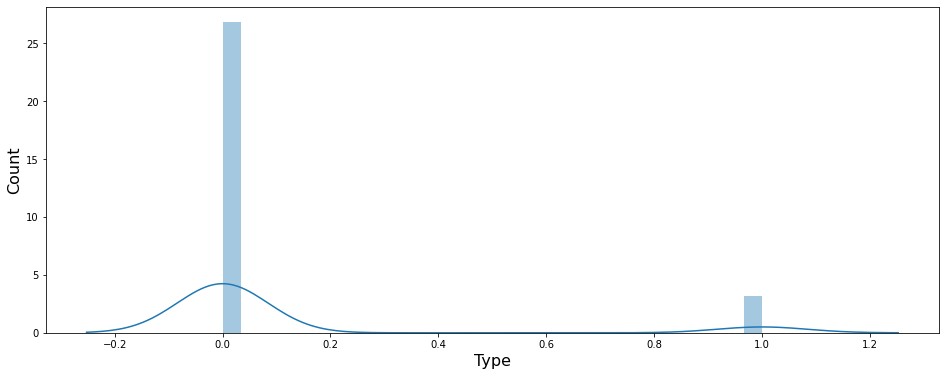

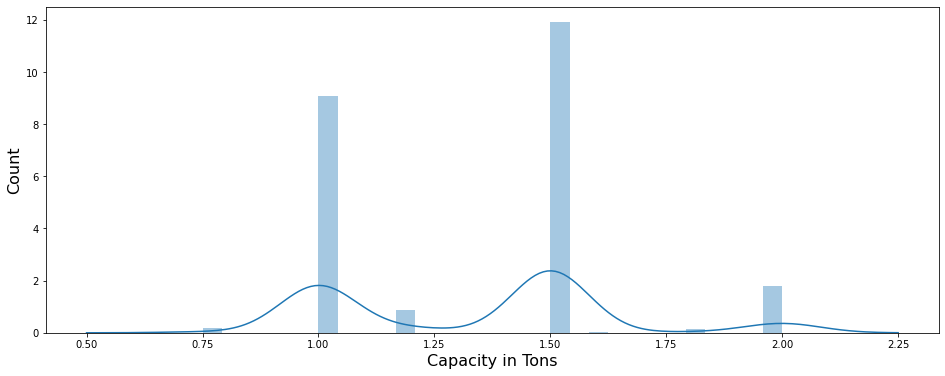

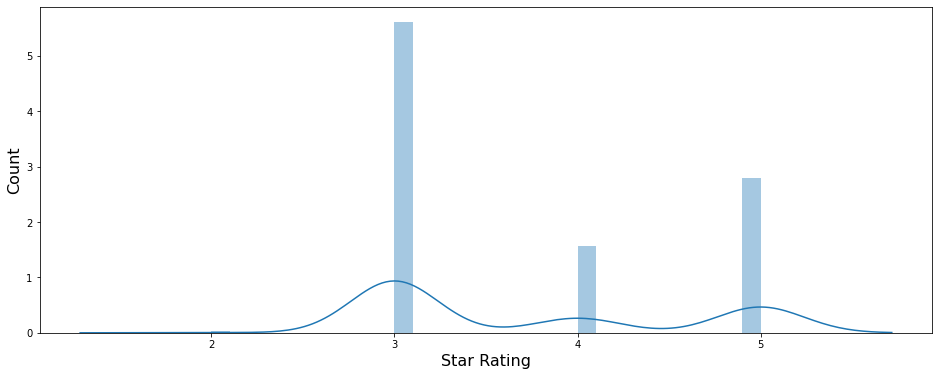

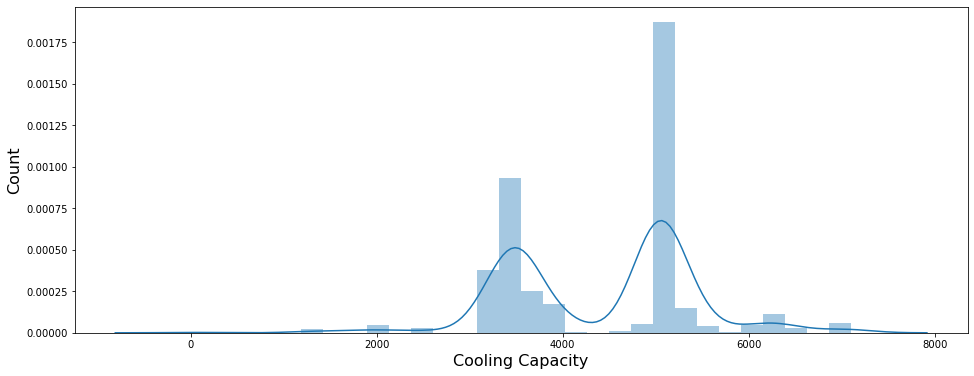

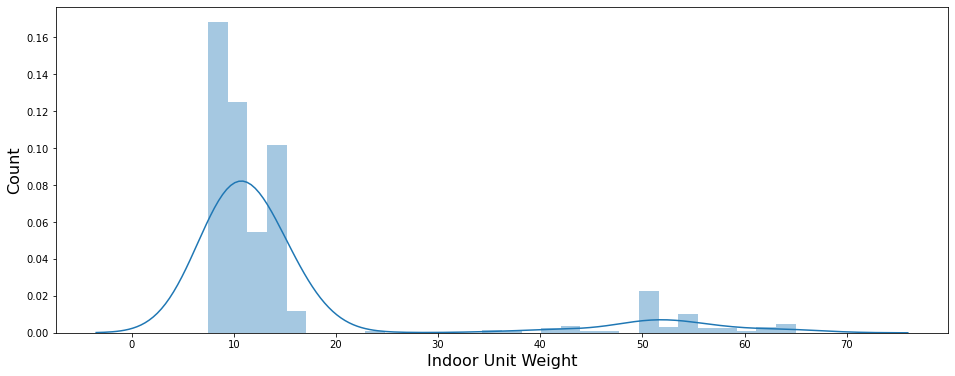

...

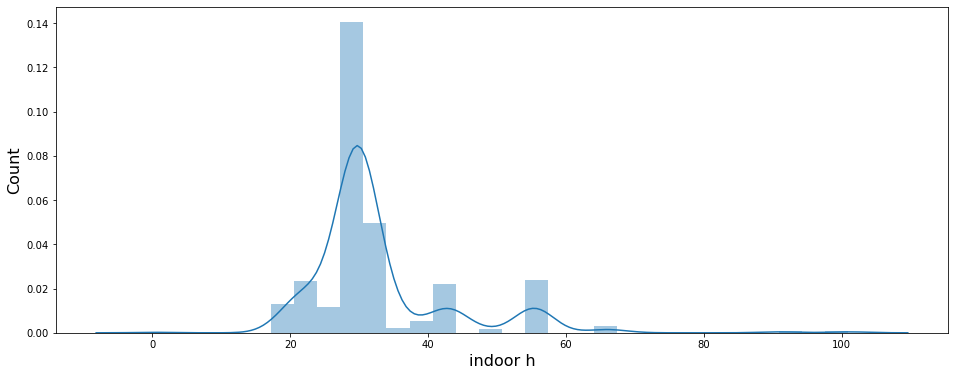

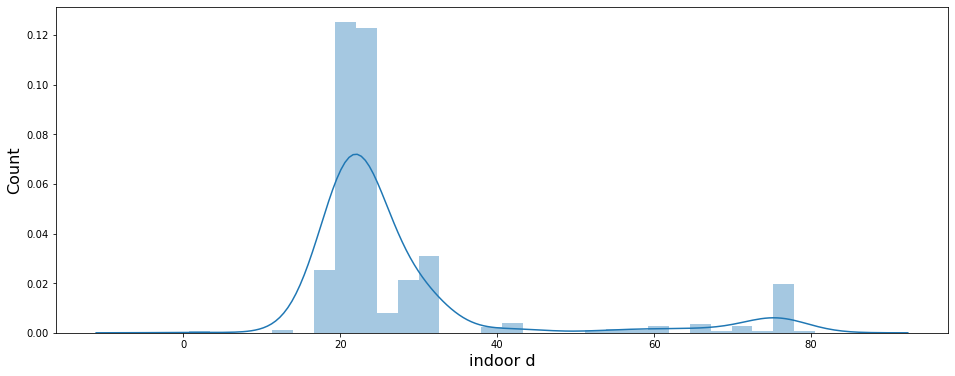

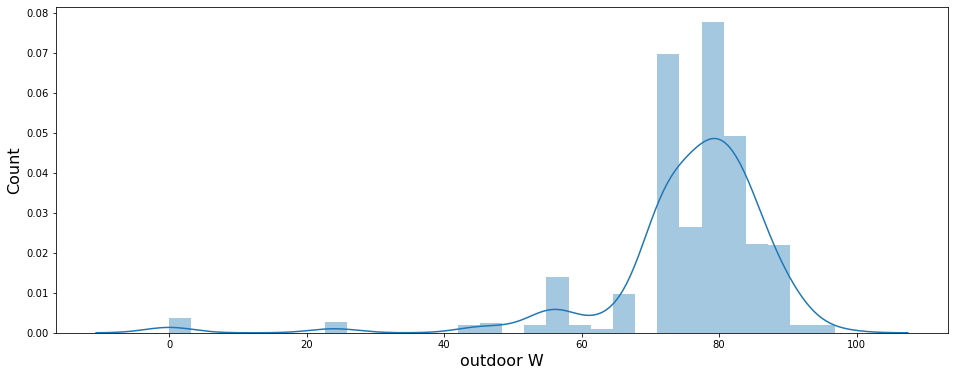

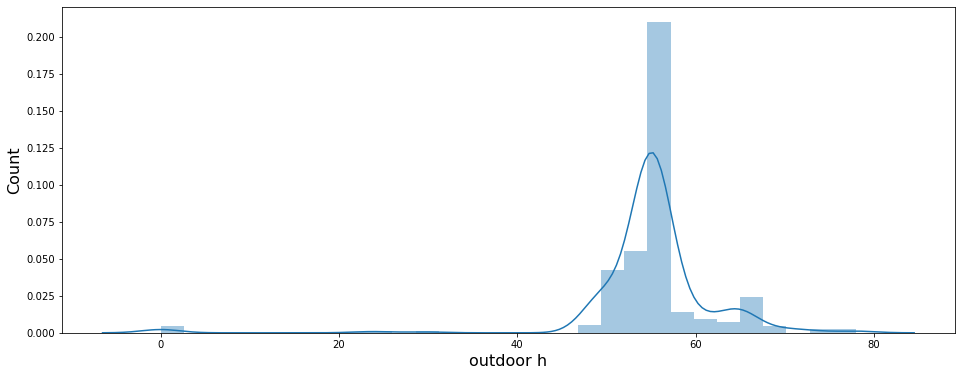

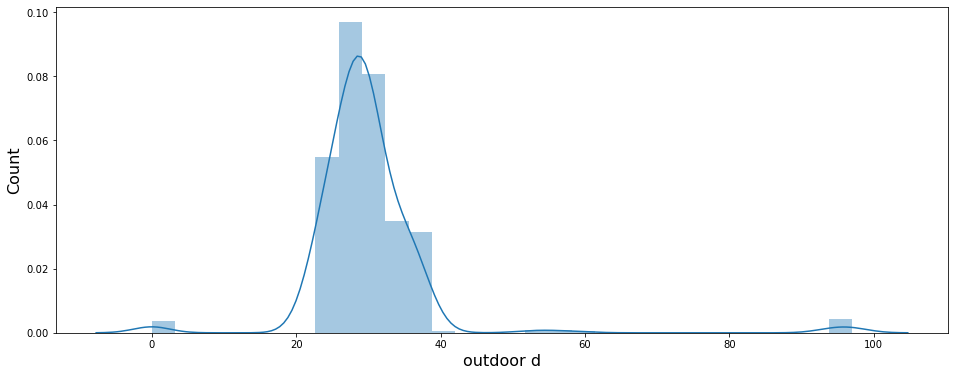

In [7]:
#loop for distplots
for col_name in num_vars:
    plt.figure(figsize=(16, 6))
    sns.distplot(data[col_name], kde=True, bins=30)
    plt.xlabel(col_name, fontsize=16)
    plt.ylabel("Count", fontsize=16)
    plt.show()

# Observations

1. Count Of Split AC is more than Window AC

2. Cooling Capacity is Right Skewed

3. Indoor Unit Weight is Left Skewed

4. Outdoor Unit Weight is Some what Normally Distributed.

5. ISEER is Right Skewed

6. Power Requirement is Right Skewed with mostly values at 230.

7. Power Consumptiom is Left Skewed with maximum Present values present between 500 to 2500V

8. Price is our Target Variable and it is left skewed with max AC have price value as 3000-4000.

9. Indoor and outdoor dimensions are all left skewed, that is most AC have compact components.

10. lowest indoor noise level is some what Normally Distributed and highest indoor noise level too is left skewed.


# Outliers

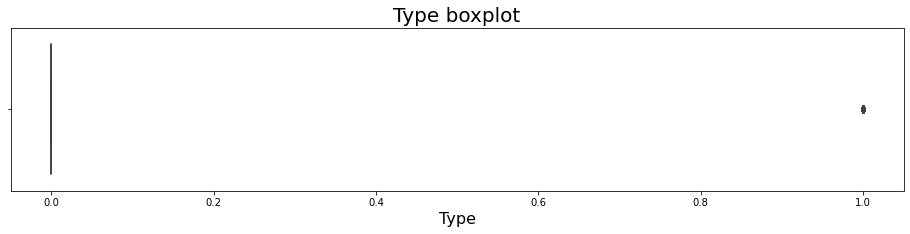

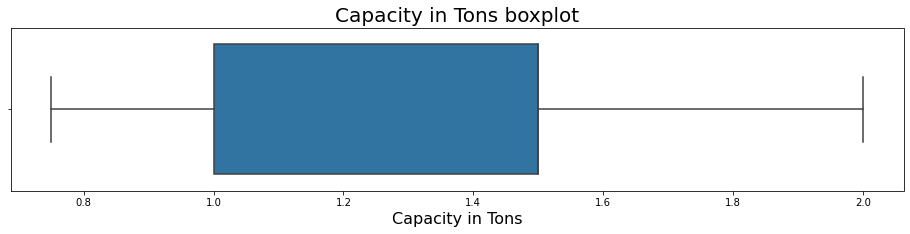

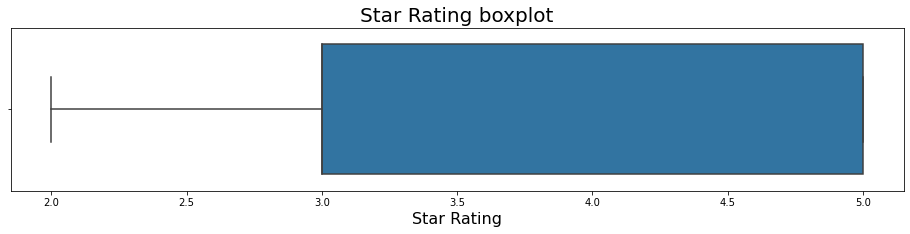

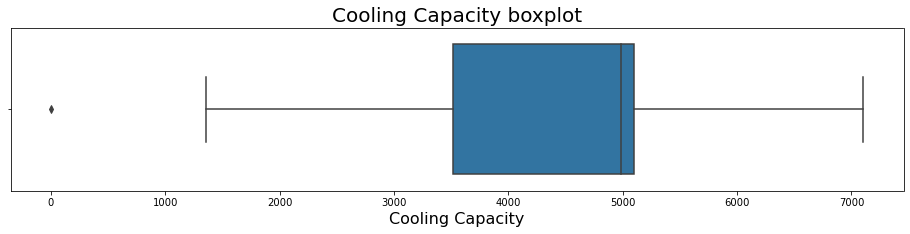

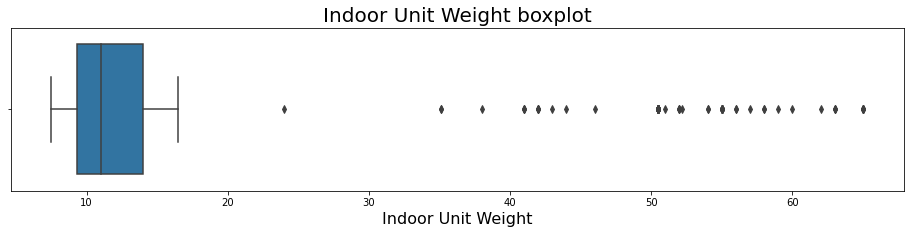

...

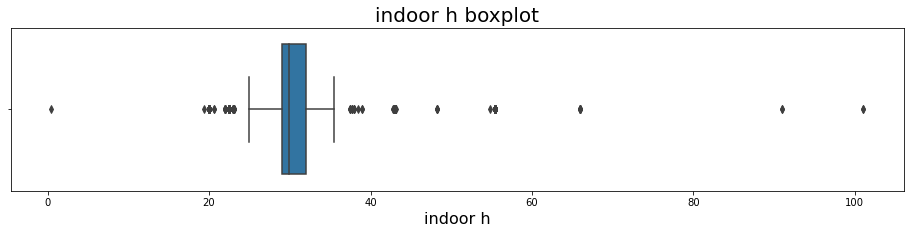

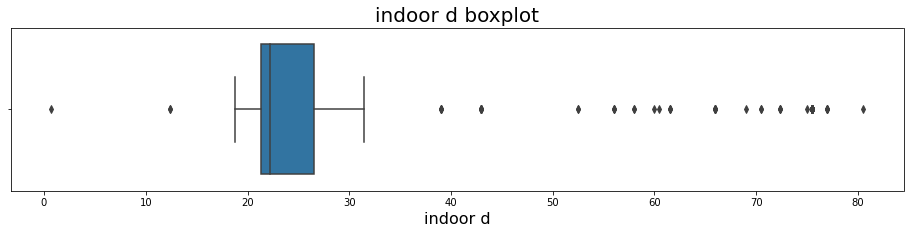

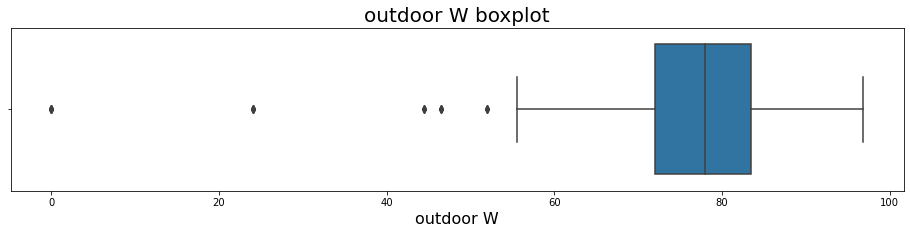

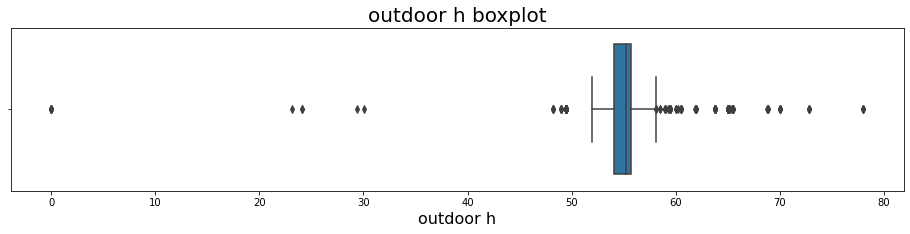

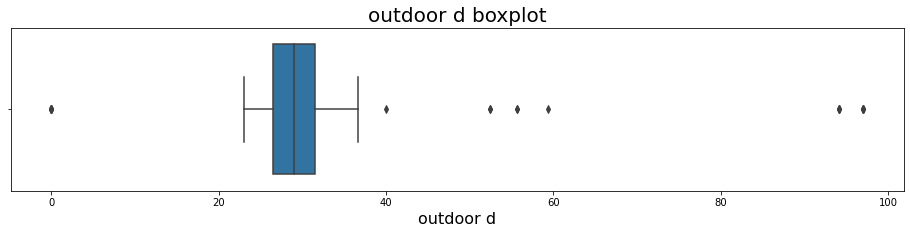

In [8]:
#loop for boxplots
for col_name in num_vars:
    plt.figure(figsize=(16, 3))
    sns.boxplot(x=data[col_name])
    plt.title(col_name + " boxplot", fontsize=20)
    plt.xlabel(col_name, fontsize=16)
    plt.show()

# Observations

1. Indoor Unit Weight, Outdoor unit weight, ISEER, Power Requirement, Price, dimensions columns have outliers.

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 667 entries, 0 to 666
Data columns (total 48 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Brand                         667 non-null    object 
 1   Model Name                    667 non-null    object 
 2   Type                          667 non-null    int64  
 3   Capacity in Tons              667 non-null    float64
 4   Star Rating                   667 non-null    int64  
 5   Series                        667 non-null    object 
 6   Cooling and Heating           667 non-null    object 
 7   Cooling Capacity              667 non-null    float64
 8   Compressor                    667 non-null    object 
 9   Dehumidification              667 non-null    object 
 10  Remote Control                667 non-null    object 
 11  Refrigerant                   667 non-null    object 
 12  Operating Modes               667 non-null    object 
 13  Techn

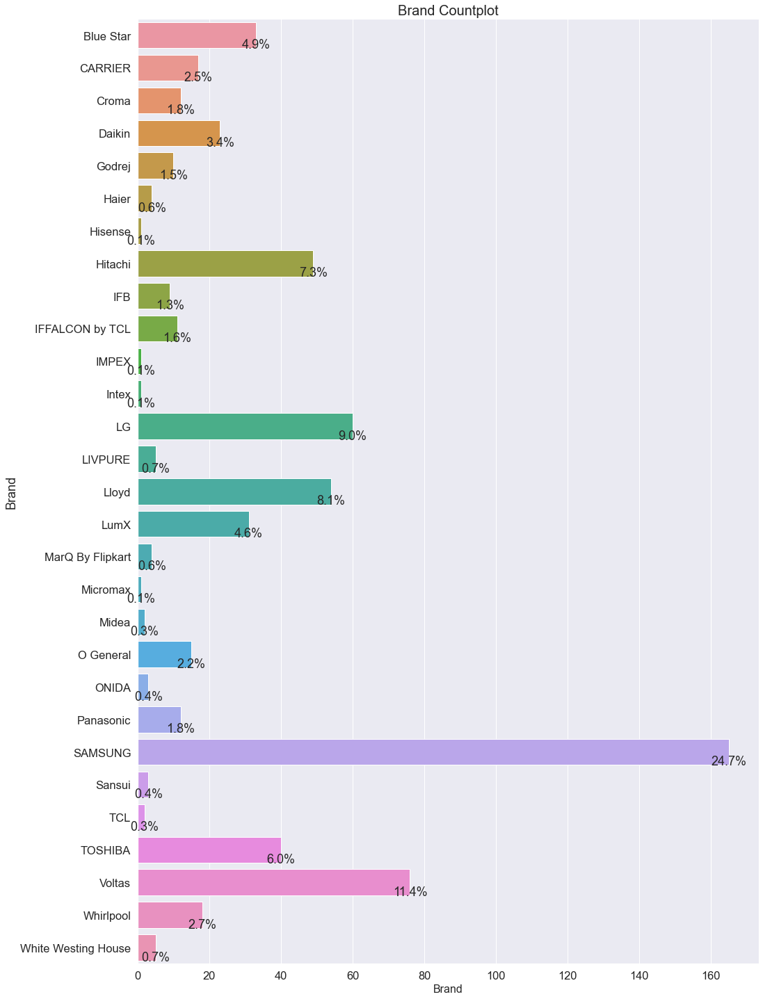

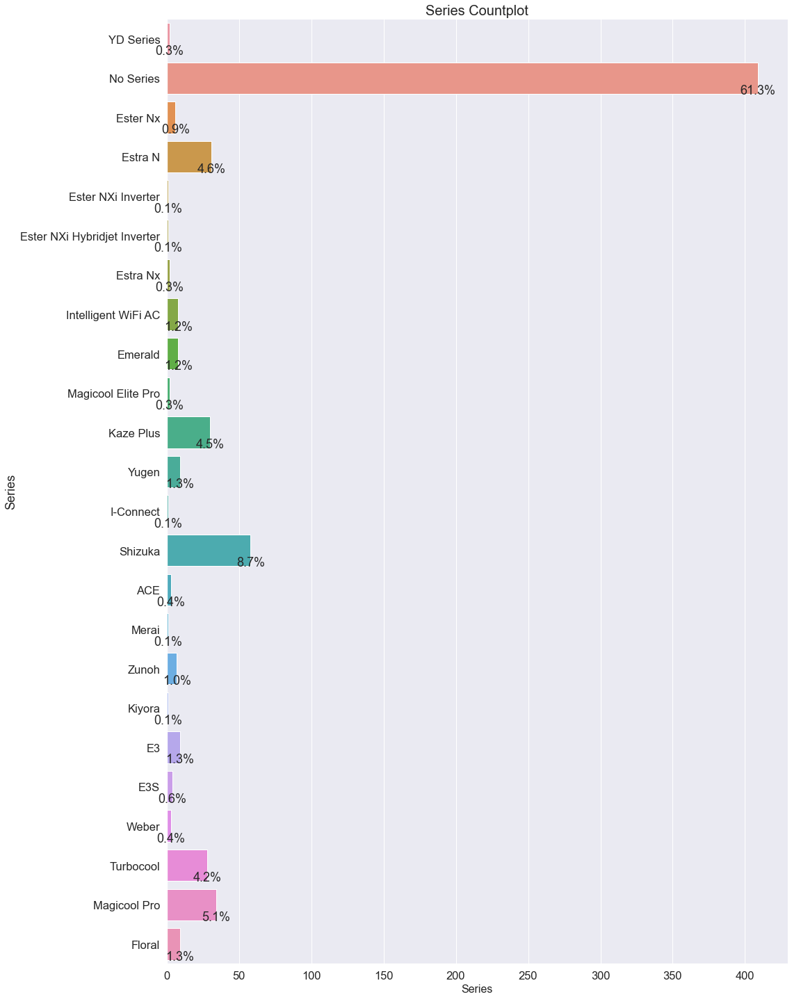

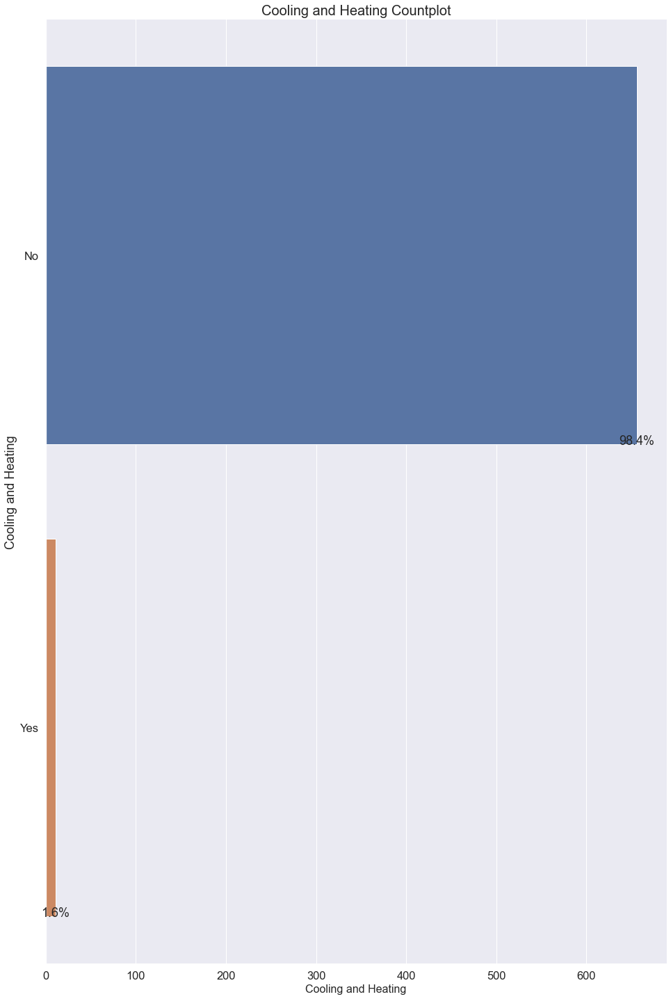

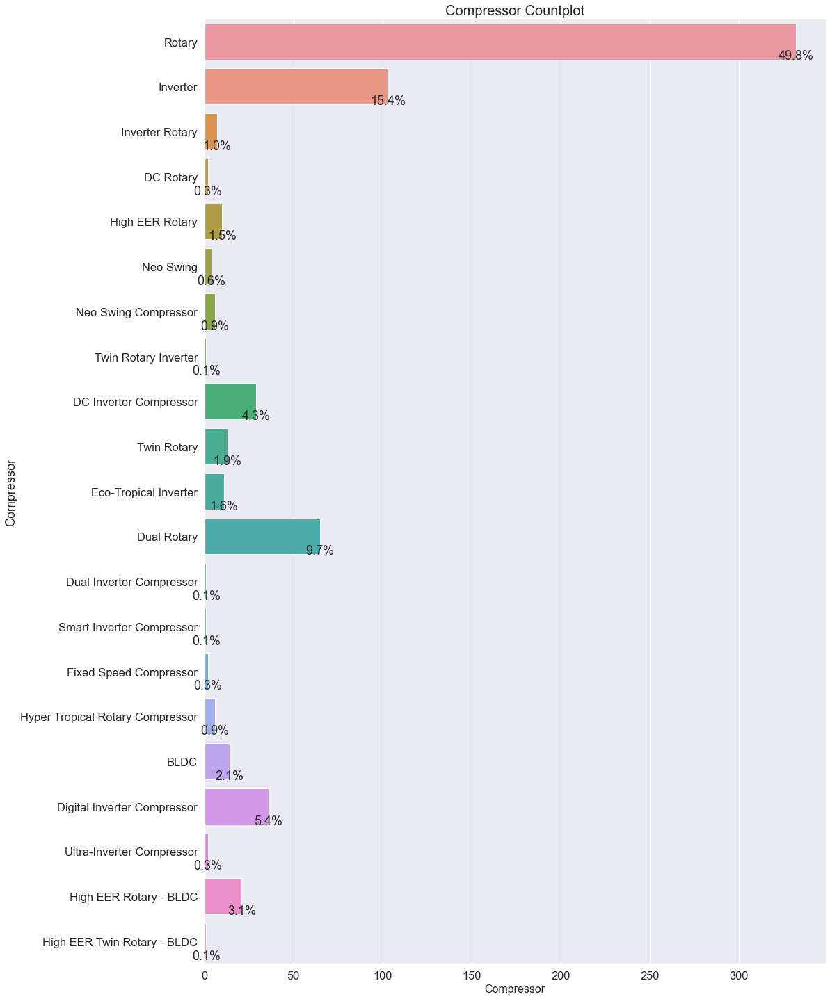

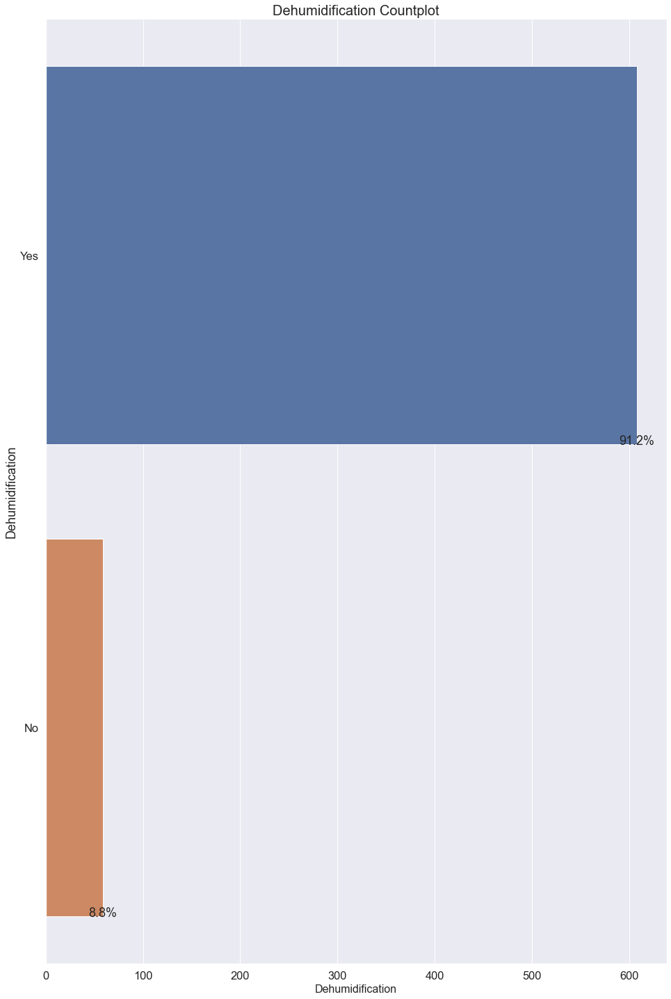

...

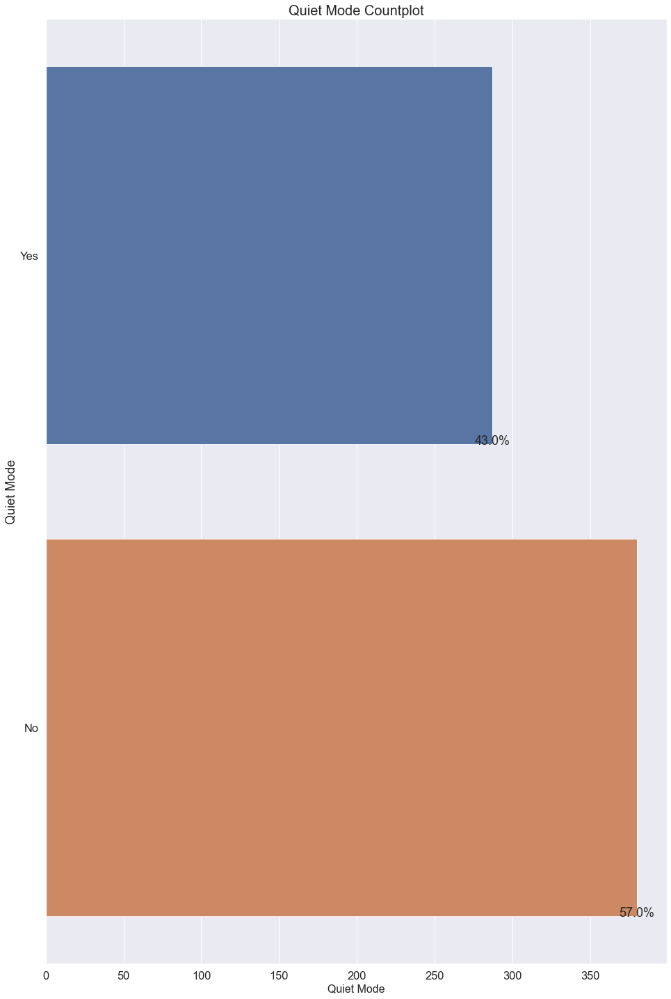

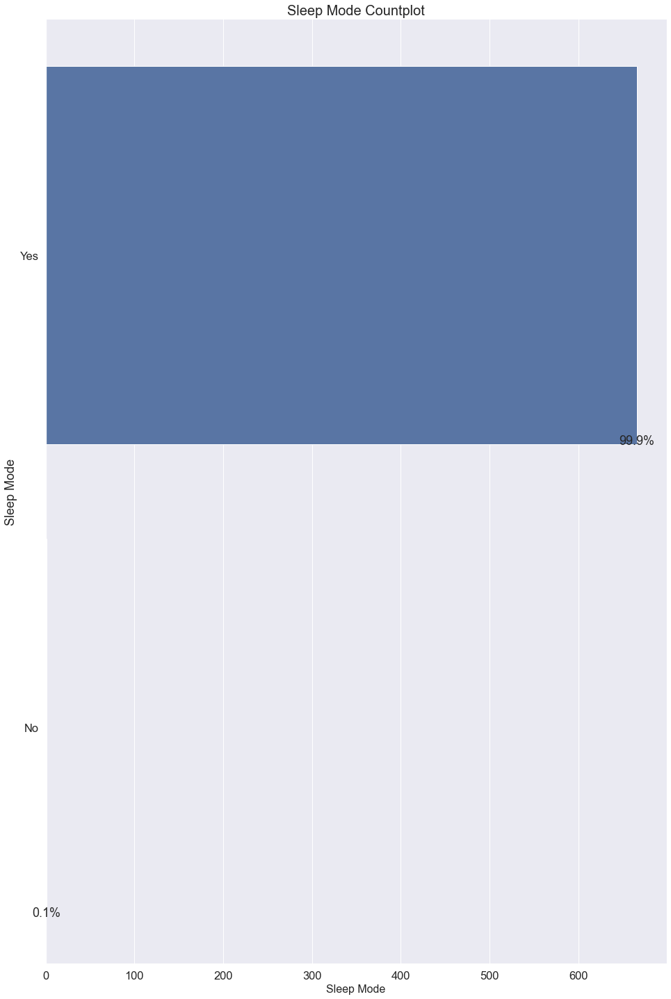

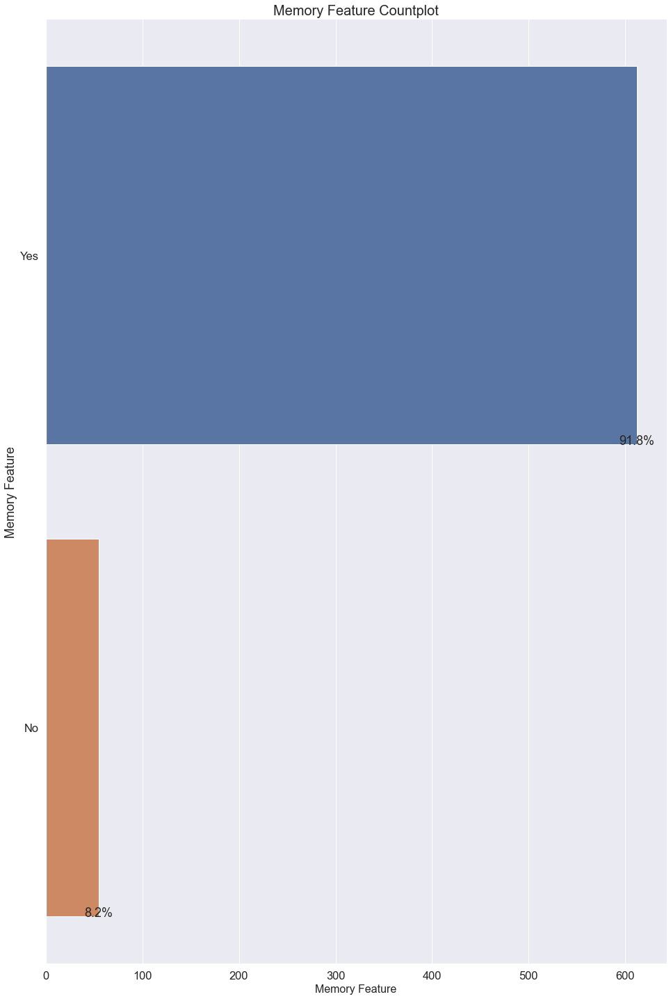

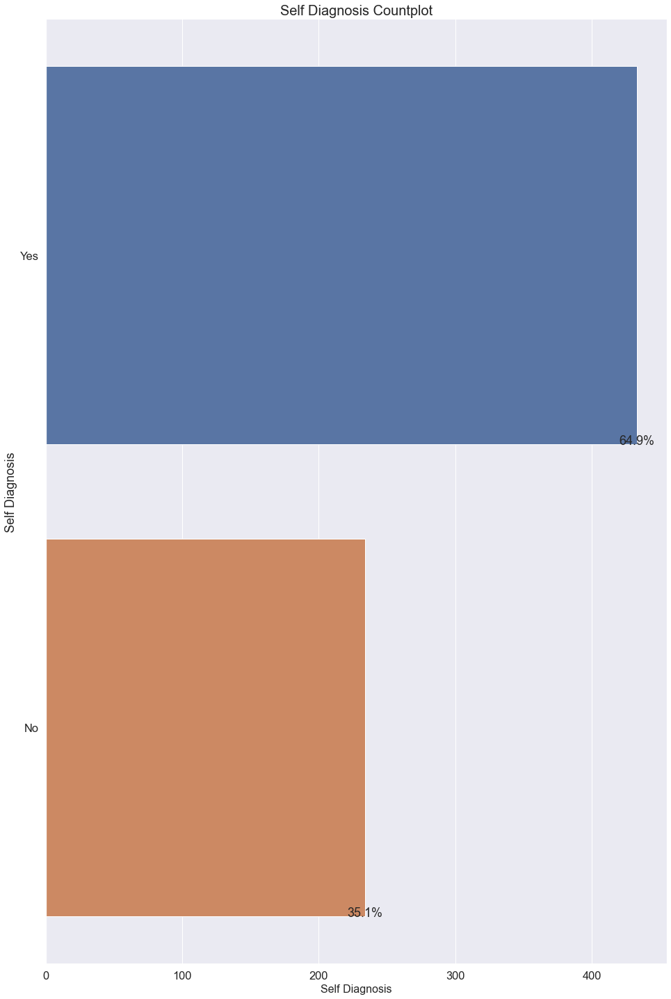

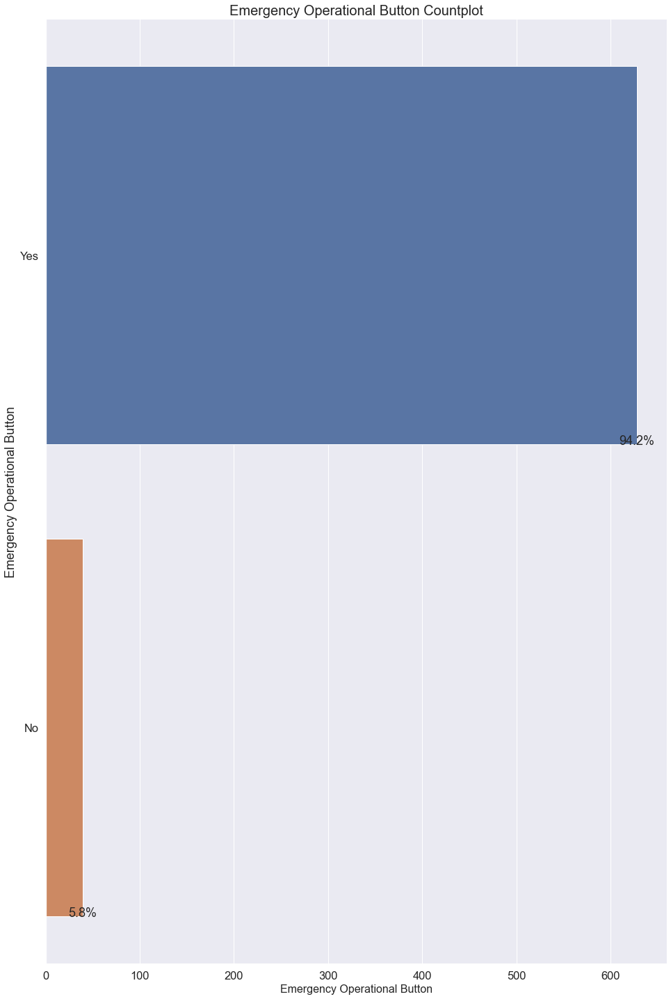

In [10]:
#for font size
sns.set(font_scale=1.5)

#for object columns
data1 = data.drop("Model Name",axis=1)
data1 = data1.drop(num_vars,axis=1)

#for loop for object columns Countplot with percentage
for col_name in data1.columns:
    plt.figure(figsize=(16, 25))
    ax = sns.countplot(y=data[col_name])
    plt.title(col_name + " Countplot", fontsize=20)
    plt.xlabel(col_name, fontsize=16)
    total = float(len(data))
    
    #for percentages
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_width()
        y = p.get_y() +p.get_height()
        ax.annotate(percentage, (x, y),ha='center')
    plt.show()

# Observations

1. The Most AC being sold on flipkart are by Samsung and voltas.

2. Most Of the AC are not a part of any series.

3. Only 1.6% AC have cooling and heating both properties.

4. Rotary and Inverter are highly used Compressors.

5. Majorly AC(91.2%) have Dehumidification.

6. R32 is most widely used refrigerent.

7. Auto, Cool, Dry, Fan, Sleep modes are present in majorly all AC's.

8. Inverter, Precision Cooling, Dual Cool these are the Technology That are mostly used in AC's.

9. Cooper coil is used in almost all AC's(97.8%).

10. LED disiplay is mostly used.

11. 64.2% AC's does not have Indoor temprature indicator.

12. 70.5% AC's have turbo mode.

13. Hydrophiic Aluminium Fin is mostly used as evaporater Fin type.

14. Ocean Black Fin is mostly used as condensor Fin type.

15. 67.8% AC's does not have Stepped Louvers.

16. 94.5% AC's does not have Auto Air Swing Feature.

17. 60.9% AC's have 2Way Air Flow Direction.

18. Few More AC's have Anti-Bacteria Filter(56.8%).

19. Almost every AC has Dust Filter(97.5%).

20.  67.3% AC's does not have Deodrizing Filter.

21. Almost every AC has Auto Restart(97.8%).

22. Almost every AC has Timer(99.1%).

23. 70.9% AC's does not have Child Lock.

24. 57.0% AC's does not have Quite Mode.

25. Only one AC does not have sleep mode.

26. Almost every AC has Memory Feature(91.8%).

27. 64.9% AC's have Self Diagnosis.

28. Almost every AC has Emergency Operational Button (94.2%).

# Bivarient Analysis

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 667 entries, 0 to 666
Data columns (total 48 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Brand                         667 non-null    object 
 1   Model Name                    667 non-null    object 
 2   Type                          667 non-null    int64  
 3   Capacity in Tons              667 non-null    float64
 4   Star Rating                   667 non-null    int64  
 5   Series                        667 non-null    object 
 6   Cooling and Heating           667 non-null    object 
 7   Cooling Capacity              667 non-null    float64
 8   Compressor                    667 non-null    object 
 9   Dehumidification              667 non-null    object 
 10  Remote Control                667 non-null    object 
 11  Refrigerant                   667 non-null    object 
 12  Operating Modes               667 non-null    object 
 13  Techn

### Brand W.R.T. Price

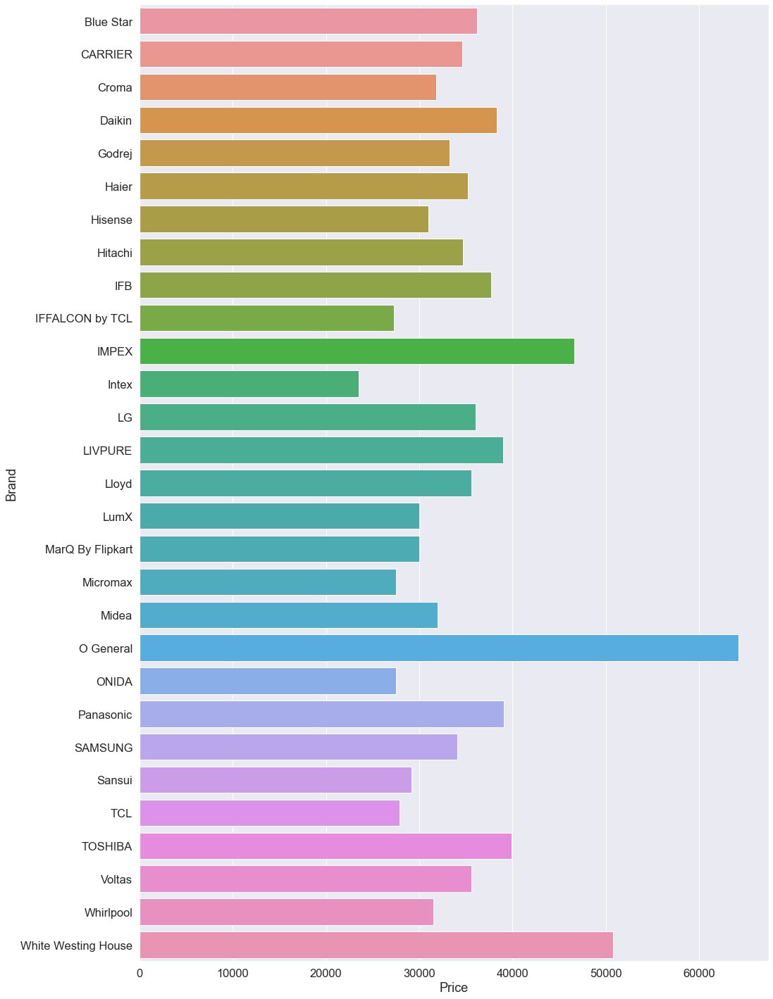

In [12]:
plt.figure(figsize=(16, 25))
sns.barplot(y='Brand', x='Price',data=data,ci = None)

#### OGeneral AC's have the highest Price.

### Brand W.RT. Price on Rating

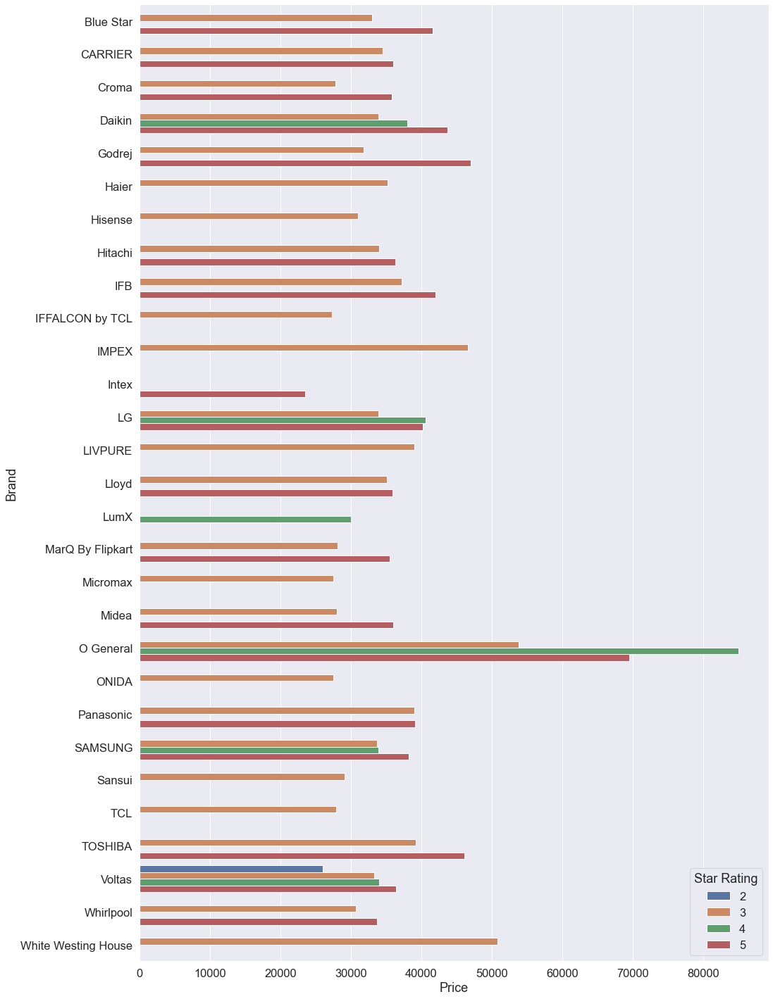

In [13]:
plt.figure(figsize=(16, 25))
sns.barplot(y='Brand', x='Price',hue="Star Rating" ,data=data,ci = None)

2 Star Rating AC's are only present in Voltas.
OGeneral have the highest price in all the three Rating 3,4,5.
All company sells 3 star Rating AC's mostly.

### Brand W.R.T. Rating

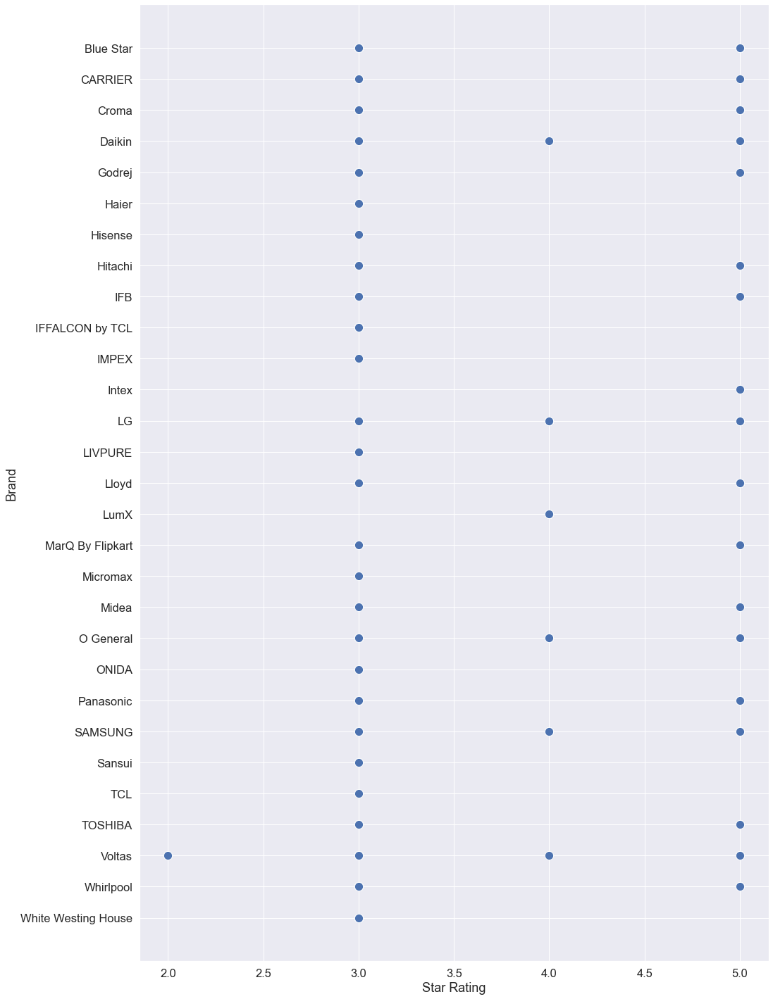

In [14]:
plt.figure(figsize=(16, 25))
sns.scatterplot(y='Brand', x="Star Rating" ,data=data,s=150)

Voltas have all type of AC's.

Samsung, OGeneral, LG, Daikin have 3,4,5 star AC's.

Lumx only has 4 Star AC.


### Brand W.RT. Price On Type

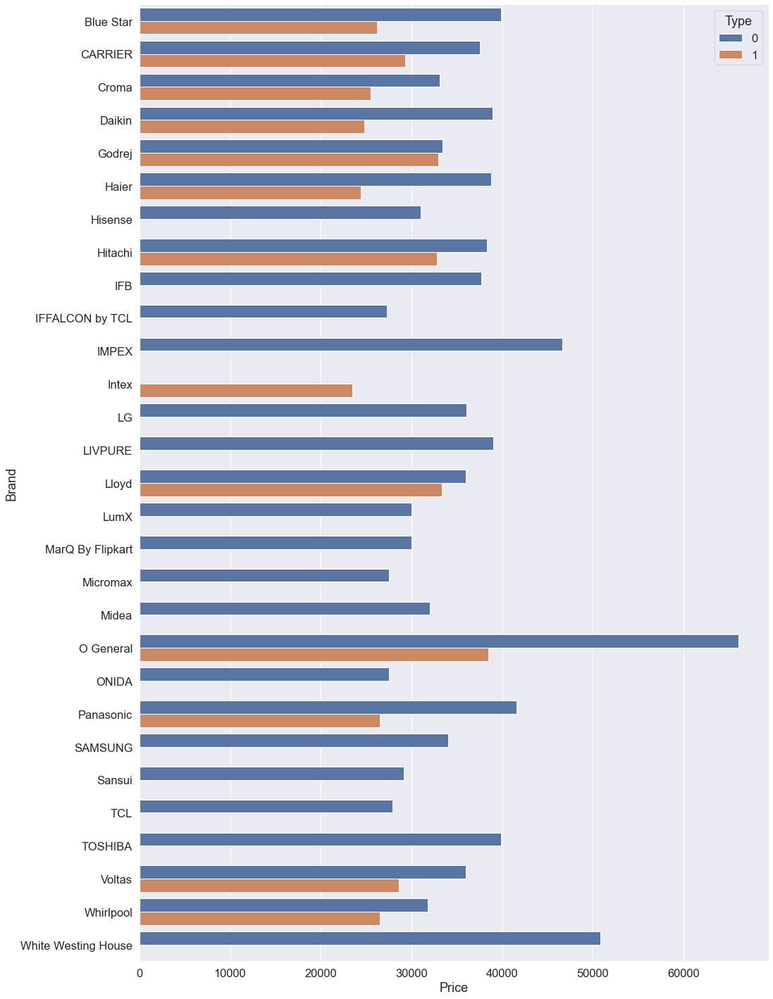

In [15]:
plt.figure(figsize=(16, 25))
sns.barplot(y='Brand', x='Price',hue="Type" ,data=data,ci = None)

Hisense, IFB, TCL, IMPEX, LIVPURE, Lumx, MarQ, Micromax, Midea, ONIDA, Samsung, Toshiba, White Westing only sells split AC's with White Westing House with most price.

Price of OGeneral's Window AC is most costly.

## Brand W.R.T. Star Rating On Type

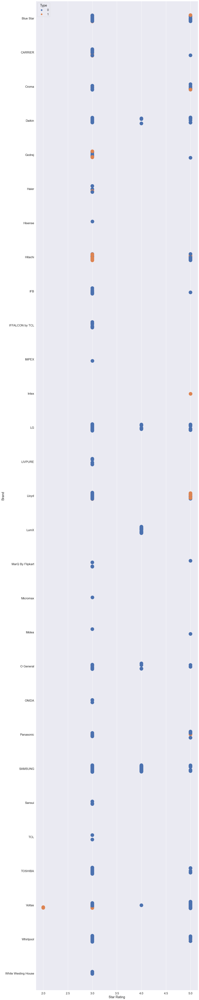

In [16]:
plt.figure(figsize=(16, 100))
sns.stripplot(y='Brand', x='Star Rating',hue= "Type" ,data=data, s = 20)
plt.show()

Blue Star, Croma, Hitachi, Lloyd Have AC's Of both Types in 3 star and 5 Star rating.

Only Voltas has window AC with 2 star rating.

Intex has 5 star rating Window AC only.

In 4 Star Rating Only Split AC are present.


## Percentage Of Split W.R.T. Window AC

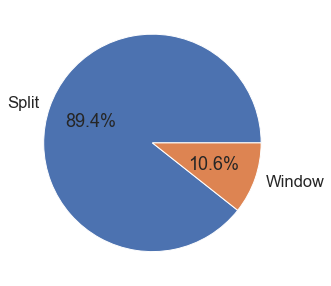

In [17]:
label=['Split','Window']
plt.figure(figsize=(5, 5))
plt.pie(data.Type.value_counts(),labels=label,autopct='%1.1f%%')
plt.show()

## Percentage Of Star Rating In AC Present

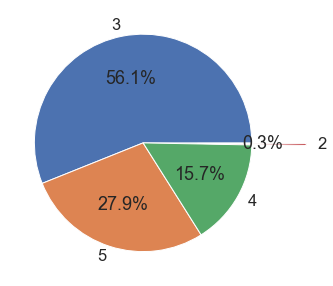

In [18]:
plt.figure(figsize=(5, 5))
e  =(0, 0, 0, 0.5)
plt.pie(data["Star Rating"].value_counts(),labels=data["Star Rating"].unique(),explode = e,autopct='%1.1f%%')
plt.show()

2 Star Rating AC are Less and 3 star AC are the most.

## Percentage Of Capacity In AC Present

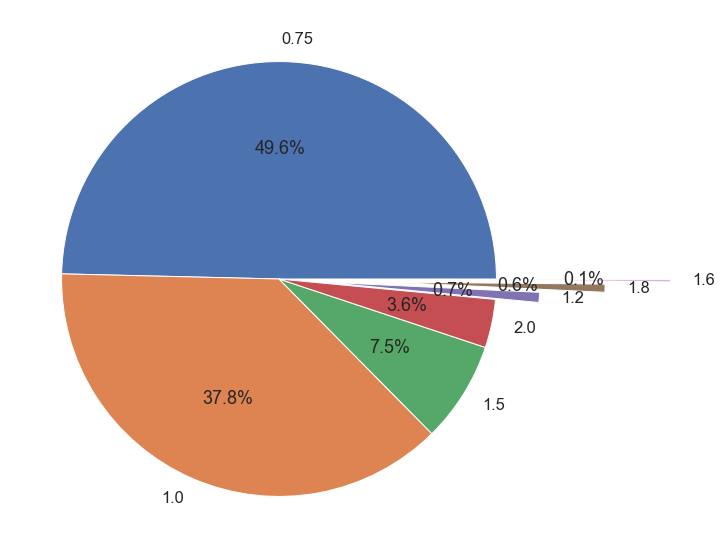

In [19]:
plt.figure(figsize=(10, 10))
e  =(0, 0,0, 0, 0.2,0.5,0.8)
plt.pie(data["Capacity in Tons"].value_counts(),labels=data["Capacity in Tons"].unique(),explode = e,autopct='%1.1f%%')
plt.show()

AC with Capacity 1 and 1.5 are more in number than other AC's, 2 tone AC are compartively less than other AC's.

There are some AC's with capacity 1.2,1.8 and 1.6.

## Brand W.R.T. Price On Capacity

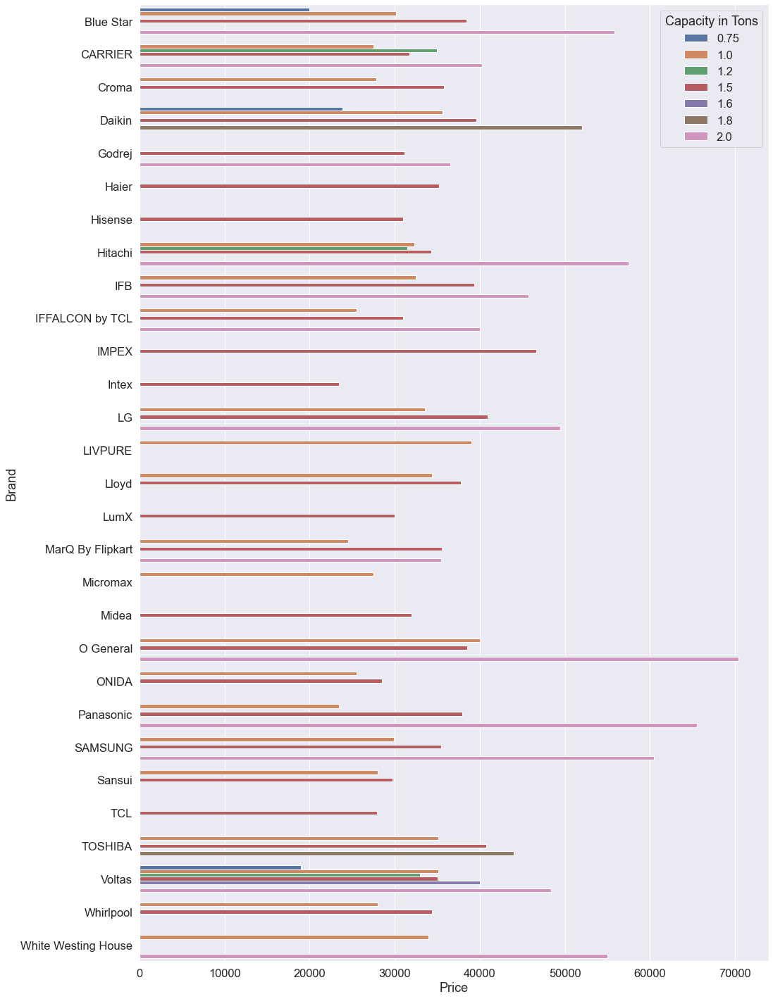

In [20]:
plt.figure(figsize=(16, 25))
sns.barplot(y='Brand', x='Price',hue="Capacity in Tons" ,data=data,ci = None)

The Price Of 2 and 1.8 AC are higher than other AC's specially in OGeneral, White Westing, Samsung, Panasonic, Hitachi, Daikin and Blue Star.

The Price Variation in other AC's are not very large but a significant increase is there if the capacity of AC is more.

Lowest Price is Of voltas 0.75 Capacity AC, Blue Star and Daikin also have 0.75 Capacity AC's.

## Brand W.R.T. Star Rating On Capacity.

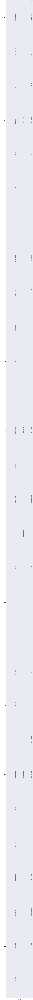

In [21]:
sns.set_palette(sns.color_palette("deep"))
plt.figure(figsize=(16, 600))
sns.stripplot(y='Brand', x='Star Rating',hue="Capacity in Tons" ,data=data, s = 20)
plt.xticks(rotation=90)
plt.show()

IN 3 STAR RATING BRAND WHICH CONTAINS ALL CAPACITY AC ARE-:

1. Blue Star

2. Carrier

3. Daikin

4. TCL

5. LG

6. OGENERAL

7. Panasonic

IN 5 STAR RATING BRAND WHICH CONTAINS ALL CAPACITY AC ARE-:

1. Blue Star

2. Daikin

3. Voltas

Whirlpool has 1C and 1.5C AC's on both 3 and 5 Star

Voltas, Lumx, LG, Daikin, Samsung have AC's in 4 Star Rating with 1,1.5 and samsung have all capacity AC's.

## Brand W.R.T. Star Rating On Sleep Mode

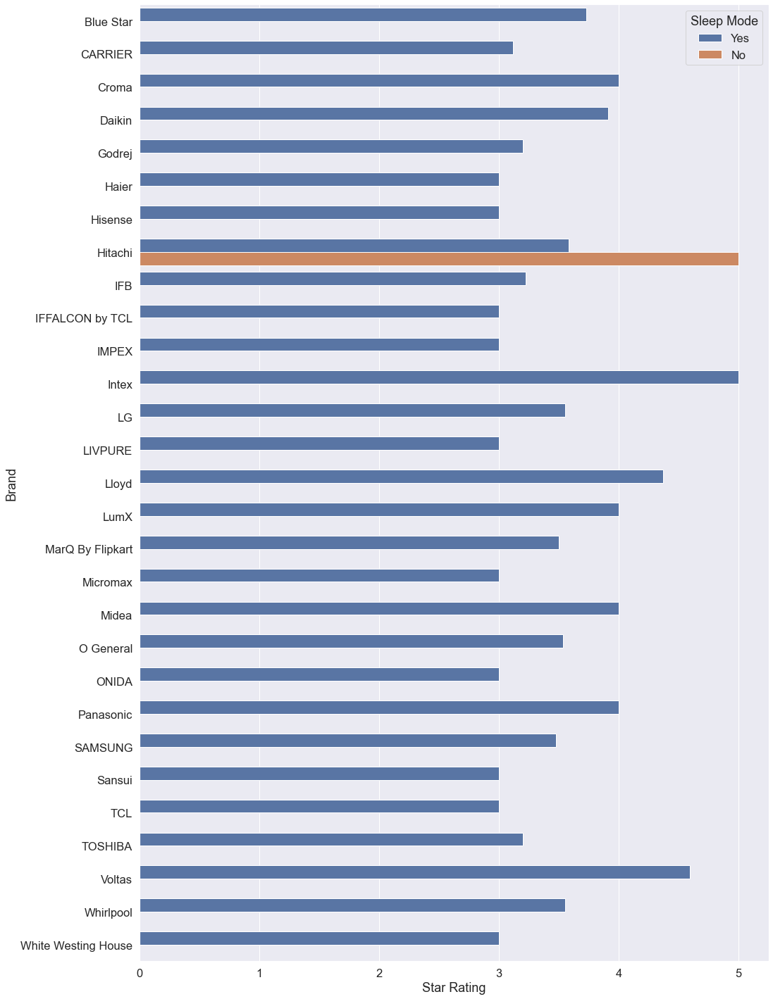

In [22]:
plt.figure(figsize=(16, 25))
sns.barplot(y='Brand', x='Star Rating',hue="Sleep Mode" ,data=data,ci = None)
plt.show()

Only Hitachi AC does not have sleep mode in most AC's.

## Percentage Of Cooling and Heating In AC

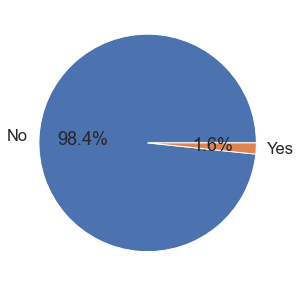

In [23]:
plt.figure(figsize=(5, 5))
plt.pie(data["Cooling and Heating"].value_counts(),labels=data["Cooling and Heating"].unique(),autopct='%1.1f%%')
plt.show()

## Brand W.R.T. Price On Cooling And Heating

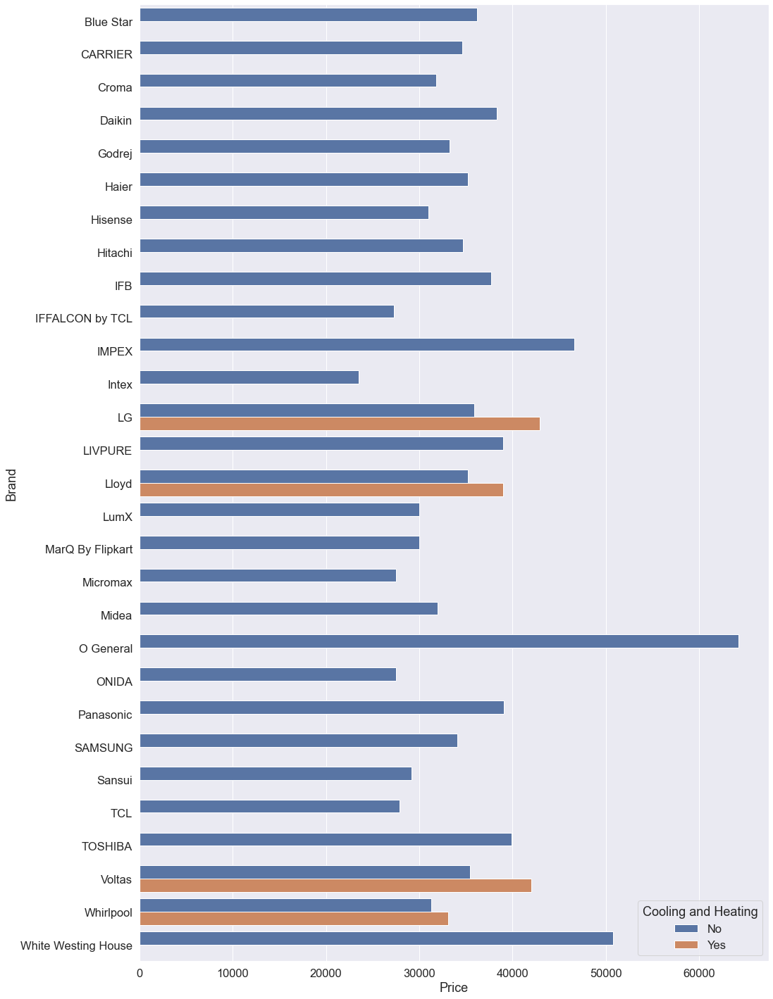

In [24]:
plt.figure(figsize=(16, 25))
sns.barplot(y='Brand', x='Price',hue="Cooling and Heating" ,data=data,ci = None)

In Brands Like LG, Lloyd, Voltas, Whirpool the feature is present then price is high.

In [25]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 667 entries, 0 to 666
Data columns (total 48 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Brand                         667 non-null    object 
 1   Model Name                    667 non-null    object 
 2   Type                          667 non-null    int64  
 3   Capacity in Tons              667 non-null    float64
 4   Star Rating                   667 non-null    int64  
 5   Series                        667 non-null    object 
 6   Cooling and Heating           667 non-null    object 
 7   Cooling Capacity              667 non-null    float64
 8   Compressor                    667 non-null    object 
 9   Dehumidification              667 non-null    object 
 10  Remote Control                667 non-null    object 
 11  Refrigerant                   667 non-null    object 
 12  Operating Modes               667 non-null    object 
 13  Techn

## Cooling Capacity W.R.T. Price

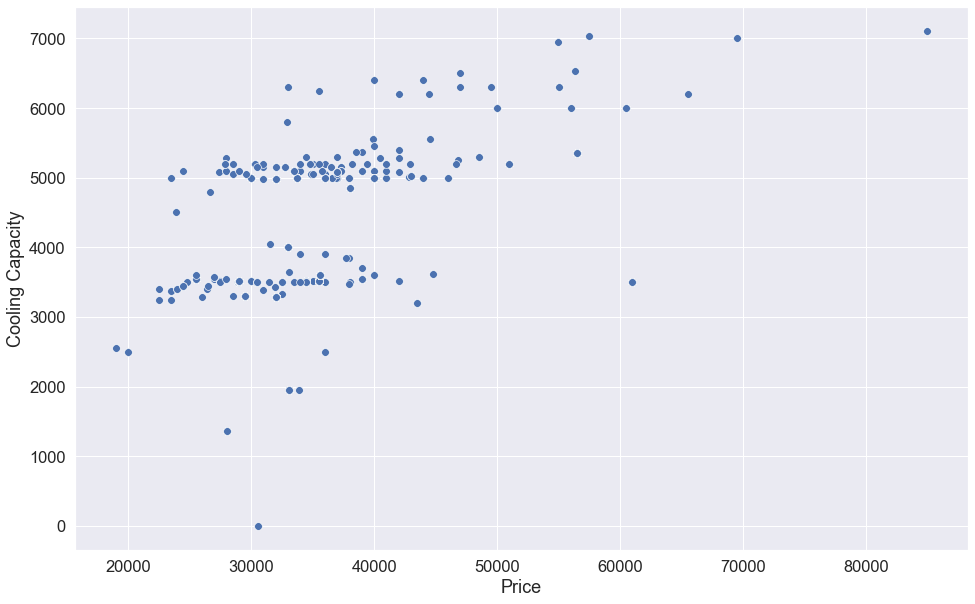

In [26]:
plt.figure(figsize=(16, 10))
sns.scatterplot(y='Cooling Capacity', x='Price',data=data,s=60)

There are major two clusters present at 3200 to 4000 and 5000 to 5800 with price 32000 and 45000.

Some Outliers are also present, and as colling capacity increases some increase in price is present.

## Cooling Capacity W.R.T to Star Rating

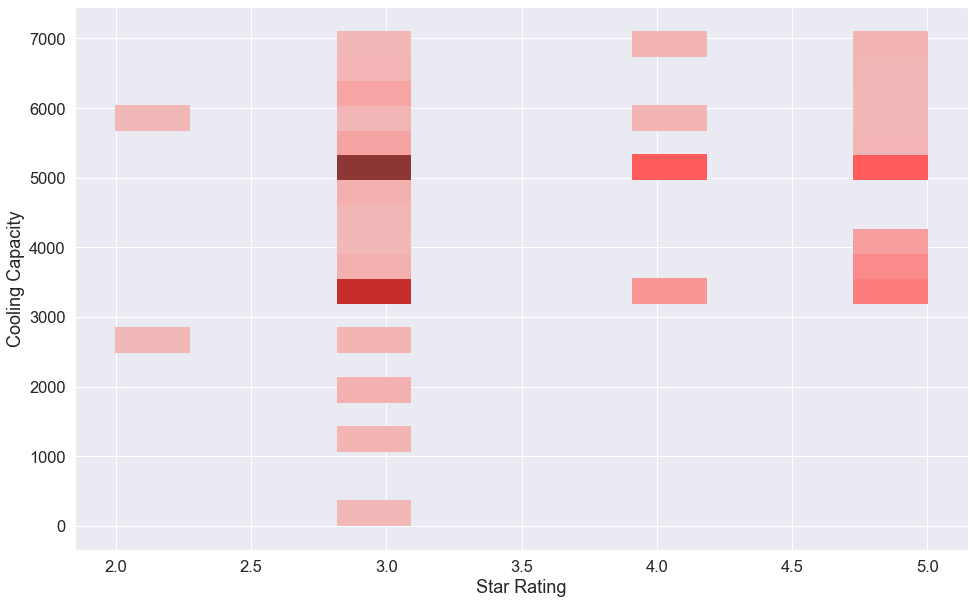

In [27]:
plt.figure(figsize=(16, 10))
sns.histplot(y='Cooling Capacity', x='Star Rating',data=data,color="red")

## Compressor W.R.T. Price On Star Rating

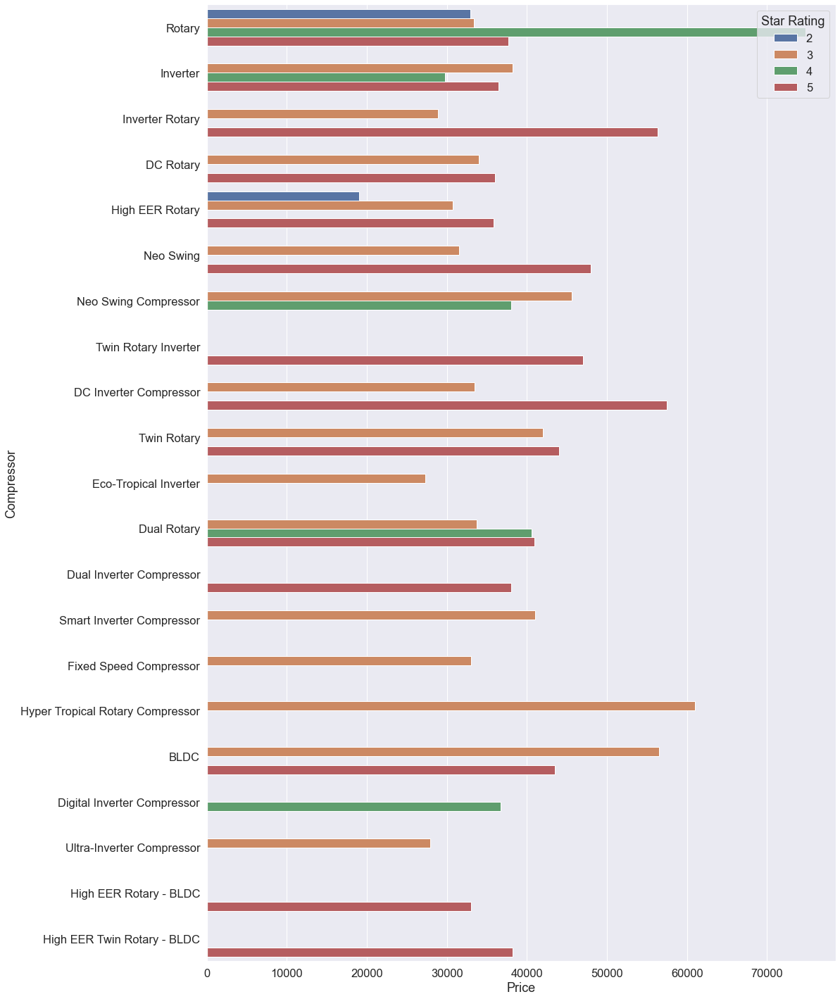

In [28]:
plt.figure(figsize=(16, 25))
sns.barplot(y='Compressor', x='Price',hue="Star Rating" ,data=data,ci = None)

In Star Rating 2 Rotary Compressor Has highest price.

In Star Rating 3 Hyper Tropical Rotary Compressor have highest price and eco tropical inverter and ultra inverter compressor have lowest prices.

In Star Rating 4 Rotary Compressor has highest price and inverter has lowest price.

In Star Rating 5 DC inverter Compressor has highest price and High EER Rotary-BLDC Has lowest price.

## Refrigerant W.R.T. Price On Star Rating

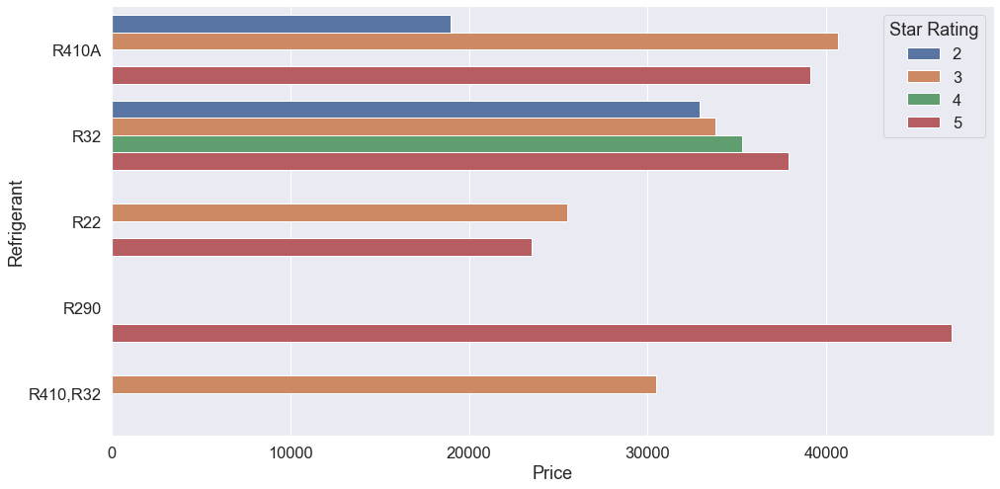

In [29]:
plt.figure(figsize=(16, 8))
sns.barplot(y='Refrigerant', x='Price',hue="Star Rating" ,data=data,ci = None)

R32 is used in every Star Rating AC.

In Star Rating 2 R32 has highest price.

In Star Rating 3 R410A has highest price.

Only R32 is used in star rating 4 AC's.

In Star Rating 5 R290 has highest price.

## Brand W.R.T. Price On Refrigerant

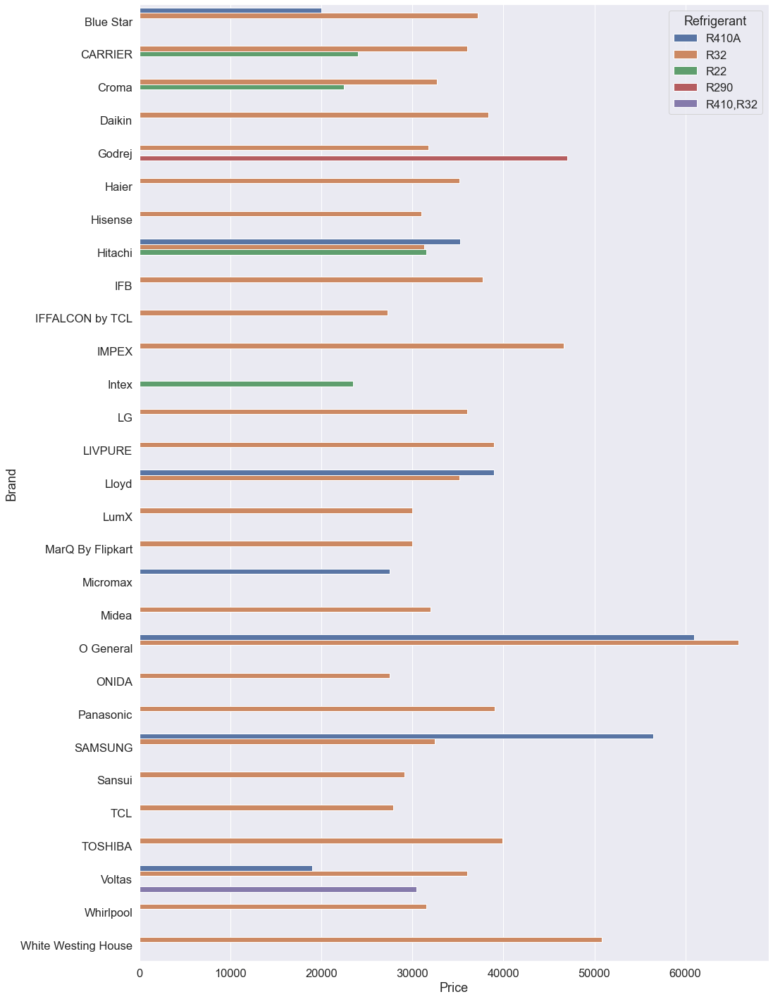

In [30]:
plt.figure(figsize=(16, 25))
sns.barplot(y='Brand', x='Price',hue="Refrigerant" ,data=data,ci = None)

R32 has used in every brand.

R410A is used in Blue Star, Hitachi, Lloyd, Micromax, OGeneral, Samsung,Voltas.

R22 is used in Carrier, Croma, Hitachi, Intex.

R290 is used in Godrej only.

Both R32 and R410 are used in Voltas.

## Brand W.R.T. Price On Compressor

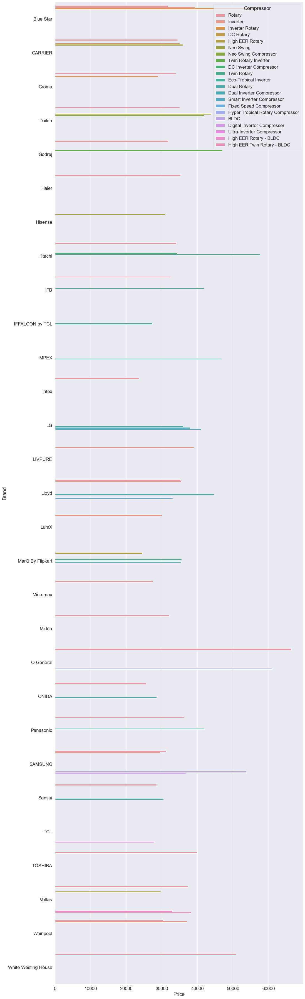

In [31]:
plt.figure(figsize=(16, 65))
sns.barplot(y='Brand', x='Price',hue="Compressor" ,data=data,ci = None)

## Brand W.R.T. Price on Operating Modes

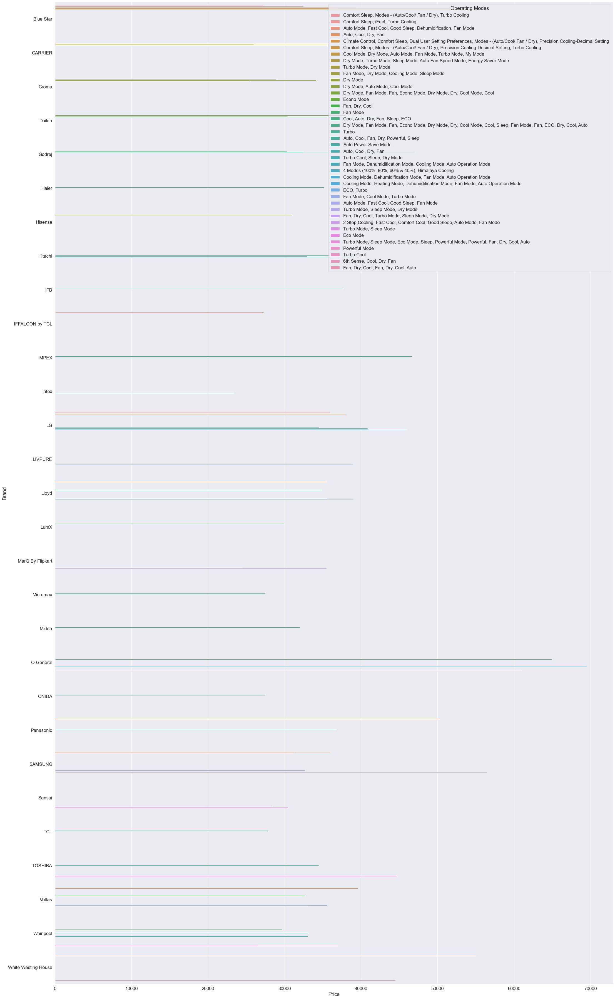

In [32]:
plt.figure(figsize=(36, 65))
sns.barplot(y='Brand', x='Price',hue="Operating Modes" ,data=data,ci = None)

## Brand W.R.T. Price On Technology Used

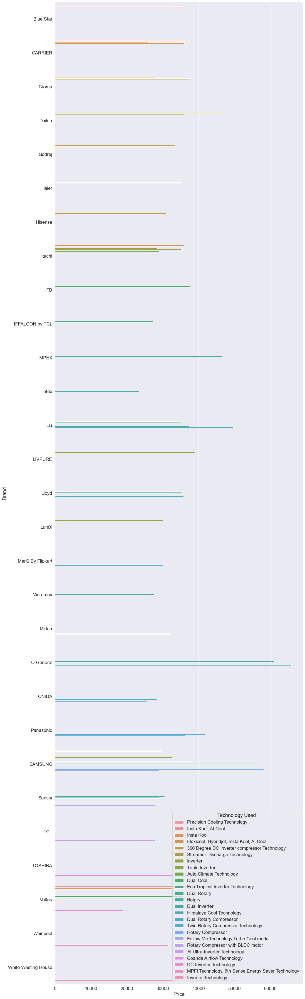

In [33]:
plt.figure(figsize=(16, 65))
sns.barplot(y='Brand', x='Price',hue="Technology Used" ,data=data,ci = None)

## Price W.R.T. Technology Used

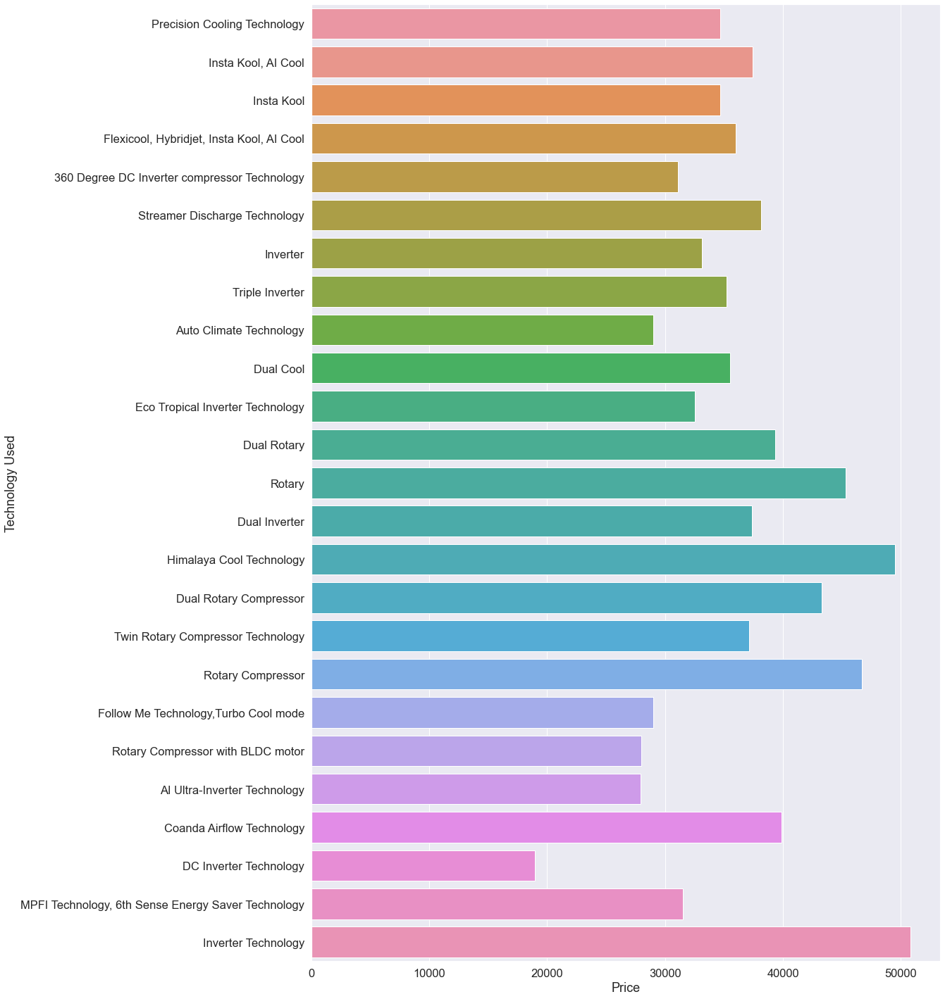

In [34]:
plt.figure(figsize=(16, 25))
sns.barplot(x='Price',y="Technology Used" ,data=data,ci = None)

Price Of Inverter Technology and Himalaya Cool Technology have highest prices. Technology effects on price.

## Price W.R.T. Operating Modes

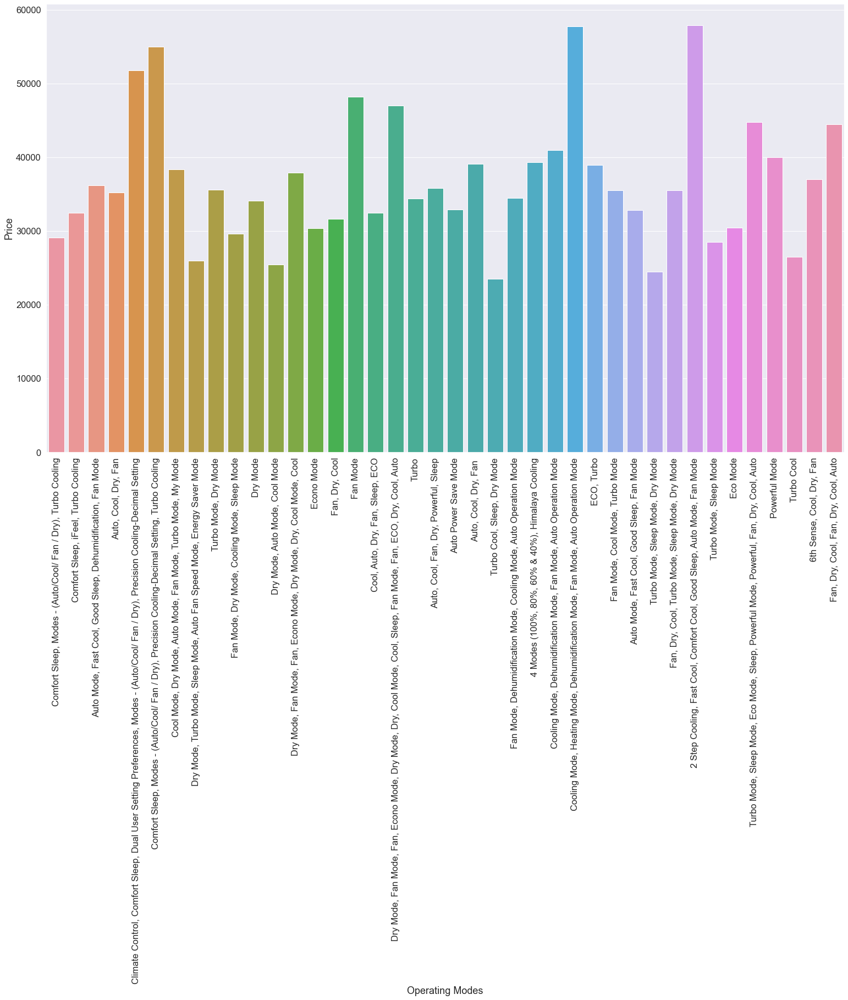

In [35]:
plt.figure(figsize=(26, 15))
sns.barplot(y='Price',x="Operating Modes" ,data=data,ci = None)
plt.xticks(rotation=90)
plt.show()

More the number of modes, the price of the AC increases and if it has extra modes than also price increases.

## Price W.R.T. Operating Modes On Star Rating

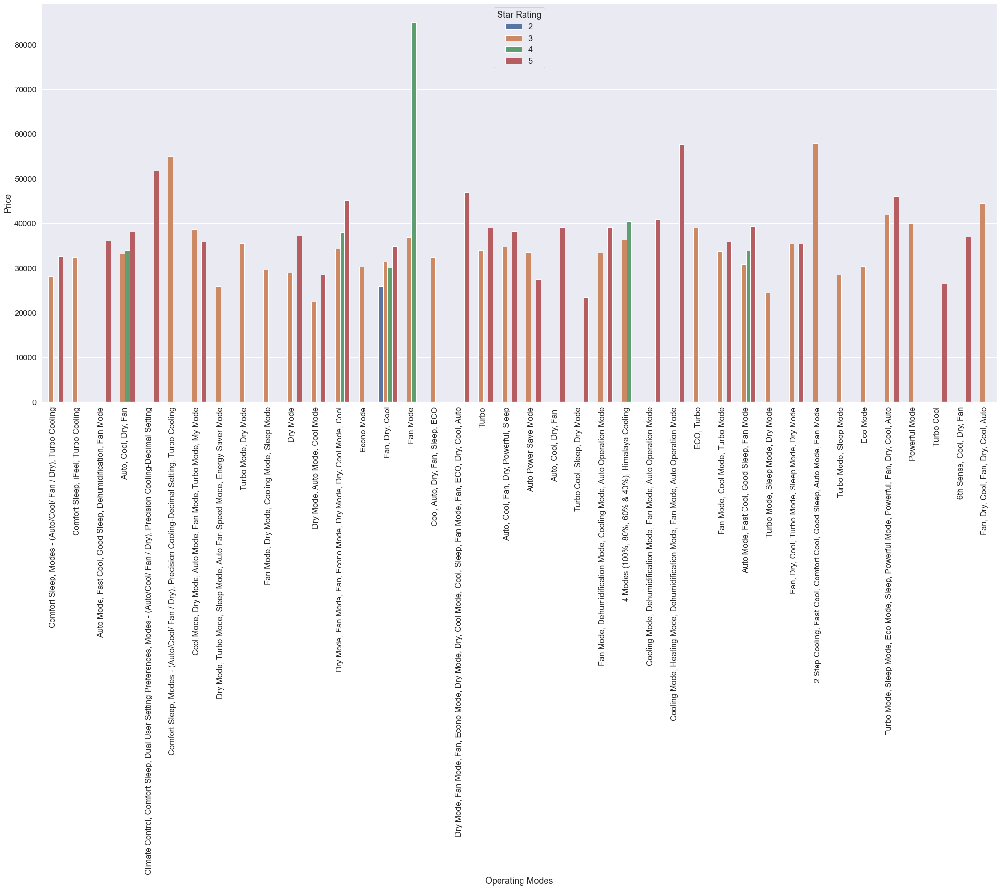

In [36]:
plt.figure(figsize=(35, 15))
sns.barplot(y='Price',x="Operating Modes" ,hue="Star Rating",data=data,ci = None)
plt.xticks(rotation=90)
plt.show()

## Price W.R.T. Technology Used On Star Rating 

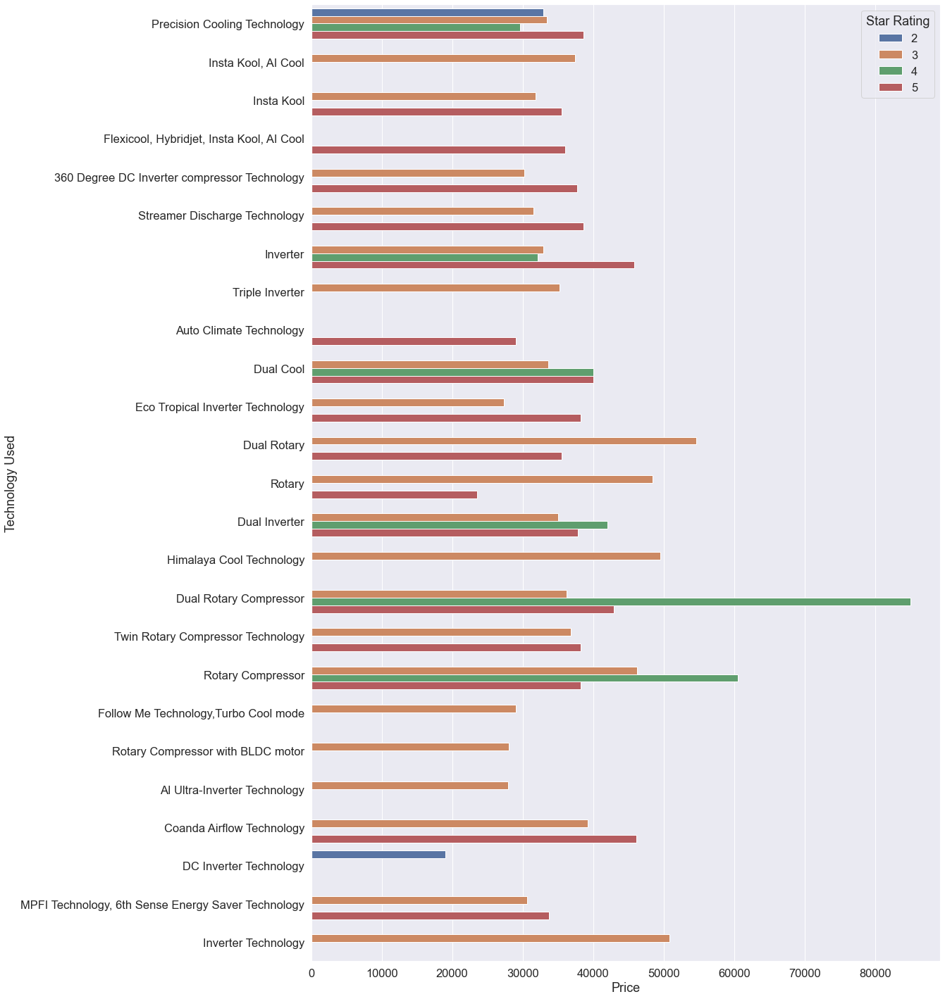

In [37]:
plt.figure(figsize=(16, 25))
sns.barplot(x='Price',y="Technology Used" ,hue="Star Rating",data=data,ci = None)

In Star Rating 2 Precision Cooling Technology has high price.

In Star Rating 3 Dual Rotary has high price.

In Star Rating 4 Dual Rotary has high price.

In Star Rating 5 Coanda Airflow Technology has high price.

In [38]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 667 entries, 0 to 666
Data columns (total 48 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Brand                         667 non-null    object 
 1   Model Name                    667 non-null    object 
 2   Type                          667 non-null    int64  
 3   Capacity in Tons              667 non-null    float64
 4   Star Rating                   667 non-null    int64  
 5   Series                        667 non-null    object 
 6   Cooling and Heating           667 non-null    object 
 7   Cooling Capacity              667 non-null    float64
 8   Compressor                    667 non-null    object 
 9   Dehumidification              667 non-null    object 
 10  Remote Control                667 non-null    object 
 11  Refrigerant                   667 non-null    object 
 12  Operating Modes               667 non-null    object 
 13  Techn

## Price W.R.T. Panel Display 

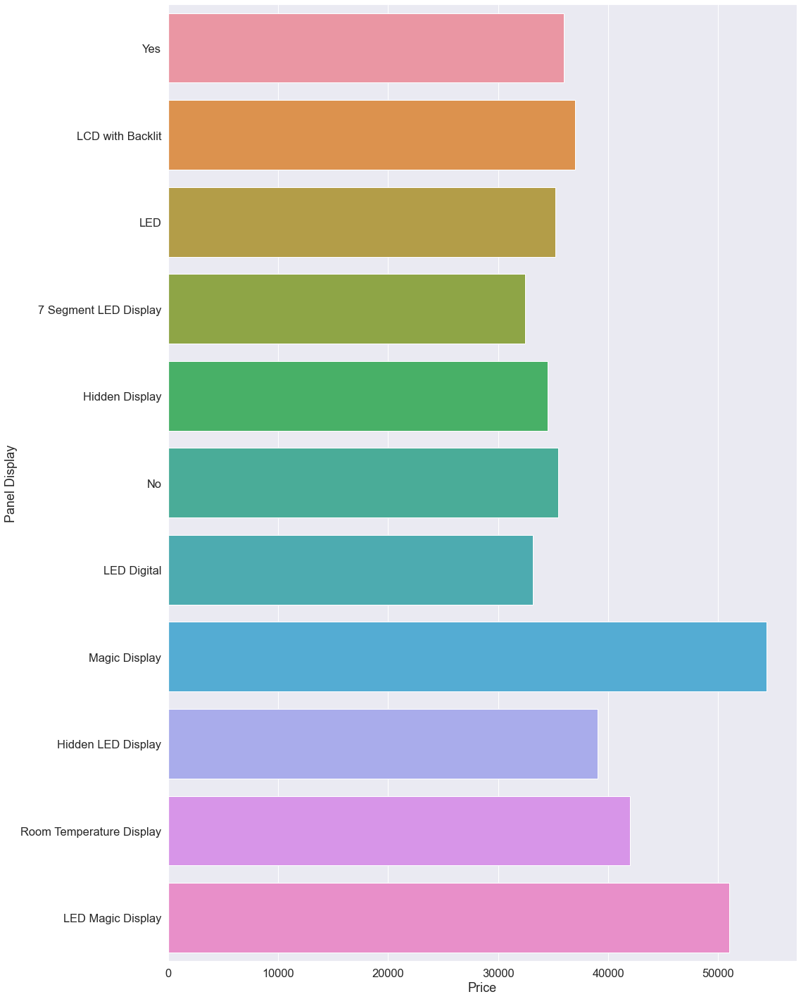

In [39]:
plt.figure(figsize=(16, 25))
sns.barplot(x='Price',y="Panel Display" ,data=data,ci = None)

Magic Display has a highest price in panel display.

## Price W.R.T. Panel Display on Star Rating and Brand

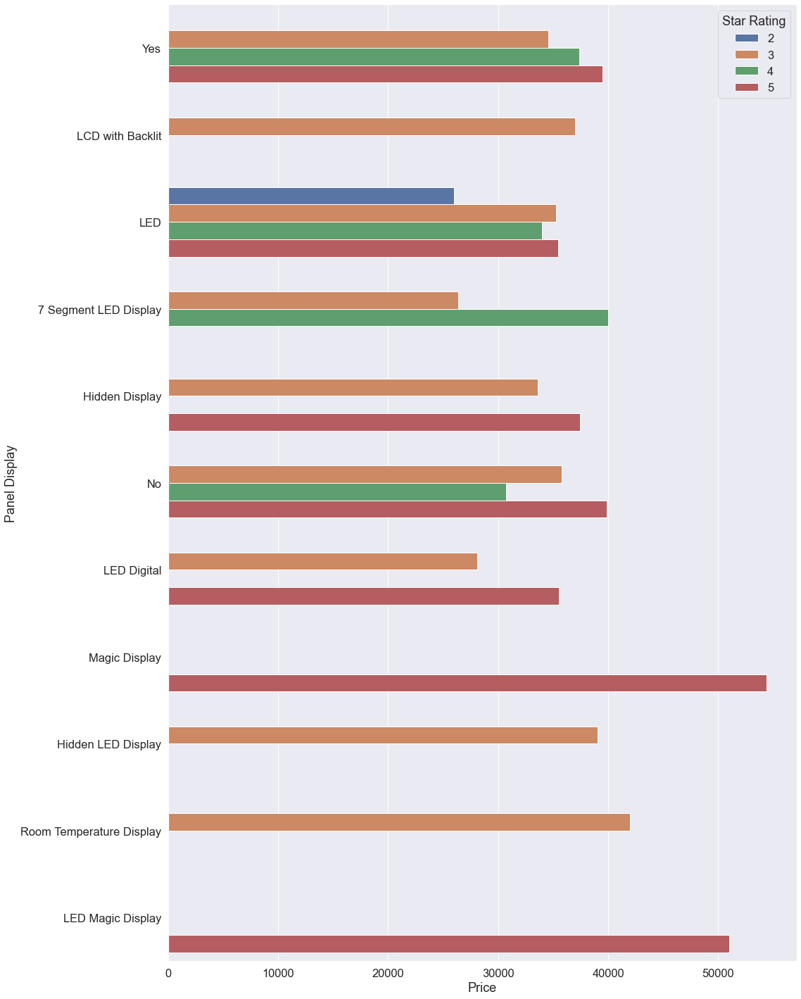

In [40]:
plt.figure(figsize=(16, 25))
sns.barplot(x='Price',y="Panel Display" ,hue="Star Rating",data=data,ci = None)

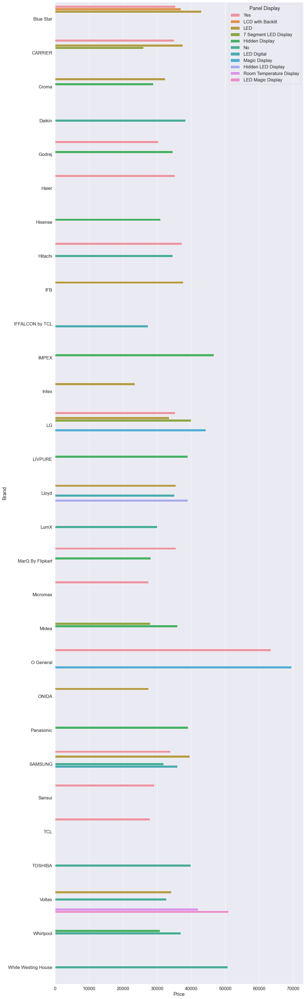

In [41]:
plt.figure(figsize=(16, 65))
sns.barplot(y='Brand', x='Price',hue="Panel Display" ,data=data,ci = None)

## Price W.R.T. Evaporator Fin Type On Brand and Star Rating

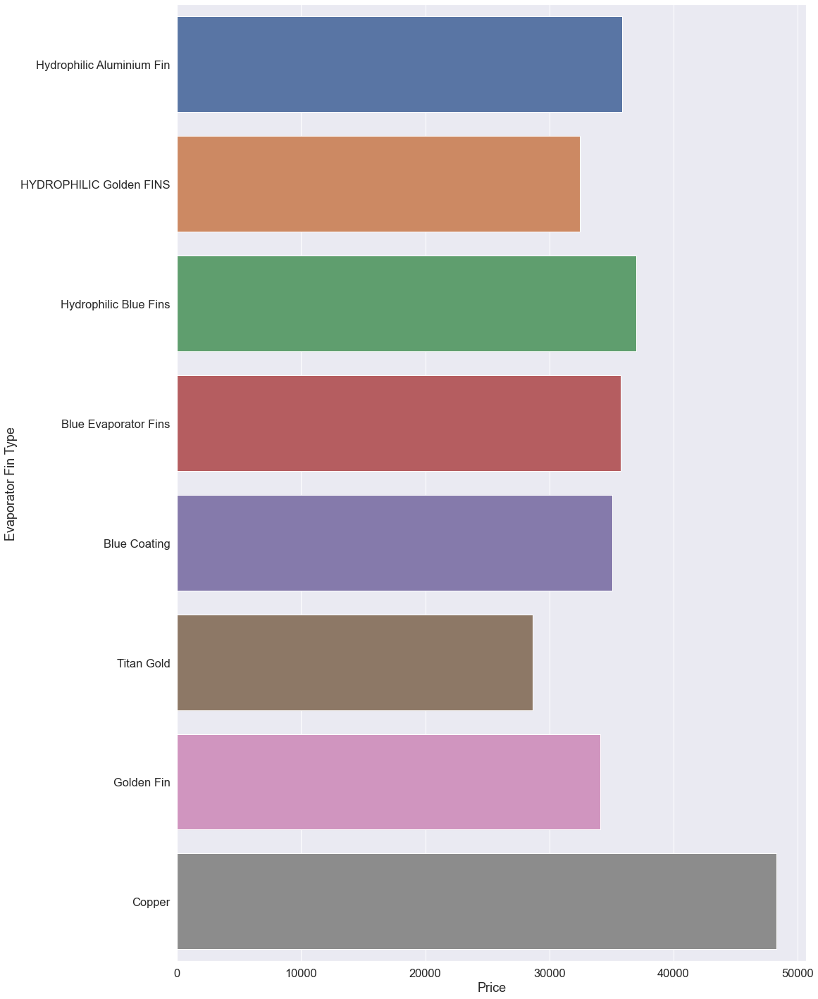

In [42]:
plt.figure(figsize=(16, 25))
sns.barplot(x='Price',y="Evaporator Fin Type" ,data=data,ci = None)

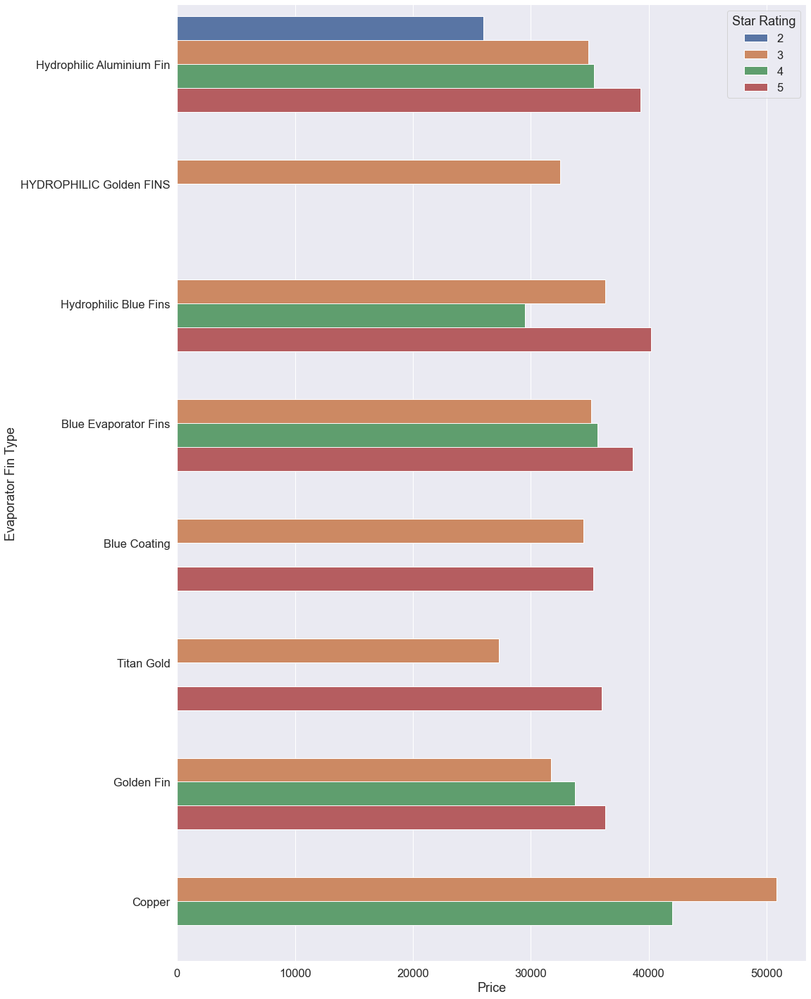

In [43]:
plt.figure(figsize=(16, 25))
sns.barplot(x='Price',y="Evaporator Fin Type" ,hue="Star Rating",data=data,ci = None)

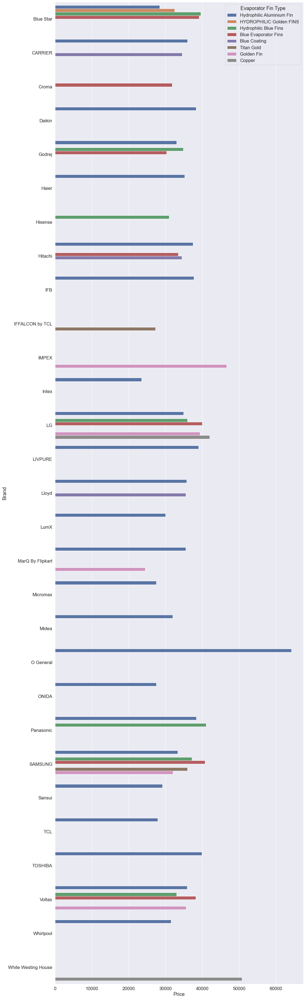

In [44]:
plt.figure(figsize=(16, 65))
sns.barplot(y='Brand', x='Price',hue="Evaporator Fin Type" ,data=data,ci = None)

## Price W.R.T. Condenser Fin Type On Brand and Star Rating

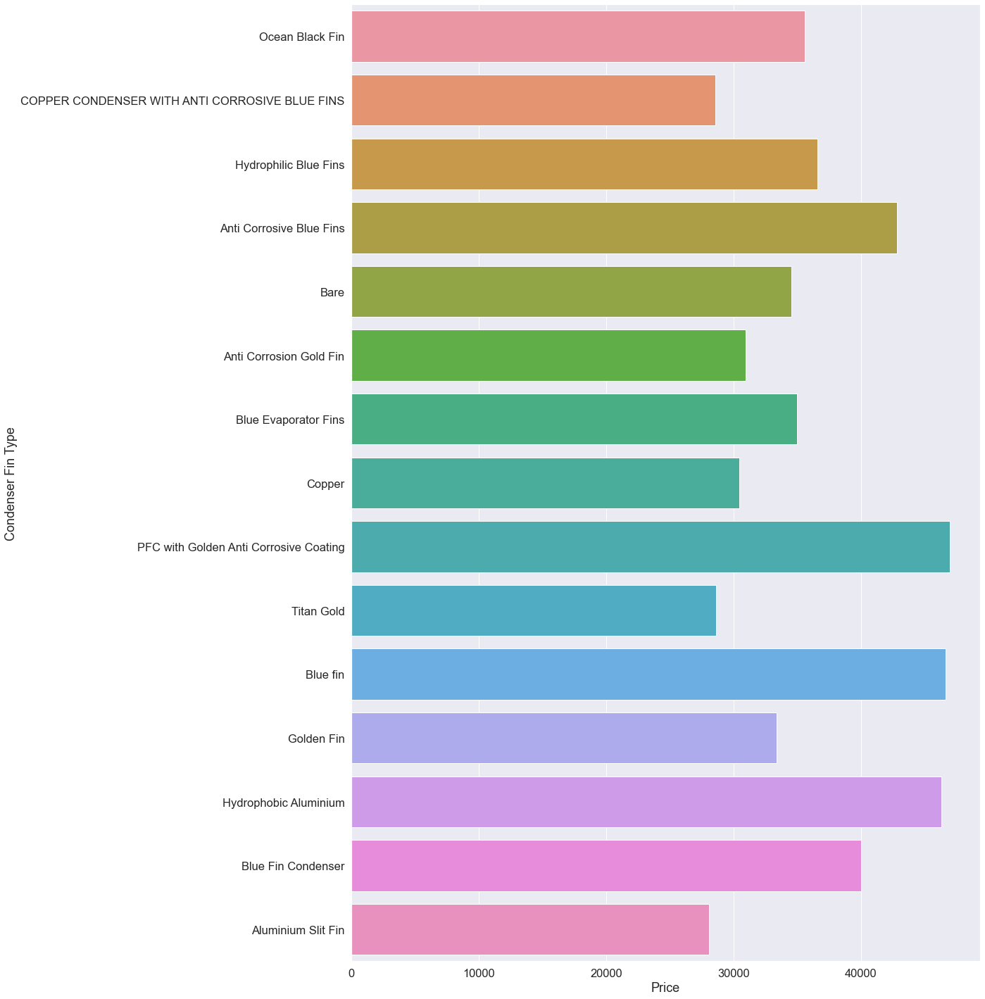

In [45]:
plt.figure(figsize=(16, 25))
sns.barplot(x='Price',y="Condenser Fin Type" ,data=data,ci = None)

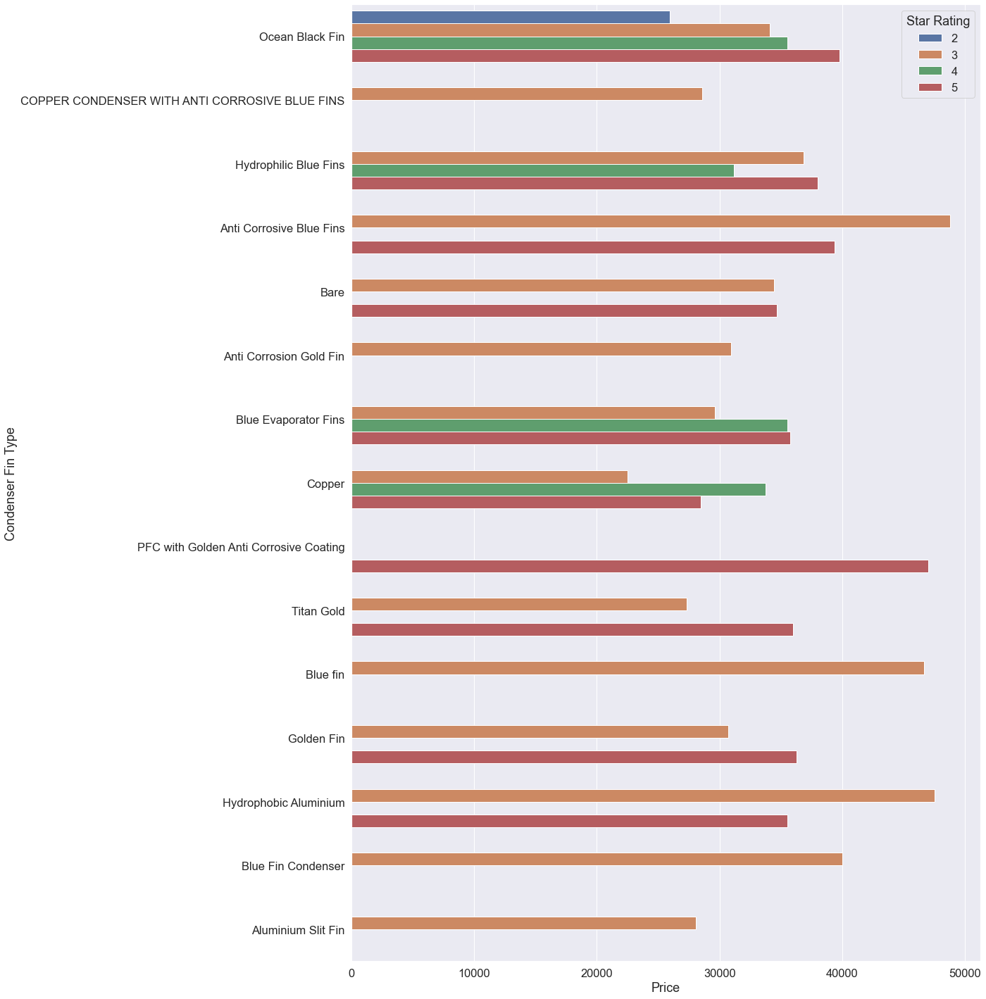

In [46]:
plt.figure(figsize=(16, 25))
sns.barplot(x='Price',y="Condenser Fin Type" ,hue="Star Rating",data=data,ci = None)

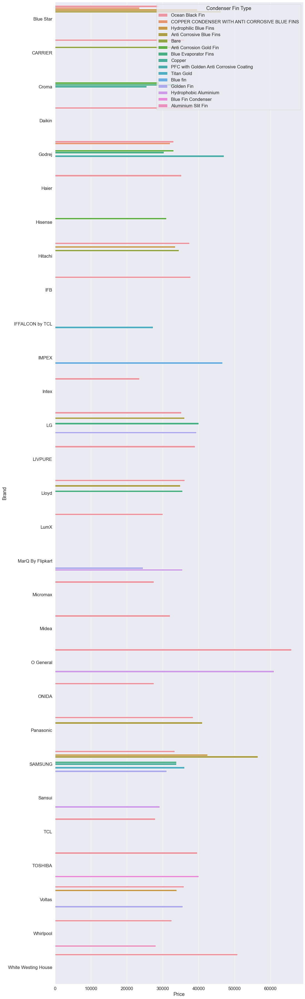

In [47]:
plt.figure(figsize=(16, 65))
sns.barplot(y='Brand', x='Price',hue="Condenser Fin Type" ,data=data,ci = None)

In [48]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 667 entries, 0 to 666
Data columns (total 48 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Brand                         667 non-null    object 
 1   Model Name                    667 non-null    object 
 2   Type                          667 non-null    int64  
 3   Capacity in Tons              667 non-null    float64
 4   Star Rating                   667 non-null    int64  
 5   Series                        667 non-null    object 
 6   Cooling and Heating           667 non-null    object 
 7   Cooling Capacity              667 non-null    float64
 8   Compressor                    667 non-null    object 
 9   Dehumidification              667 non-null    object 
 10  Remote Control                667 non-null    object 
 11  Refrigerant                   667 non-null    object 
 12  Operating Modes               667 non-null    object 
 13  Techn

## Price W.R.T. Air Flow Direction On Brand and Star Rating

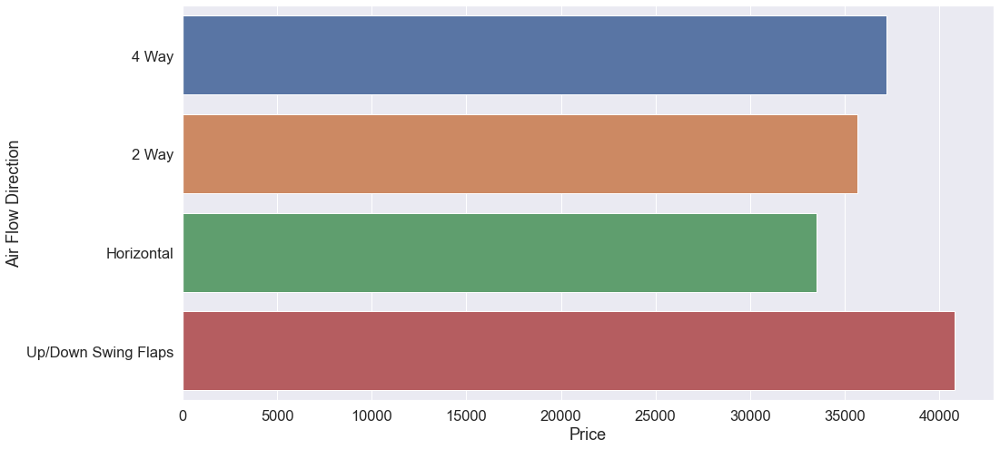

In [49]:
plt.figure(figsize=(16, 8))
sns.barplot(x='Price',y="Air Flow Direction" ,data=data,ci = None)

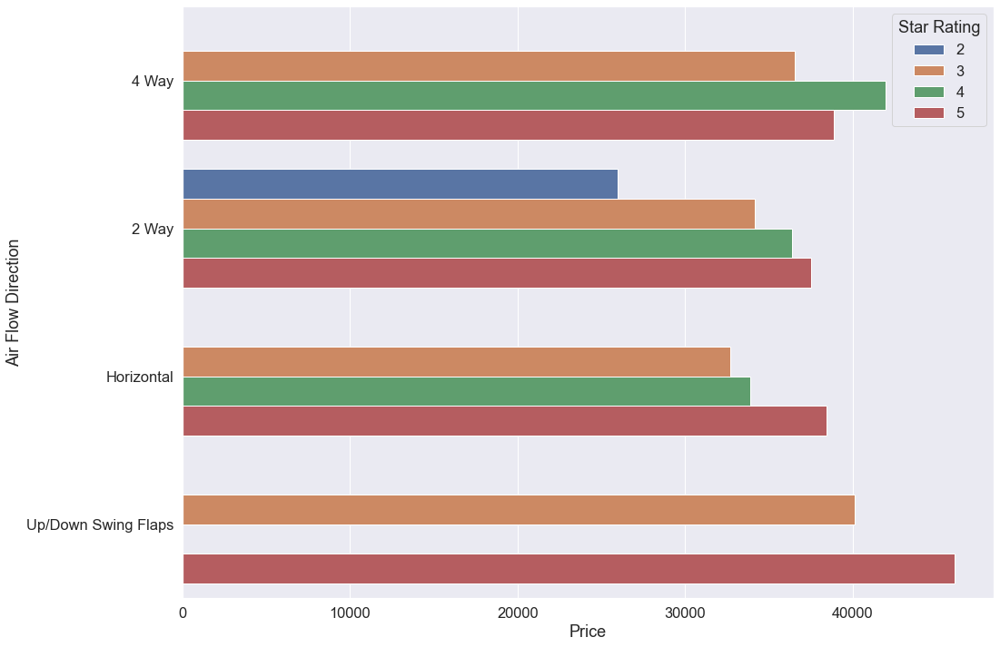

In [50]:
plt.figure(figsize=(16, 12))
sns.barplot(x='Price',y="Air Flow Direction" ,hue="Star Rating",data=data,ci = None)

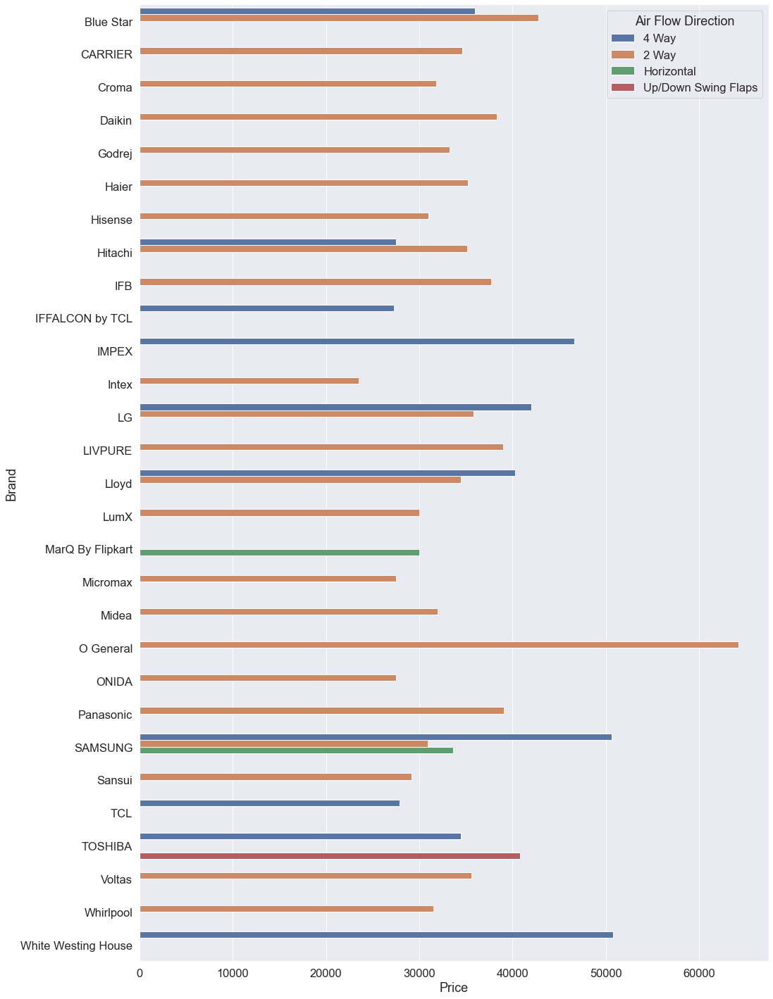

In [51]:
plt.figure(figsize=(16, 25))
sns.barplot(y='Brand', x='Price',hue="Air Flow Direction" ,data=data,ci = None)

In [52]:
data.columns

Index(['Brand', 'Model Name', 'Type', 'Capacity in Tons', 'Star Rating',
       'Series', 'Cooling and Heating', 'Cooling Capacity', 'Compressor',
       'Dehumidification', 'Remote Control', 'Refrigerant', 'Operating Modes',
       'Technology Used', 'Condenser Coil', 'Indoor Unit Weight',
       'Outdoor Unit Weight', 'Panel Display', 'Indoor Temperature Indicator',
       'Turbo Mode', 'ISEER', 'Evaporator Fin Type', 'Condenser Fin Type',
       'Stepped Louvers', 'Auto Air Swing', 'Air Flow Direction',
       'Anti-bacteria Filter', 'Dust Filter', 'Deodorizing Filter',
       'Auto Restart', 'Timer', 'Child Lock', 'Quiet Mode', 'Sleep Mode',
       'Memory Feature', 'Self Diagnosis', 'Emergency Operational Button',
       'Power Requirement', 'Power Consumption', 'Price',
       'low Indoor Noise Level', 'high Indoor Noise Level', 'indoor W',
       'indoor h', 'indoor d', 'outdoor W', 'outdoor h', 'outdoor d'],
      dtype='object')

## Features with Yes and No Values

In [53]:
li = [ 'Dehumidification', 'Indoor Temperature Indicator',
       'Turbo Mode', 'Stepped Louvers', 'Auto Air Swing', 
       'Anti-bacteria Filter', 'Dust Filter', 'Deodorizing Filter',
       'Auto Restart', 'Timer', 'Child Lock', 'Quiet Mode', 'Sleep Mode',
       'Memory Feature', 'Self Diagnosis', 'Emergency Operational Button']

## Brand W.R.T. Price On Features

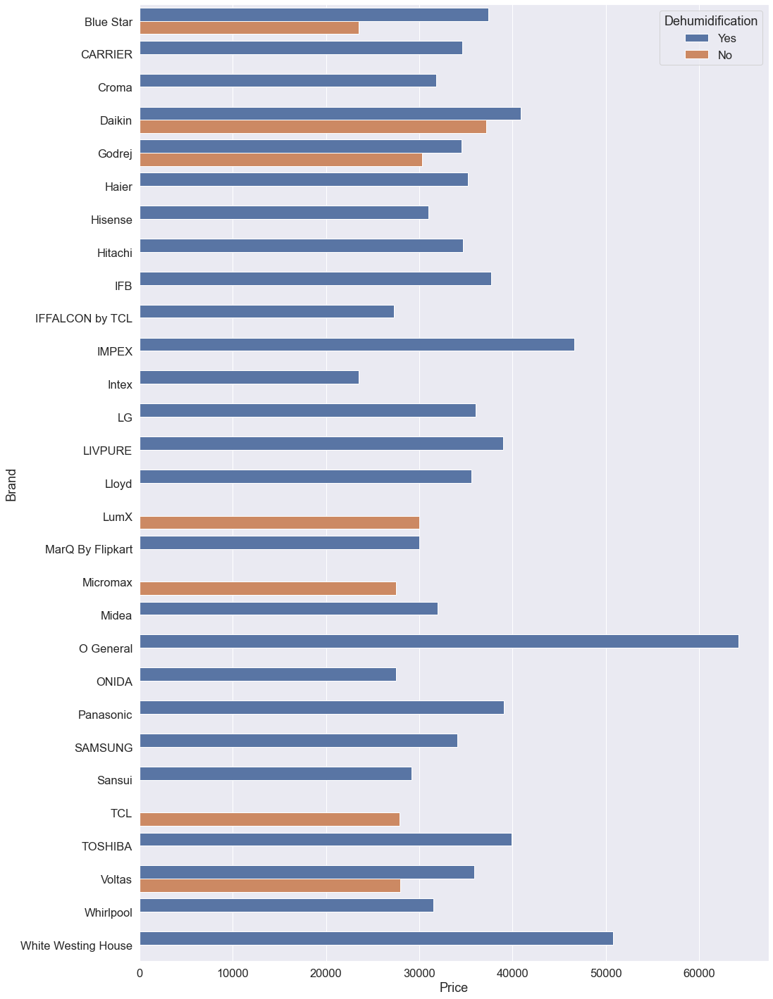

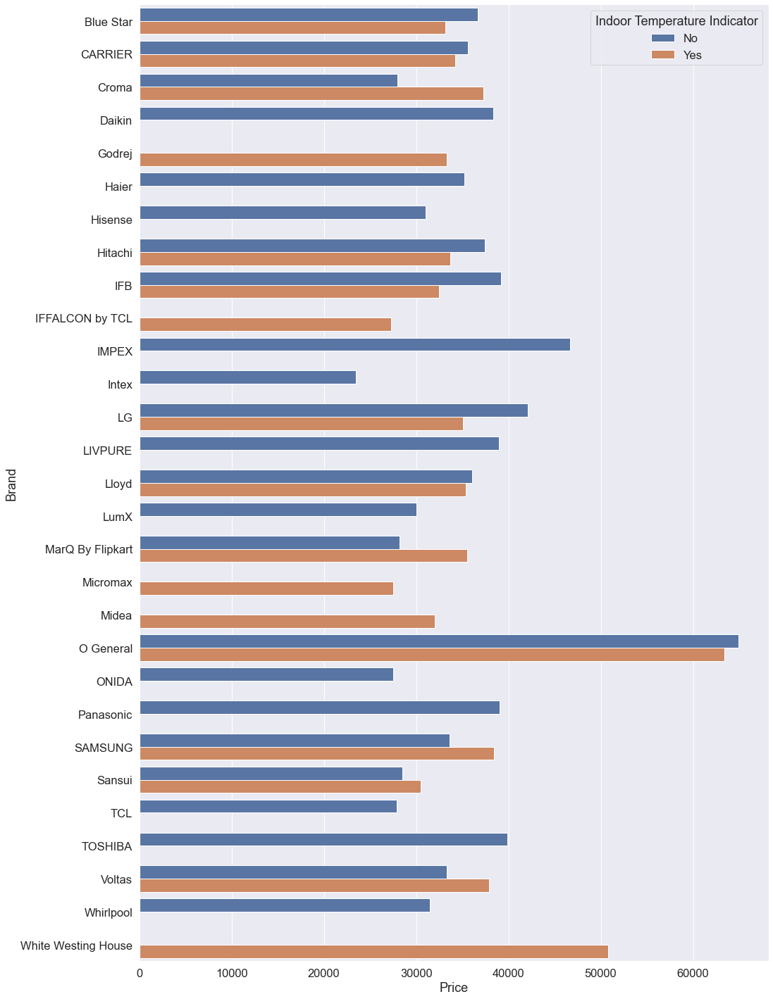

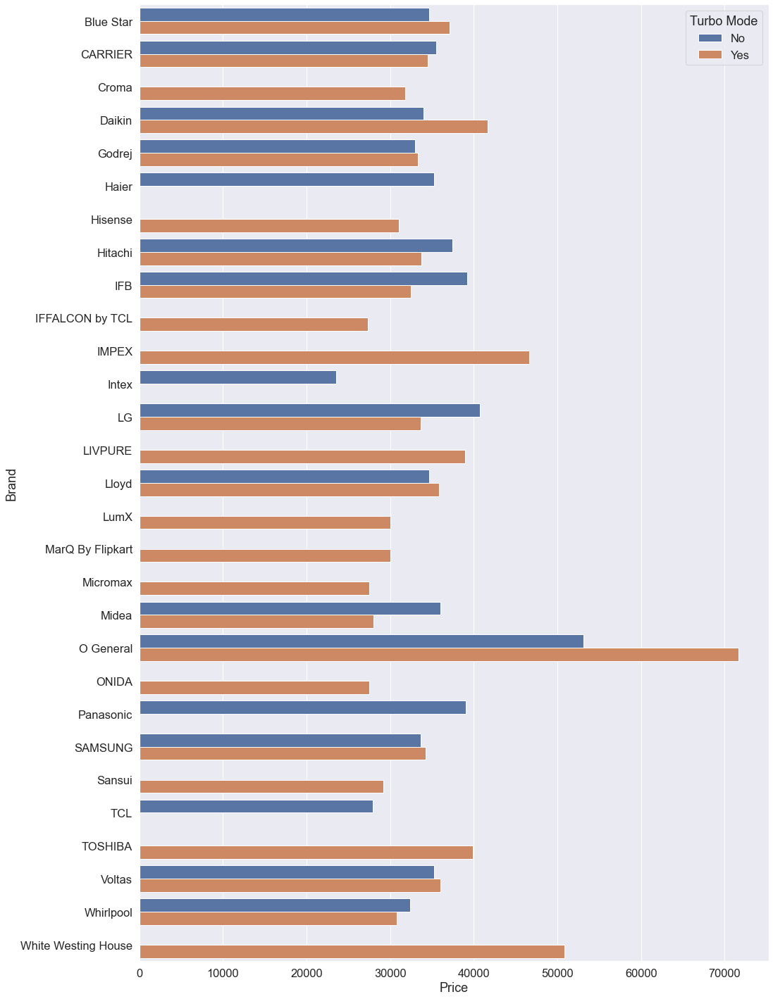

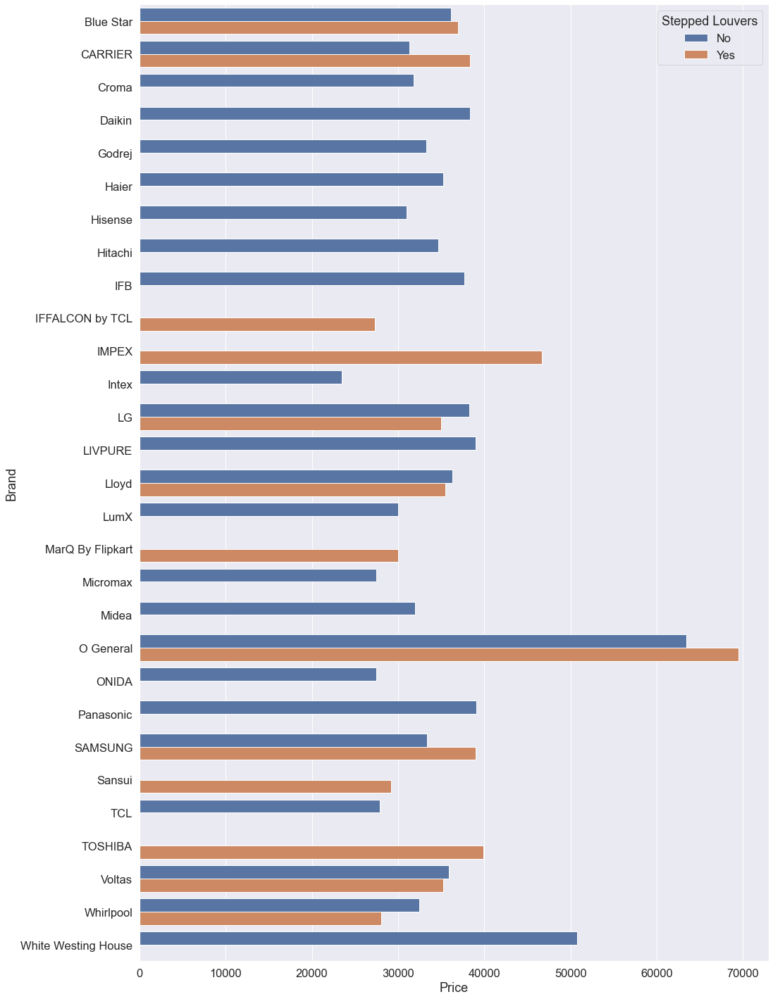

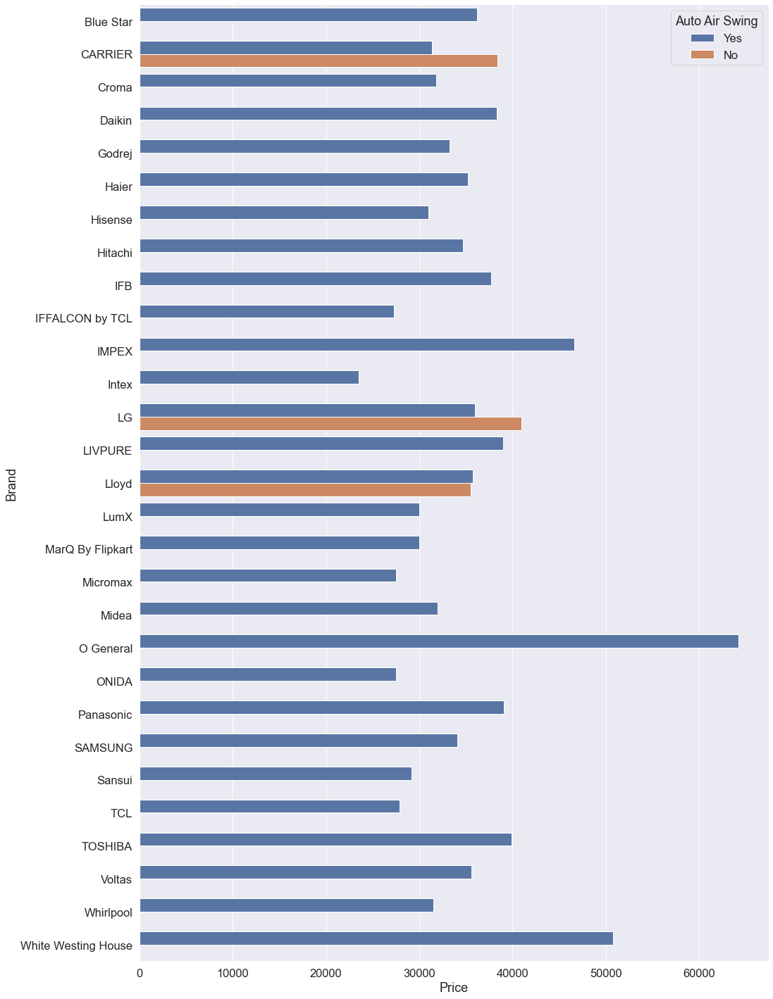

...

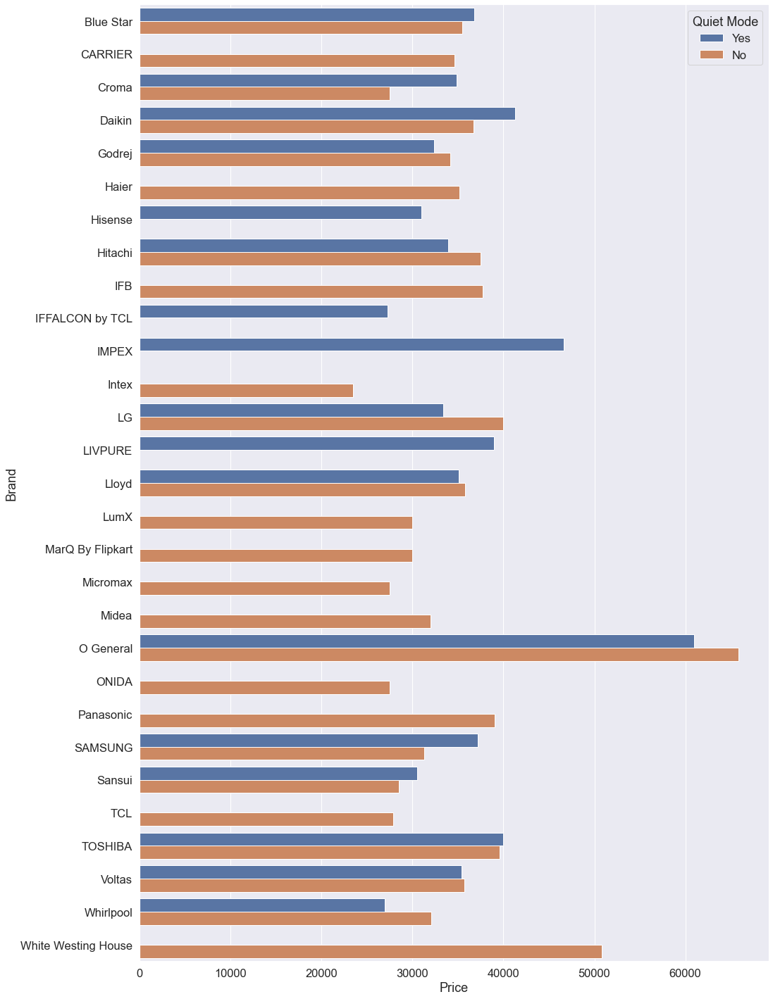

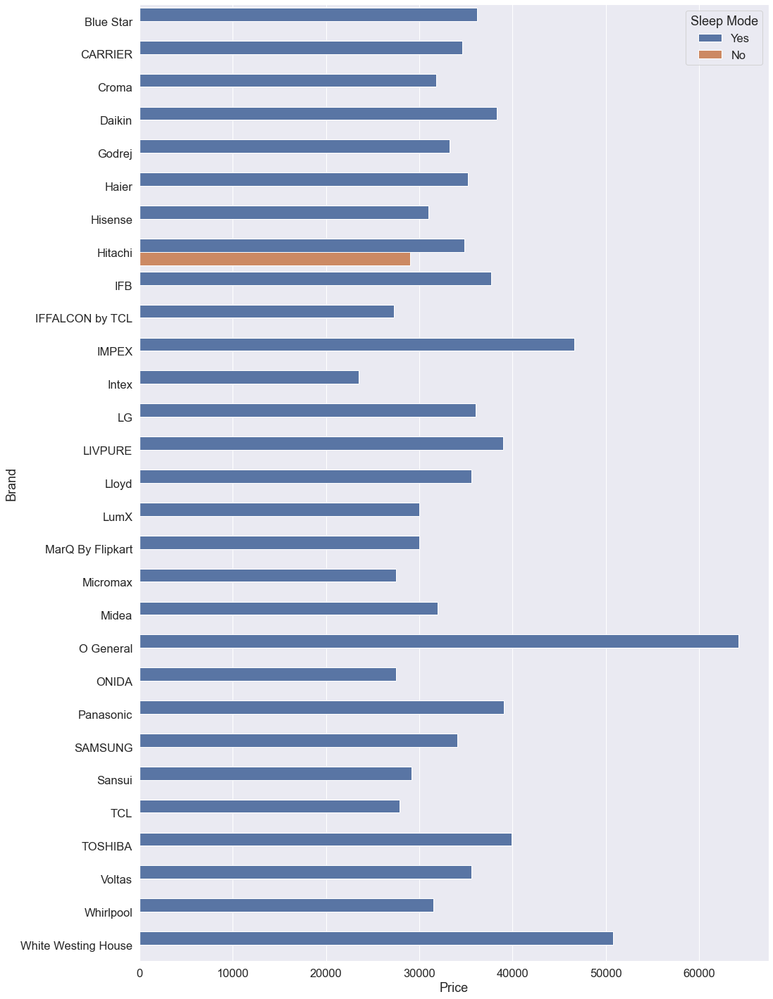

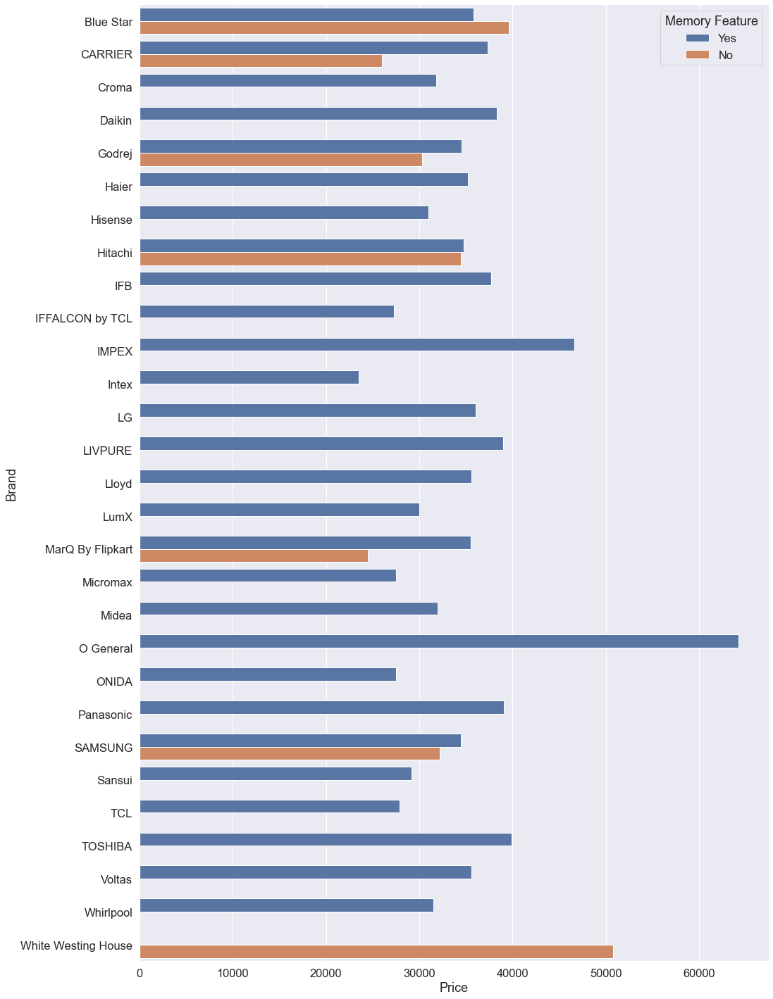

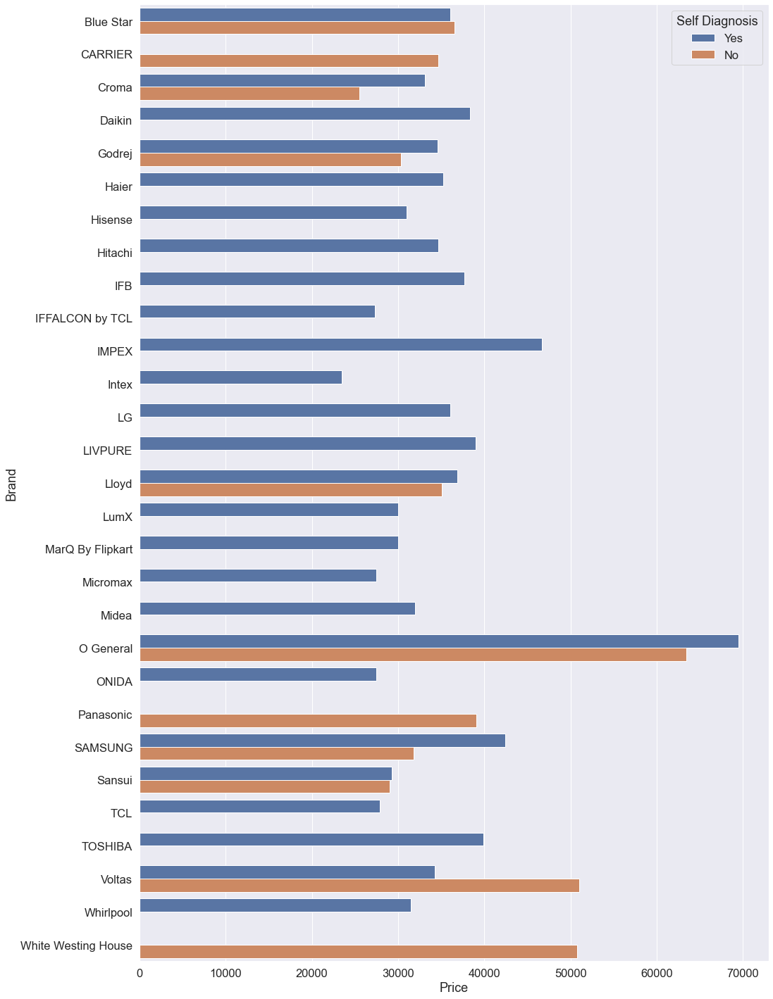

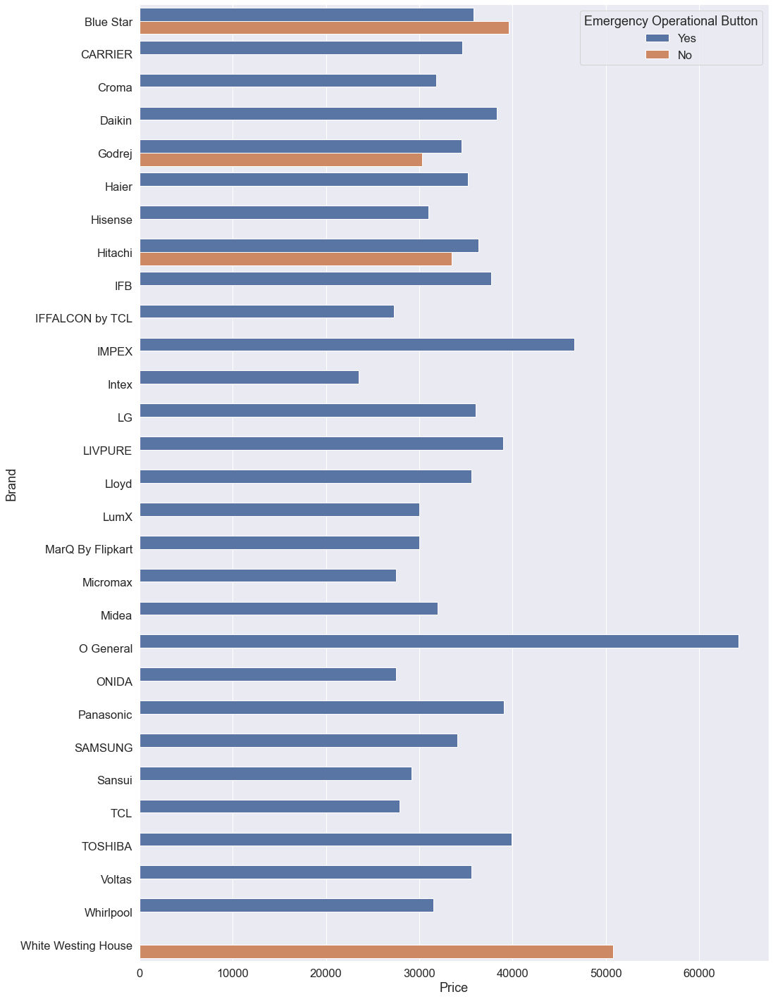

In [54]:
for x in li:
    plt.figure(figsize=(16, 25))
    sns.barplot(y='Brand', x='Price',hue=x ,data=data,ci = None)

1. AC's with Dehumdification have higher price(Blue Star, Daikin, Godrej, Voltas), rest have dehumdification in all AC's.

2. AC's with Indoor Temperature Indicator have high price in some brands(Samsung, sansui, Voltas).

3. Turbo Mode has impact on price increases when it is present.

4. Stepped Louvers has impact on price increases when it is present.

5. Auto Air Swing does not have a huge impact on price.

In [55]:
li = [ 'Dehumidification', 'Indoor Temperature Indicator',
       'Turbo Mode', 'Stepped Louvers', 'Auto Air Swing', 
       'Anti-bacteria Filter', 'Dust Filter', 'Deodorizing Filter',
       'Auto Restart', 'Timer', 'Child Lock', 'Quiet Mode',
       'Memory Feature', 'Self Diagnosis', 'Emergency Operational Button']

## Brand W.R.T. Star Rating On Features

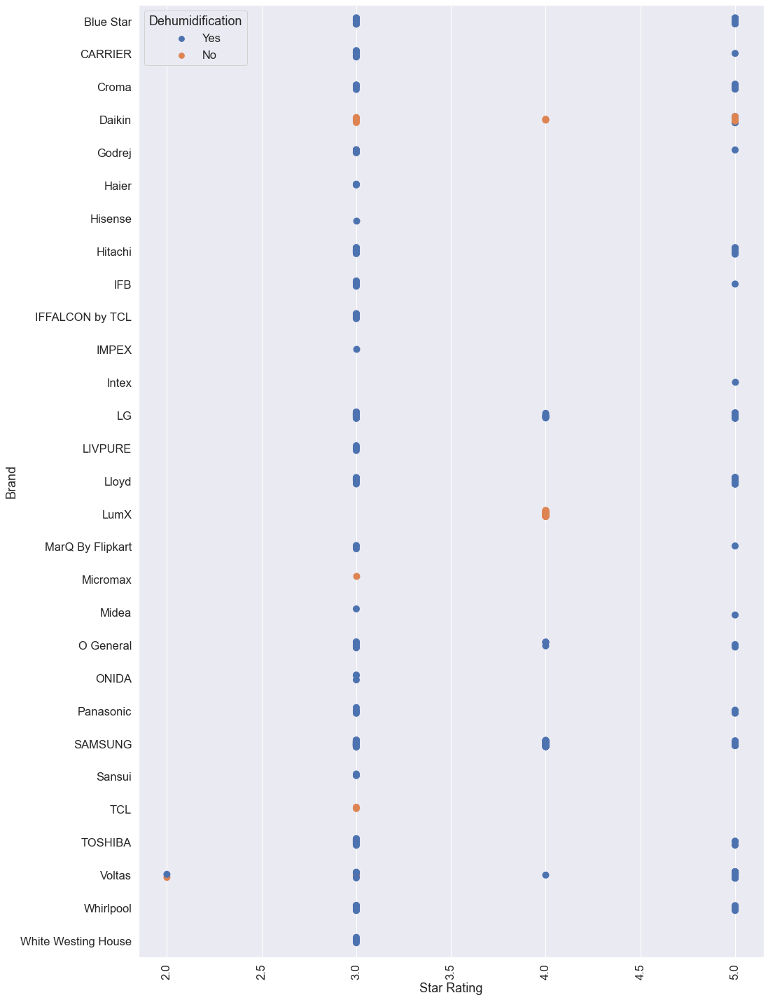

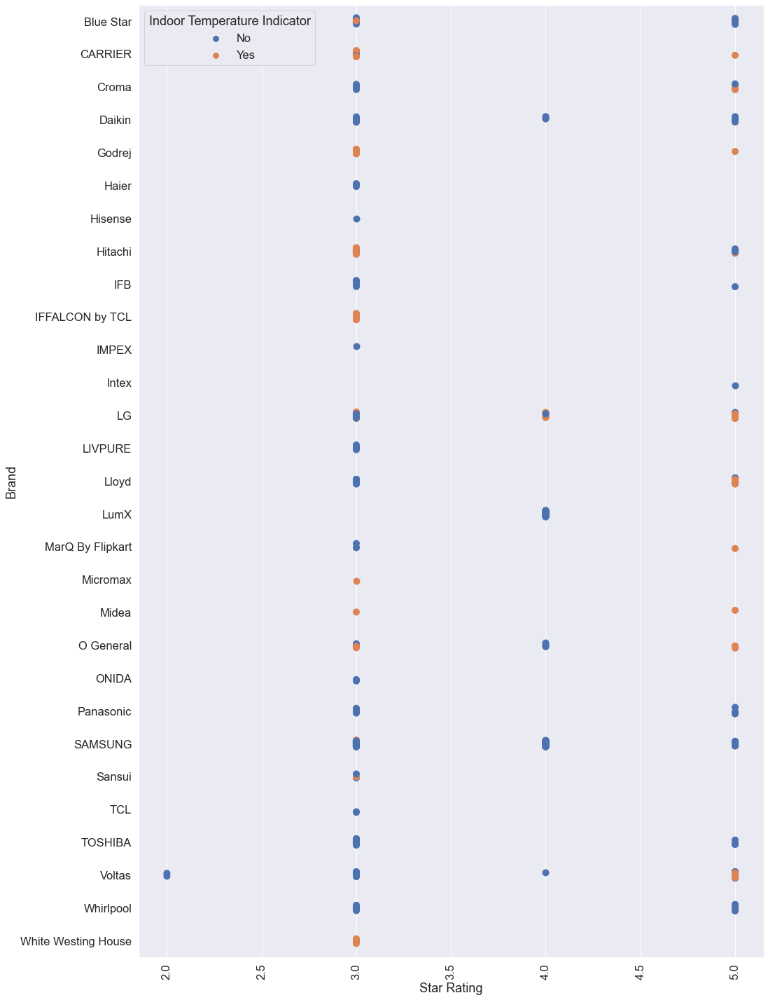

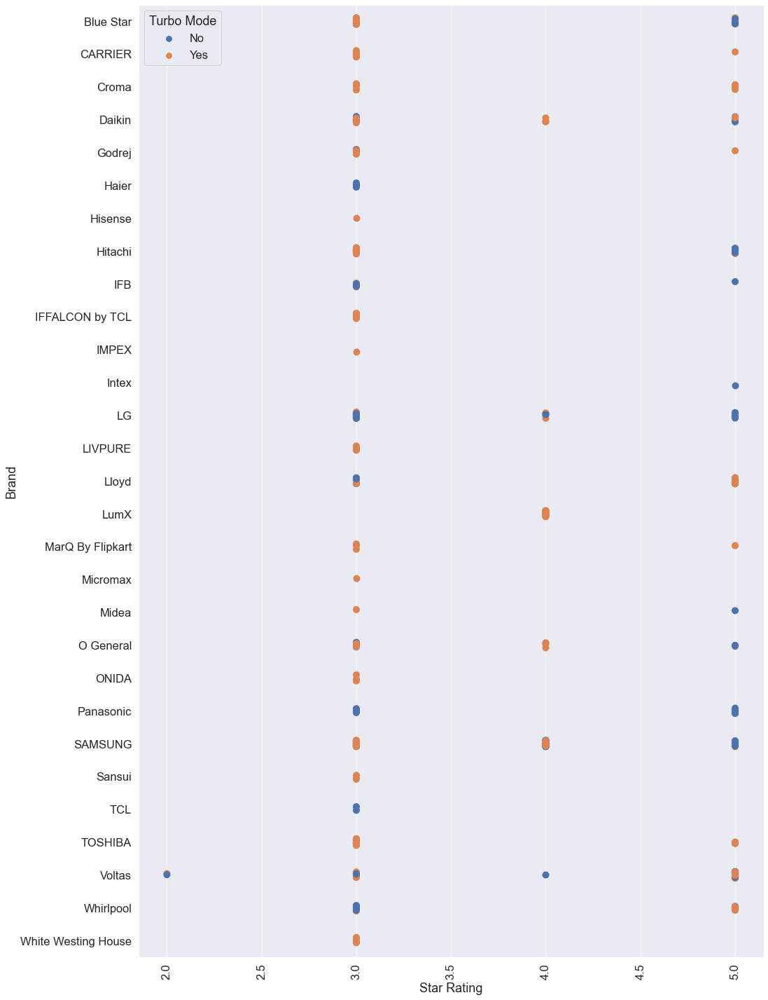

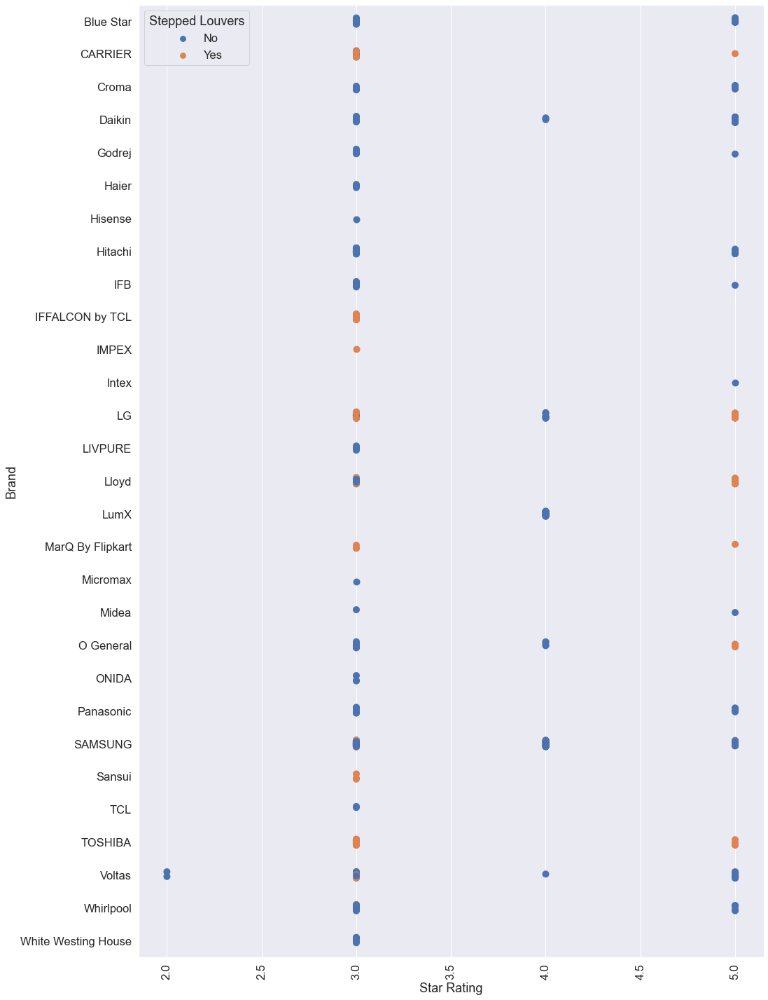

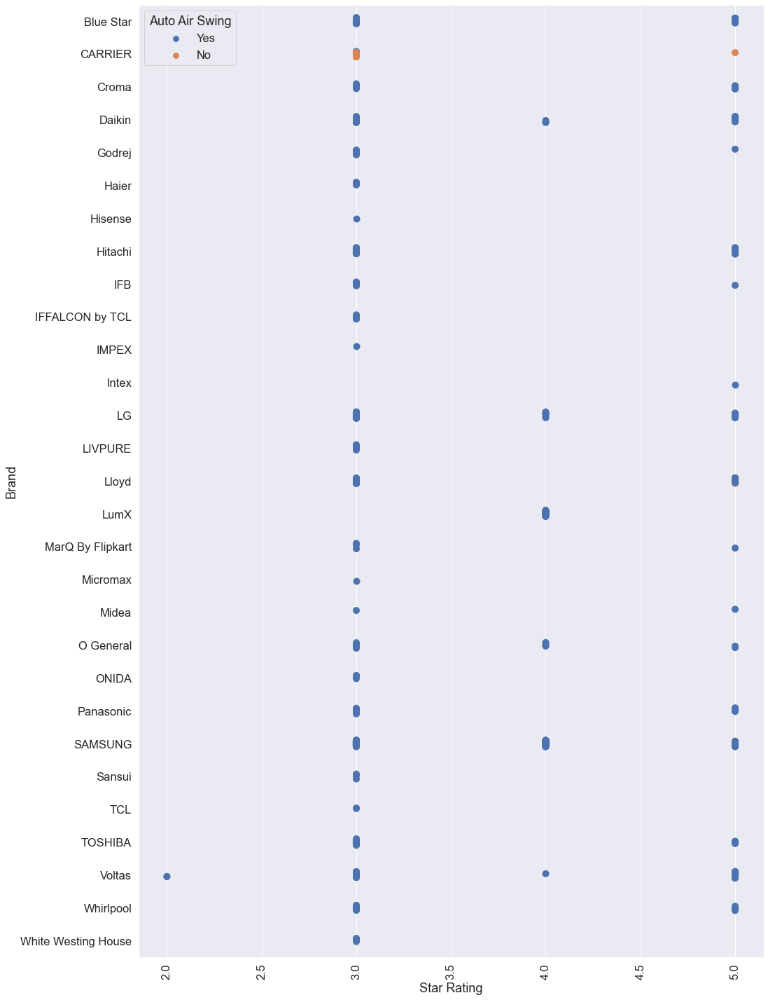

...

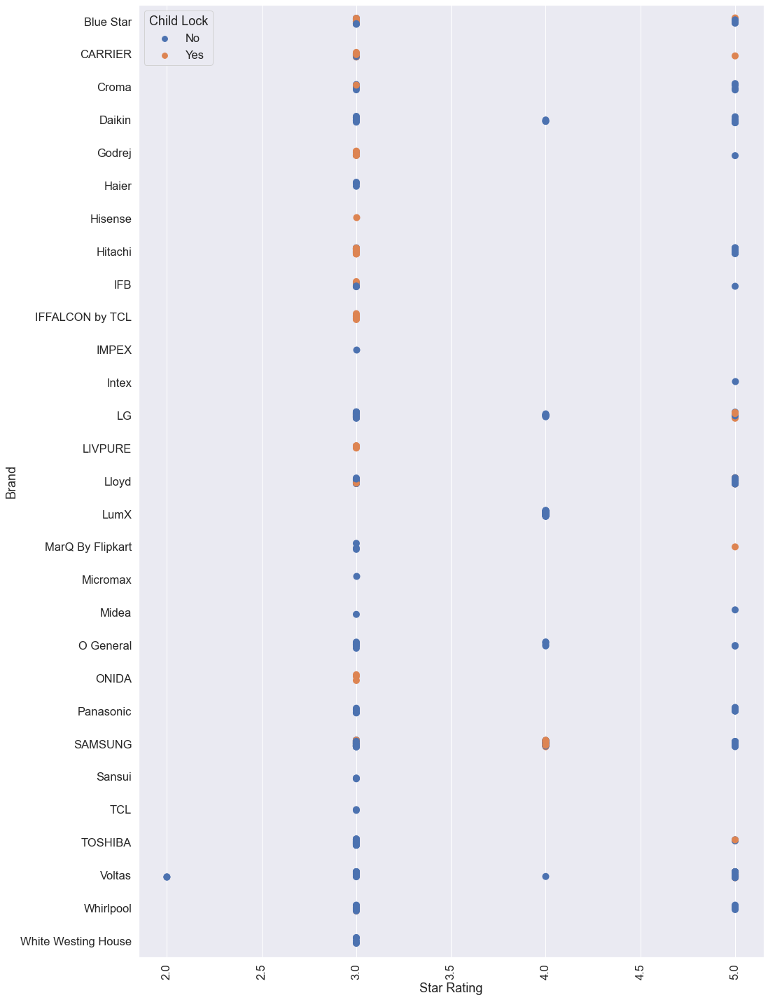

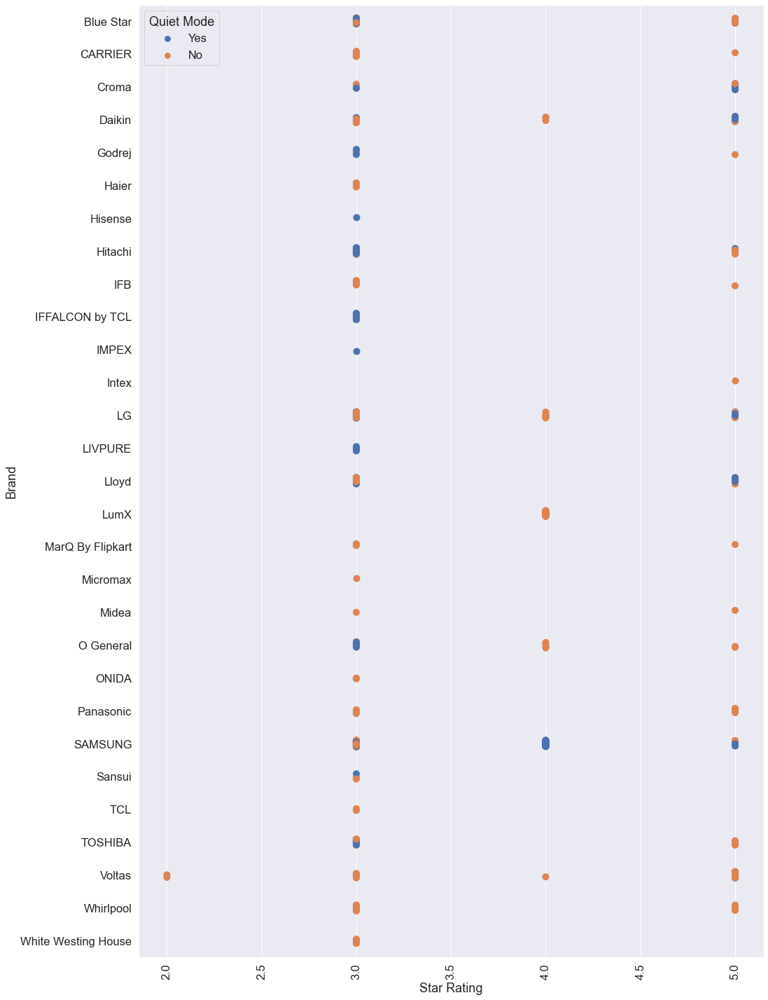

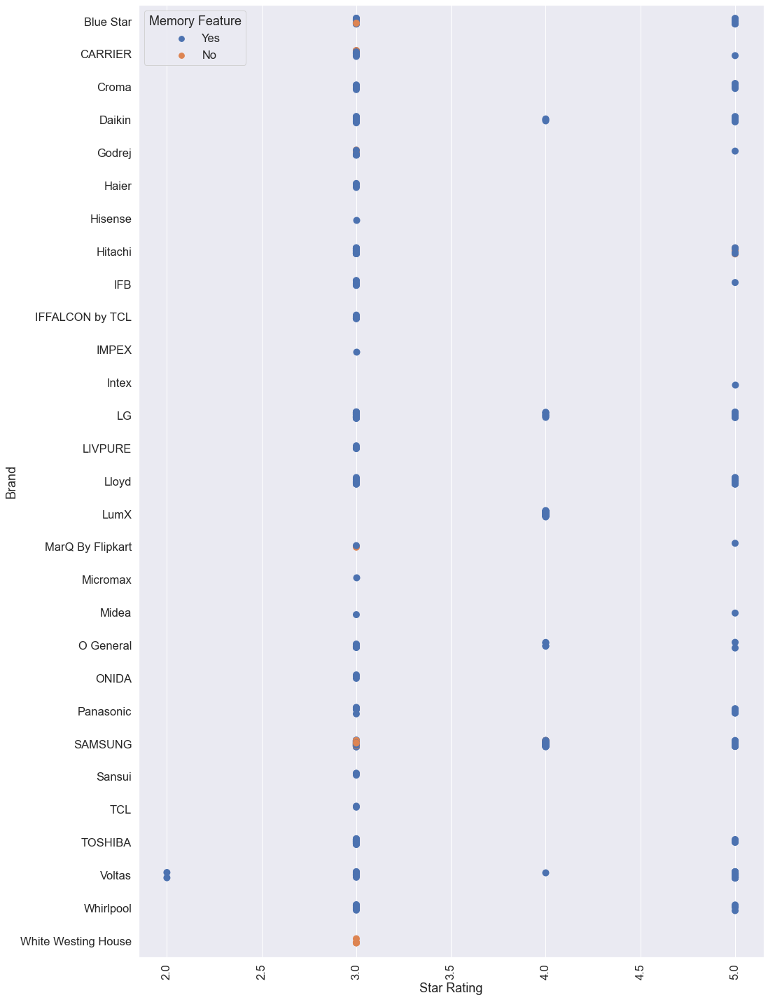

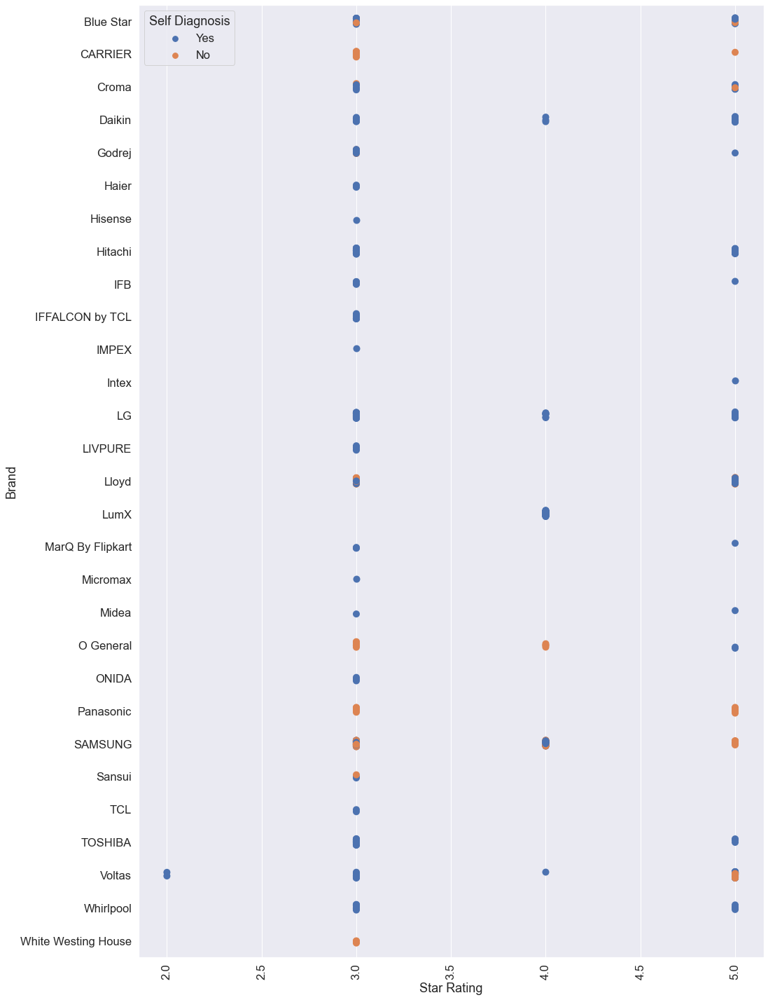

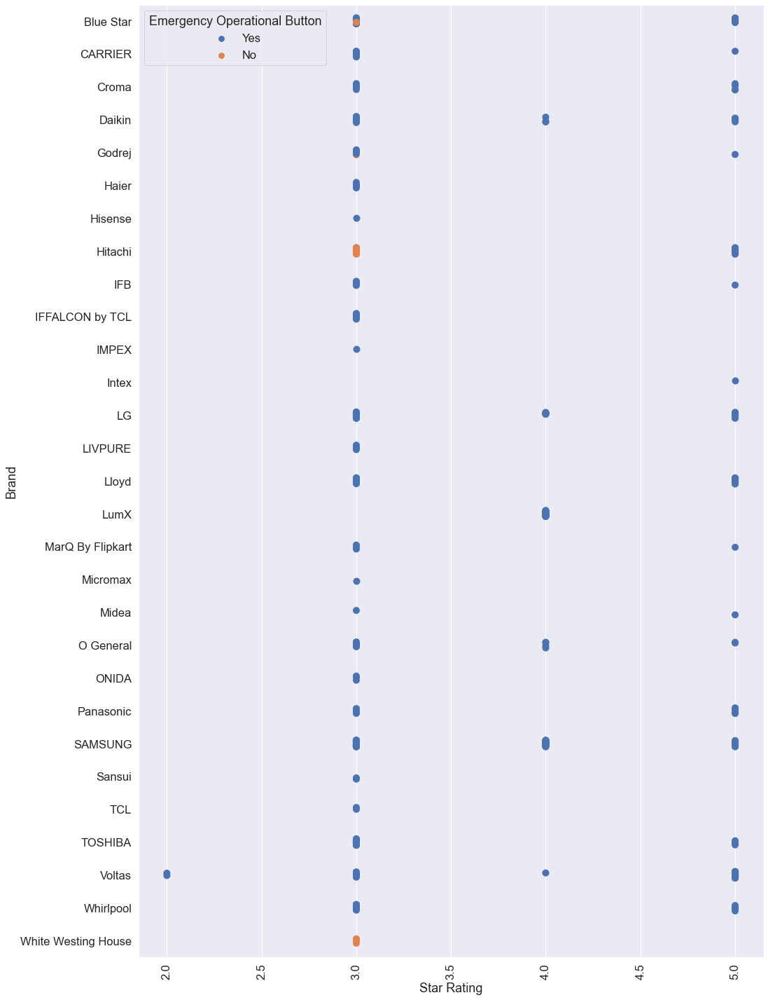

In [56]:
for x in li:
    plt.figure(figsize=(16, 25))
    sns.stripplot(y='Brand', x='Star Rating',hue=x ,data=data, s = 10)
    plt.xticks(rotation=90)
    plt.show()

In which AC which feature is present and which is not according to rating.

## Price W.R.T. Condeser Coil On Brand and Star Rating

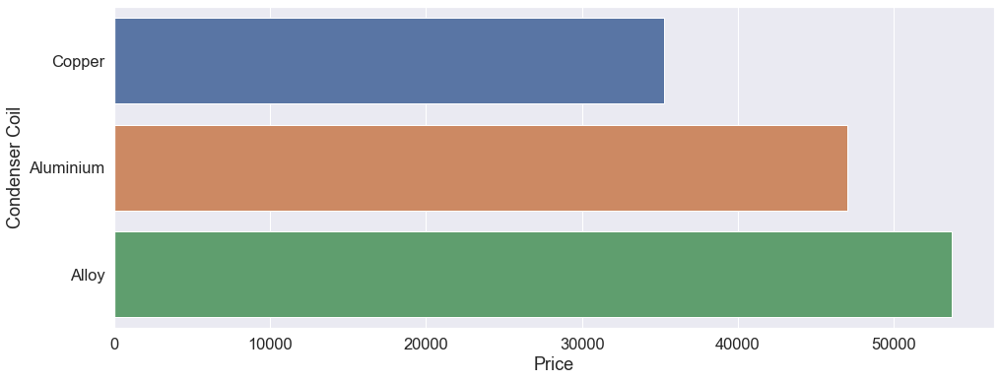

In [57]:
plt.figure(figsize=(16, 6))
sns.barplot(x='Price',y="Condenser Coil" ,data=data,ci = None)

Alloy has highest price.

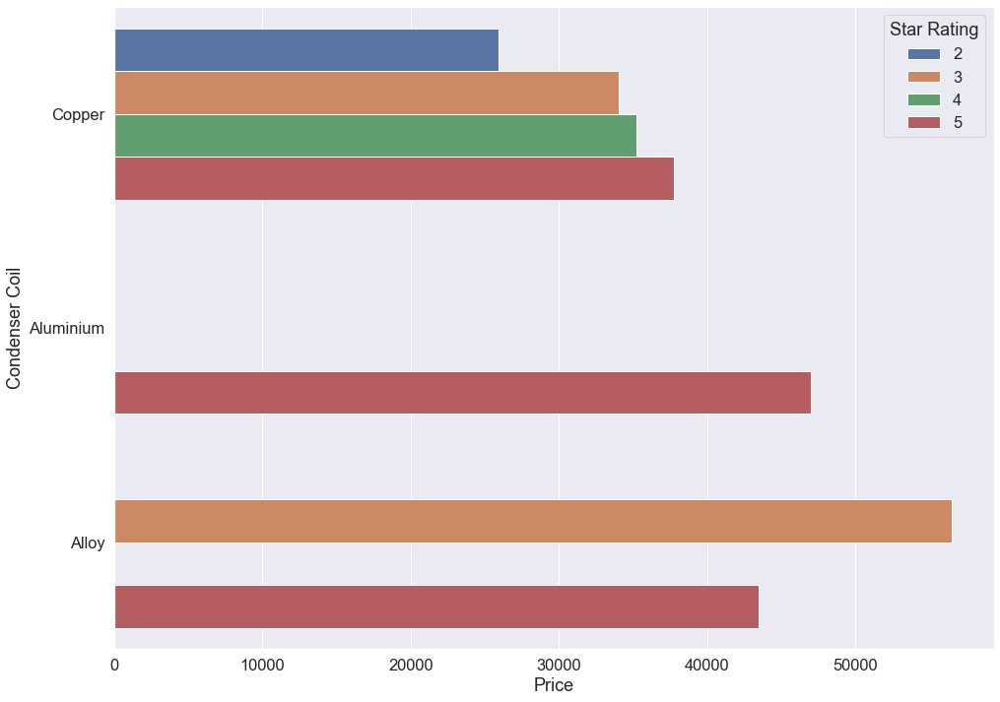

In [58]:
plt.figure(figsize=(16, 12))
sns.barplot(x='Price',y="Condenser Coil" ,hue="Star Rating",data=data,ci = None)

Alloy and aluminium is mostly used in 5 and 3 Star Rating.

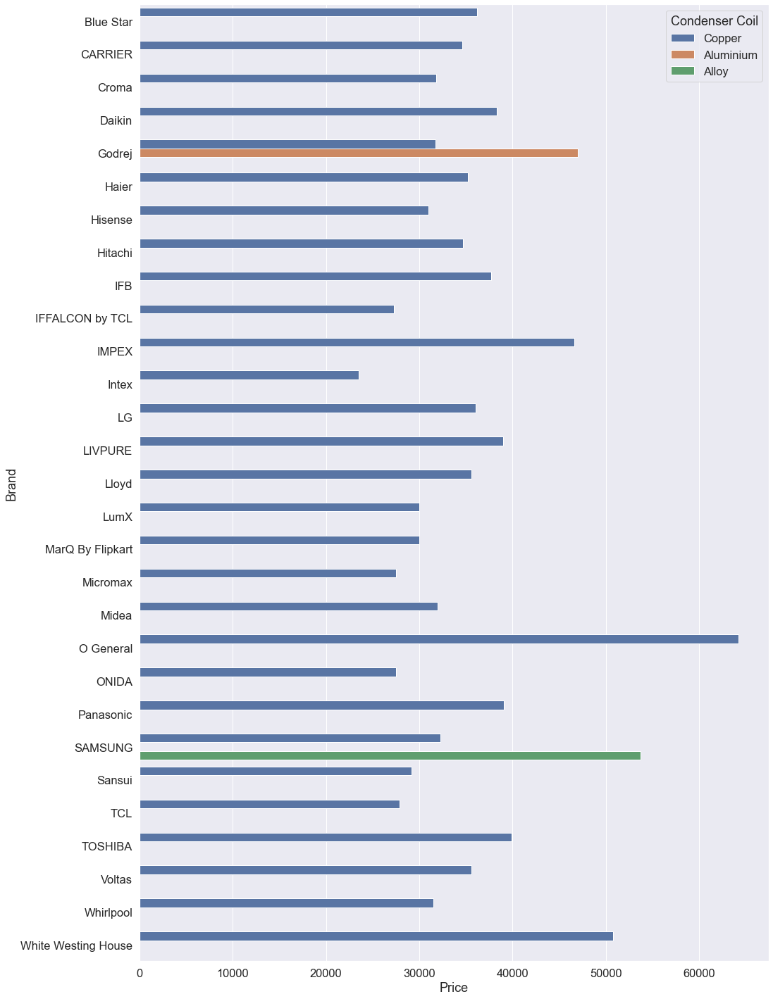

In [59]:
plt.figure(figsize=(16, 25))
sns.barplot(y='Brand', x='Price',hue="Condenser Coil" ,data=data,ci = None)

Godrej uses aluminium condenser coil and samsung uses alloy Condenser Coil.

In [60]:
#list of all numerical columns remaining
li1 = ['Indoor Unit Weight',
       'Outdoor Unit Weight', 'ISEER',
       'Power Requirement', 'Power Consumption','indoor W',
       'indoor h', 'indoor d', 'outdoor W', 'outdoor h', 'outdoor d',
       'low Indoor Noise Level', 'high Indoor Noise Level']

## Numerical Columns W.R.T. Price On Star Rating

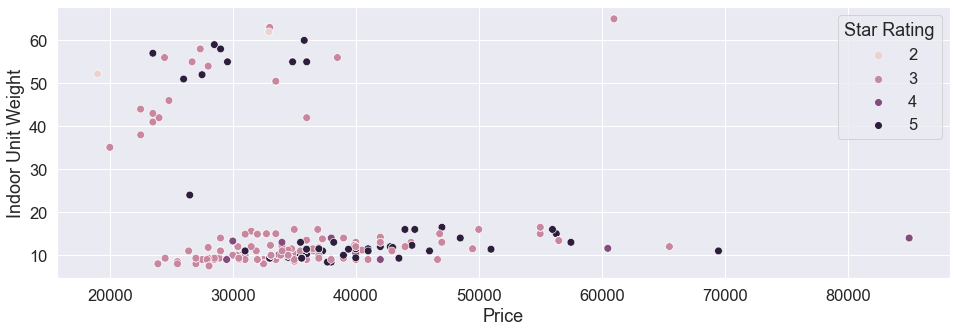

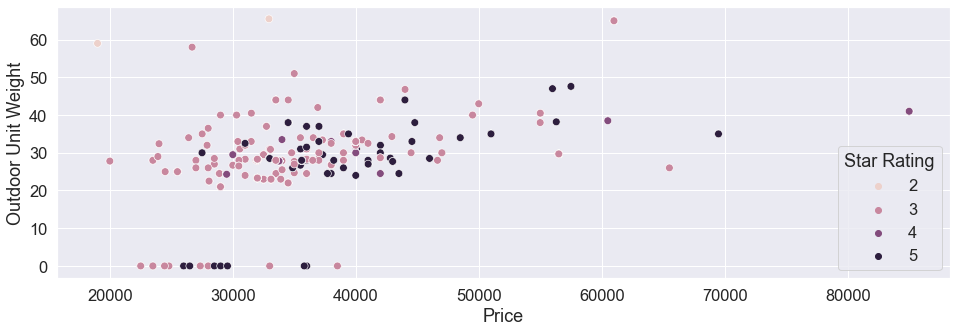

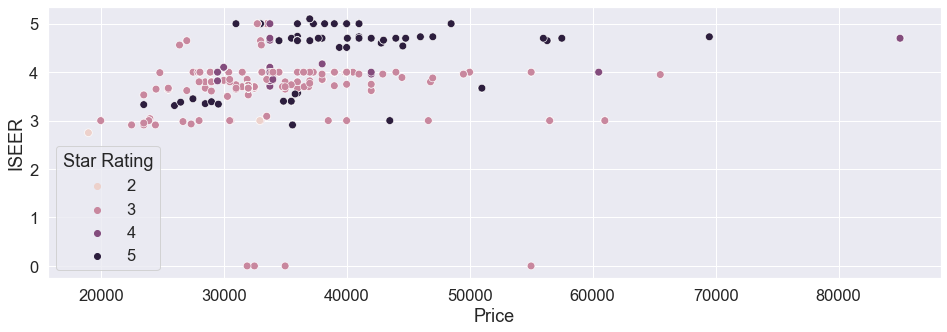

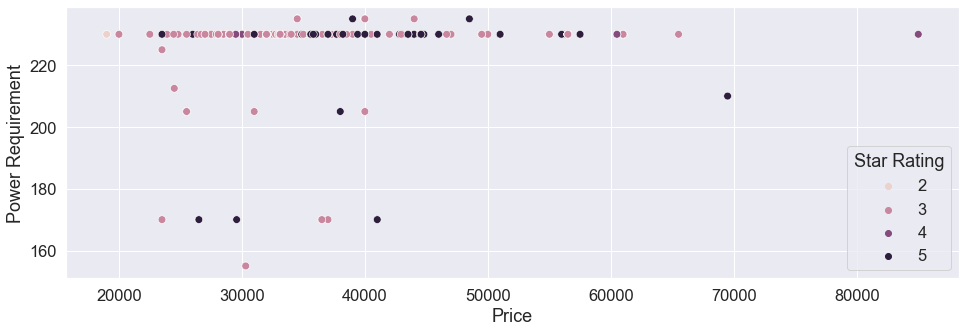

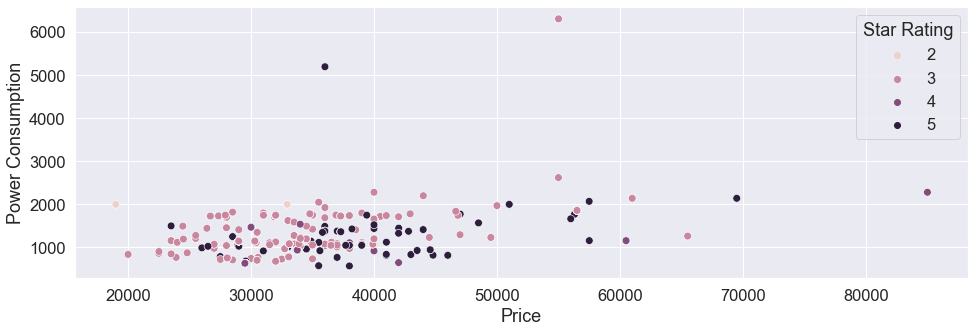

...

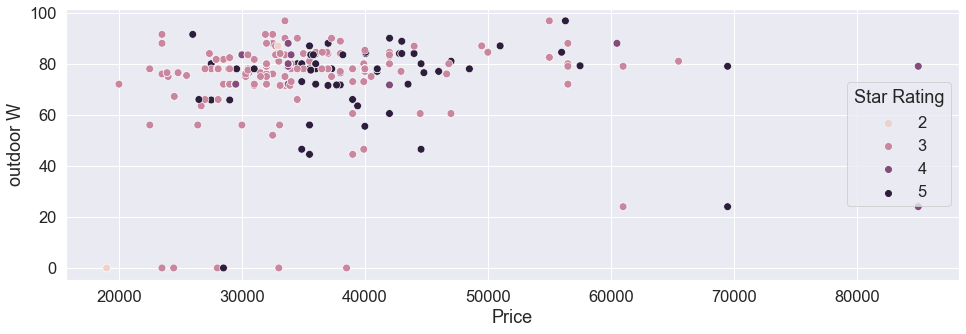

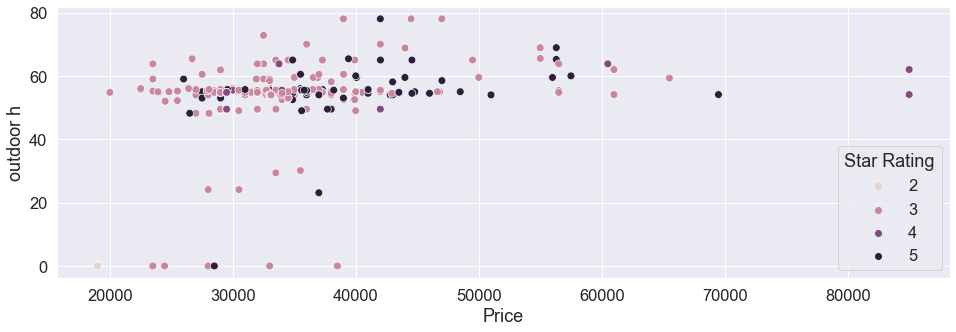

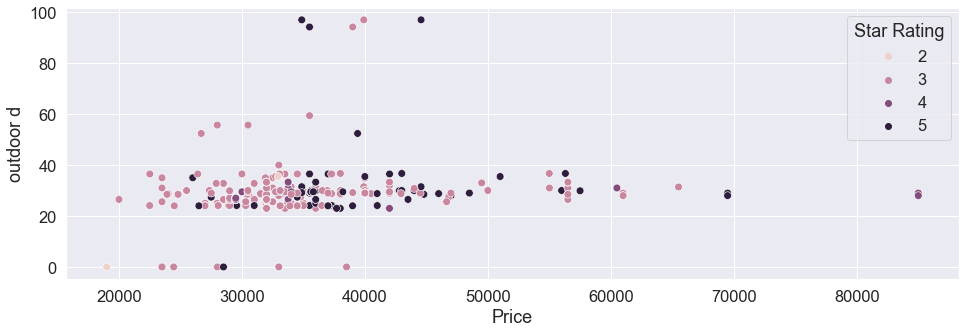

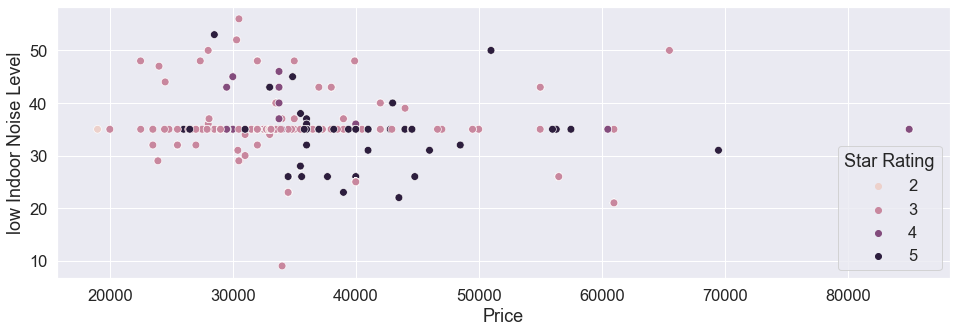

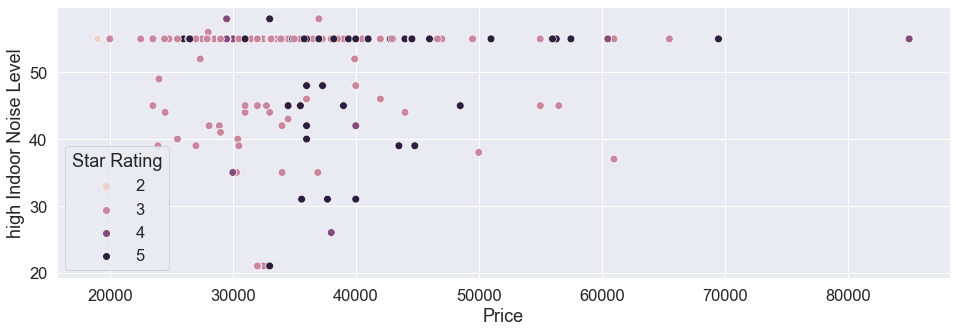

In [61]:
for x in li1:
    plt.figure(figsize=(16, 5))
    sns.scatterplot(y=x, x='Price',hue = "Star Rating",data=data,s=60)

1. Some AC have Outdoor Unit weight as 0 and are mostly window AC, majorly 3Star and 5star, mostly AC who have rating 4 and 5 have higher price.

2. 5star AC have higher ISEER value than other Rating AC's, not major impact on Price.

3. Mostly AC have same power Requirement, but which AC have less power requirement the price is low.

4. There is a slight increase in price as the power consumption is increased.

## Numerical Columns W.R.T. Brand On Star Rating


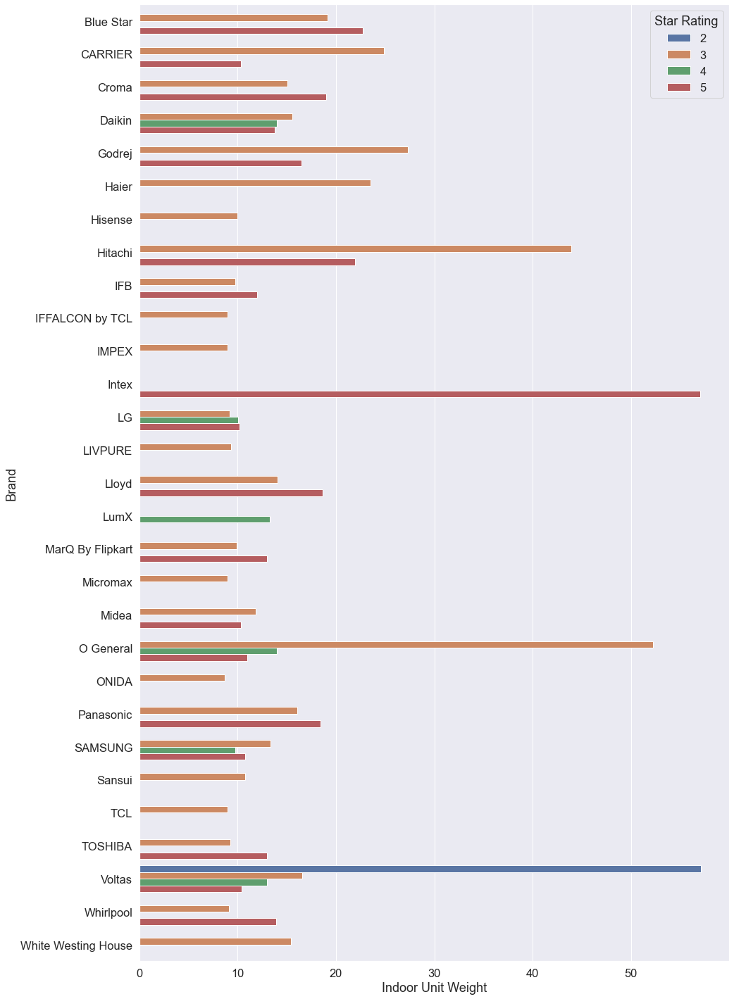

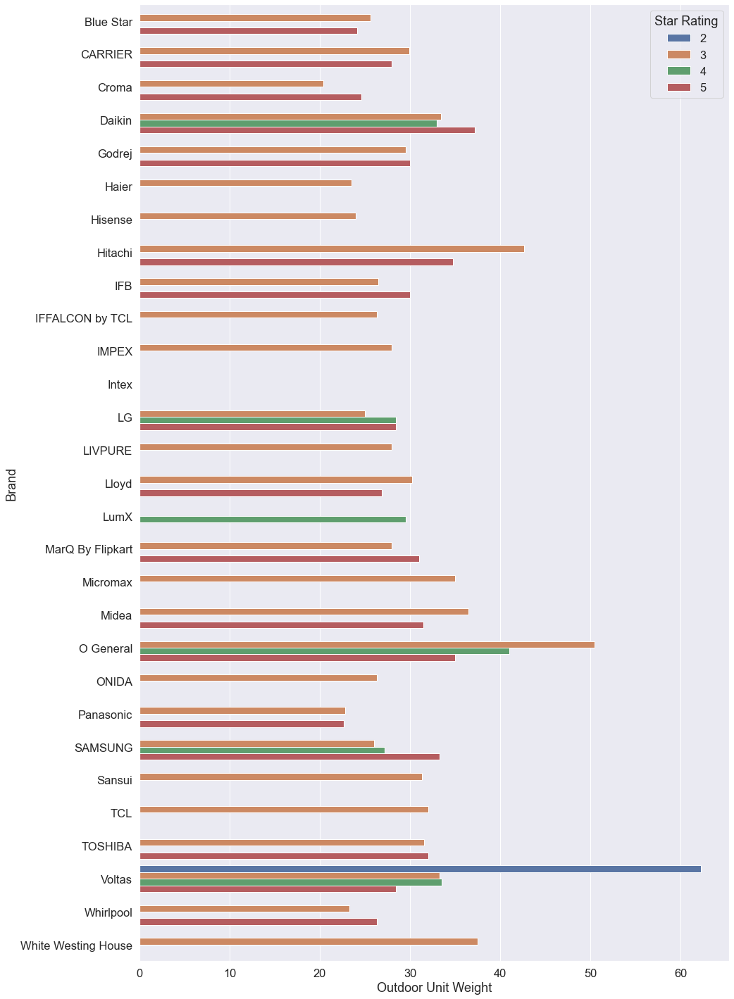

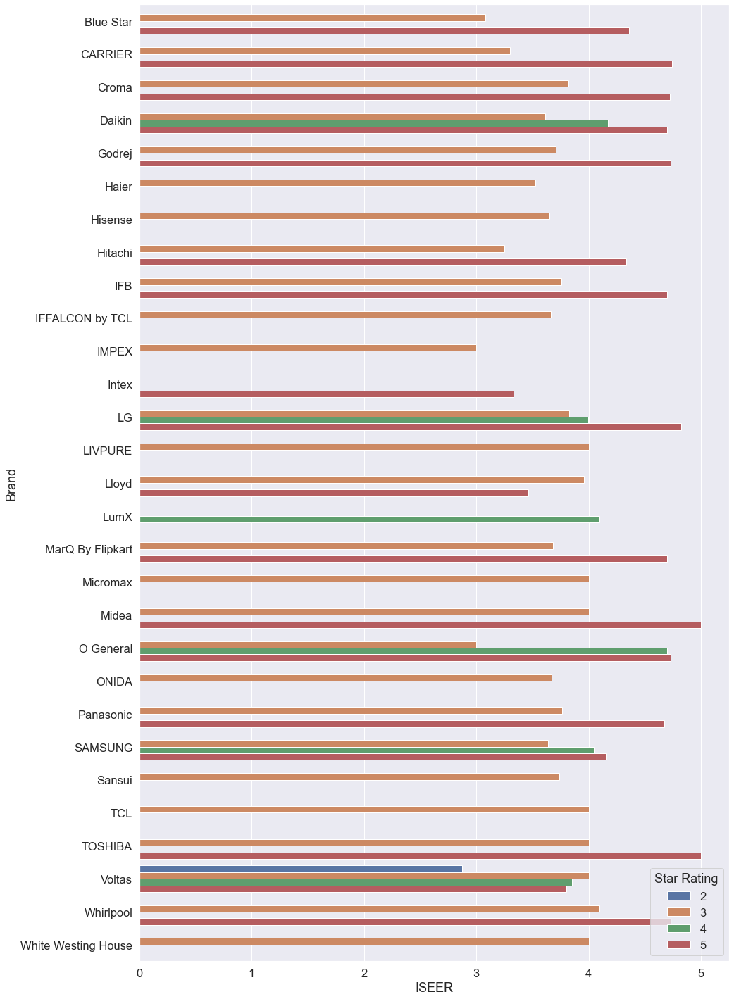

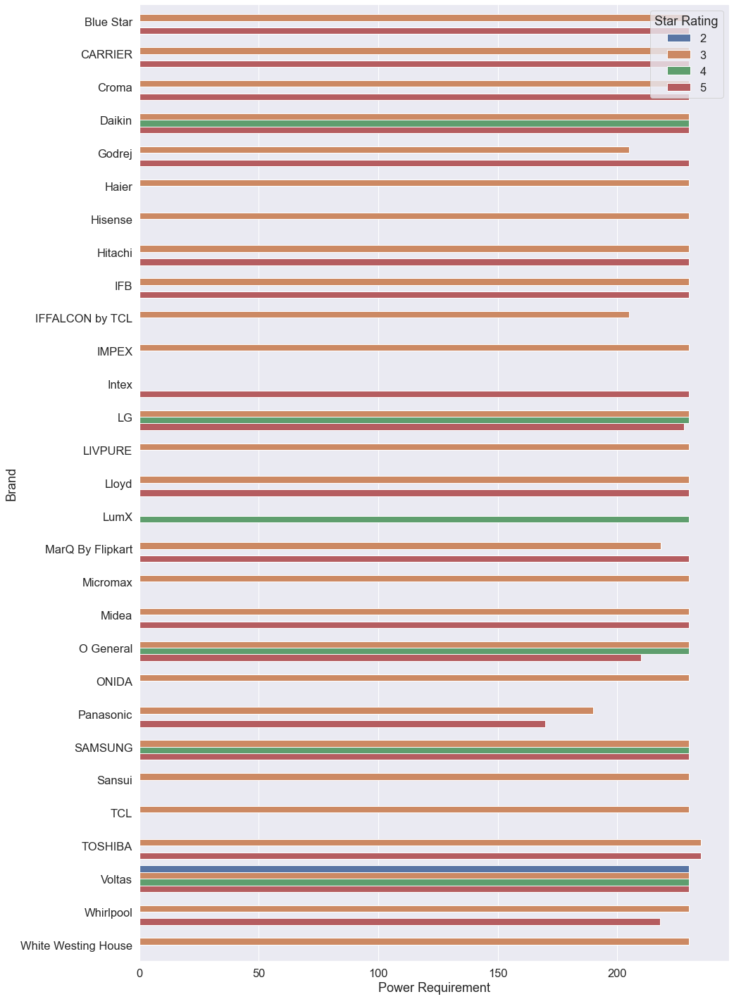

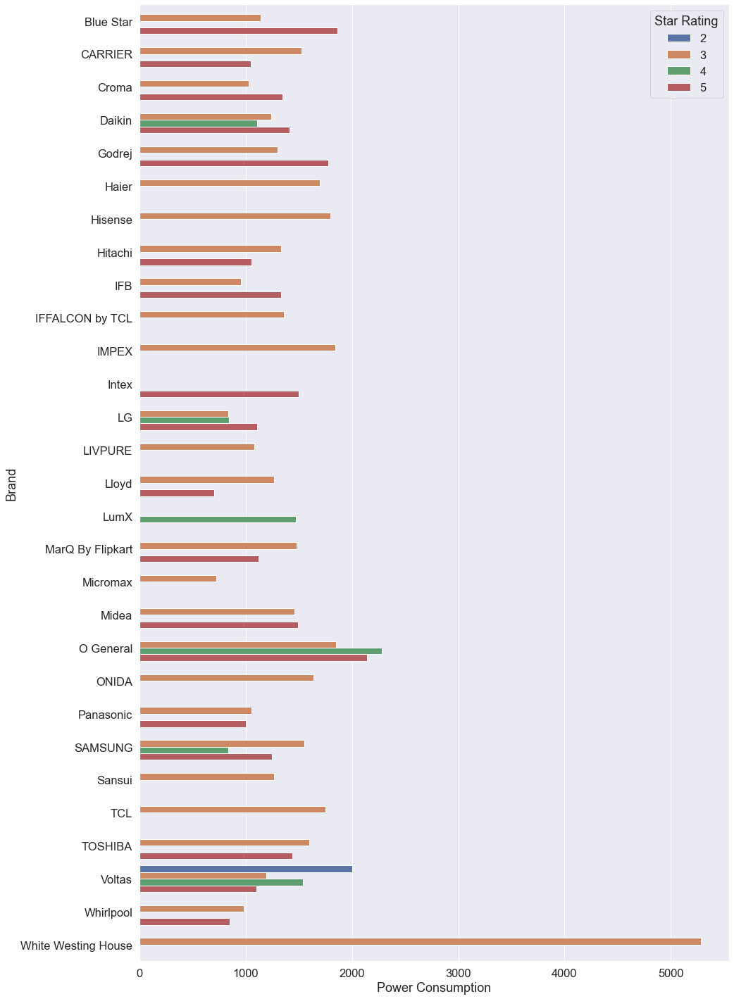

...

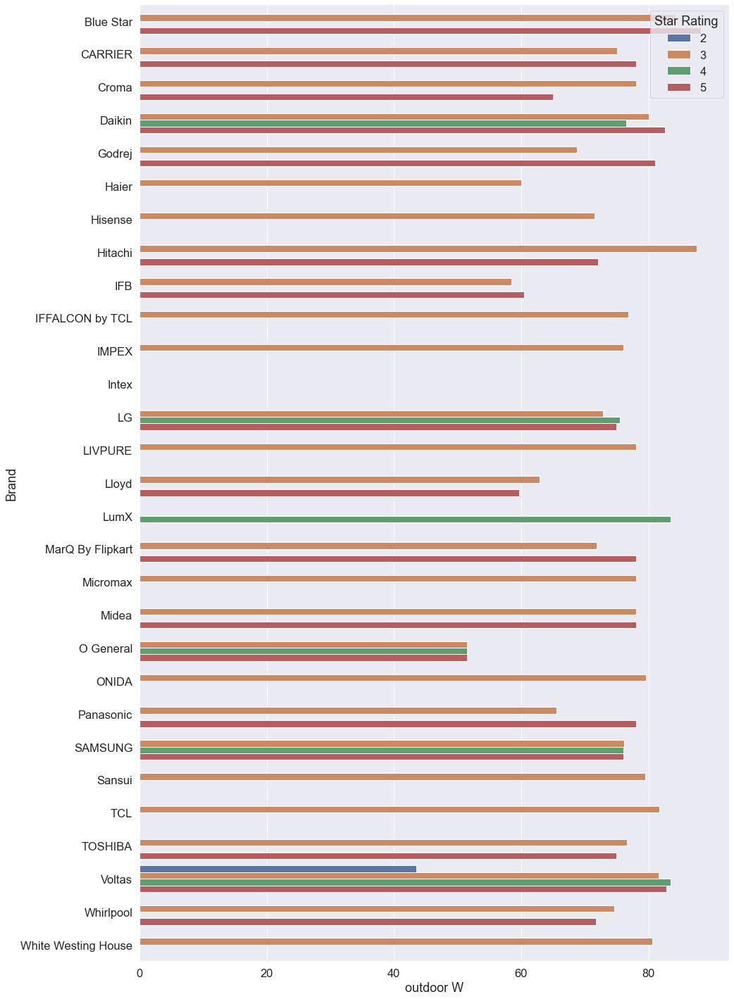

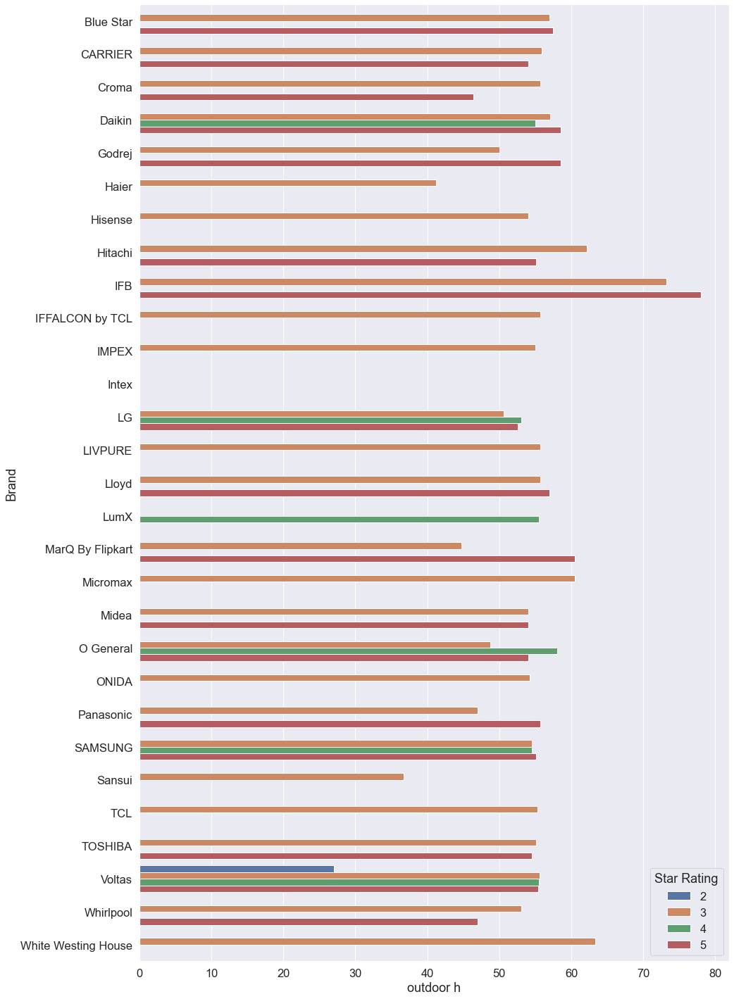

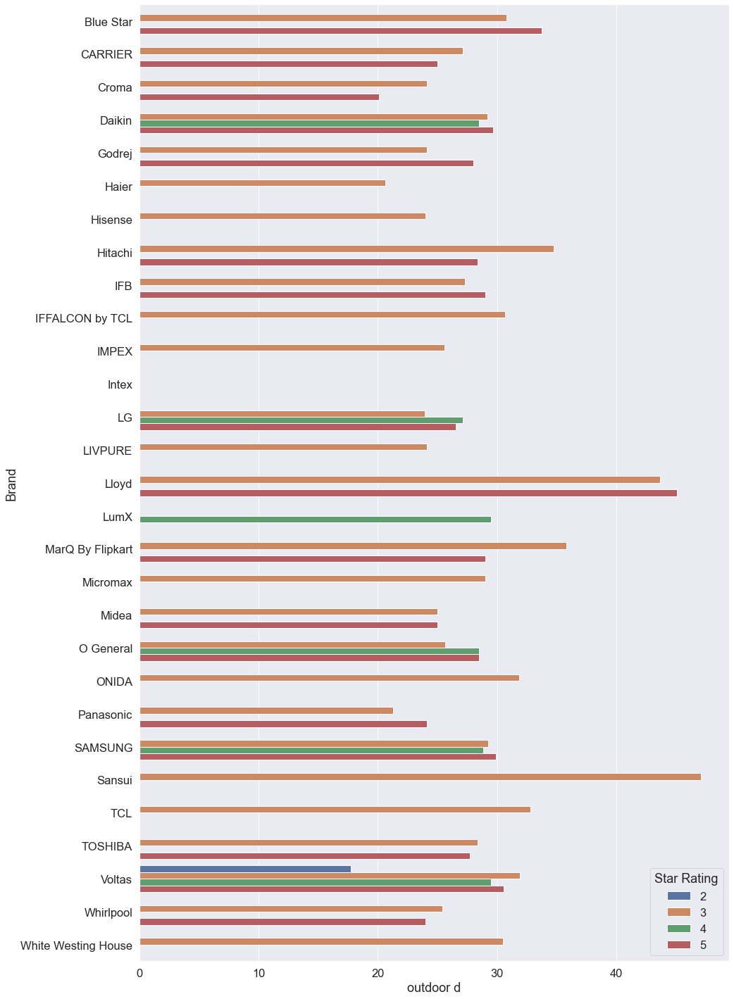

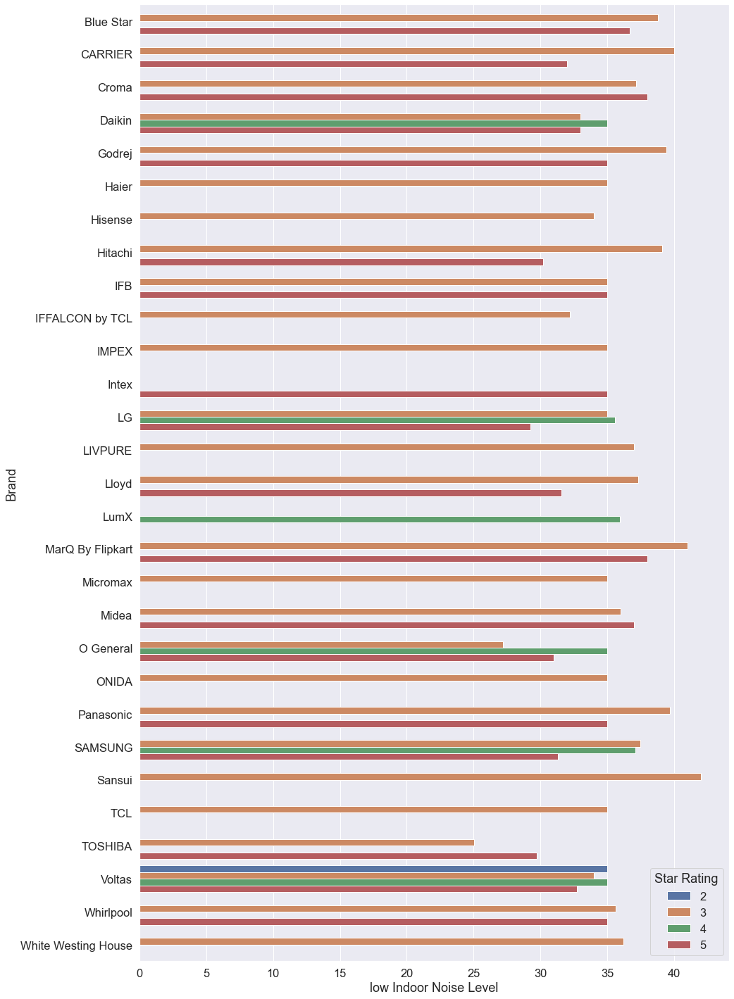

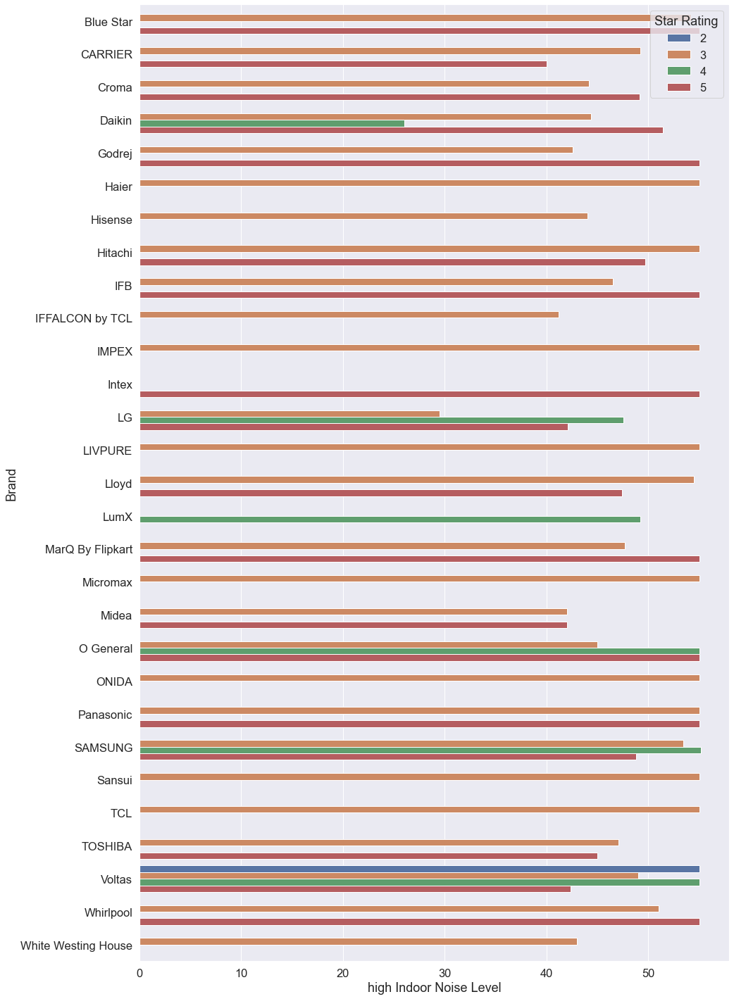

In [62]:
for x in li1:
    plt.figure(figsize=(15, 25))
    sns.barplot(y='Brand', x=x ,hue = "Star Rating",data=data,ci = None)

## Observations

1. voltas 2 star has highest weight.

2. Intex has no outdoor weight.

3. Indoor unit weights is lesser than outdoor unit weights.

4. Higher the ISEER higher the star rating.

5. Midea and Toshiba has highest ISEER value.

6. Almost all AC has same power requirement except few ACs.

7. Panasonic has lowest power requirement.

8. White Westing House has highest power consumption while Lloyd (5 star AC) and micromax Ac has lowest power consumption.

9. Toshiba has lowest low indoor noise while Sansui has highest has highest.

10. Daikin has lowest high indoor noise while most of them has same value of 55.

## MultiColinearity

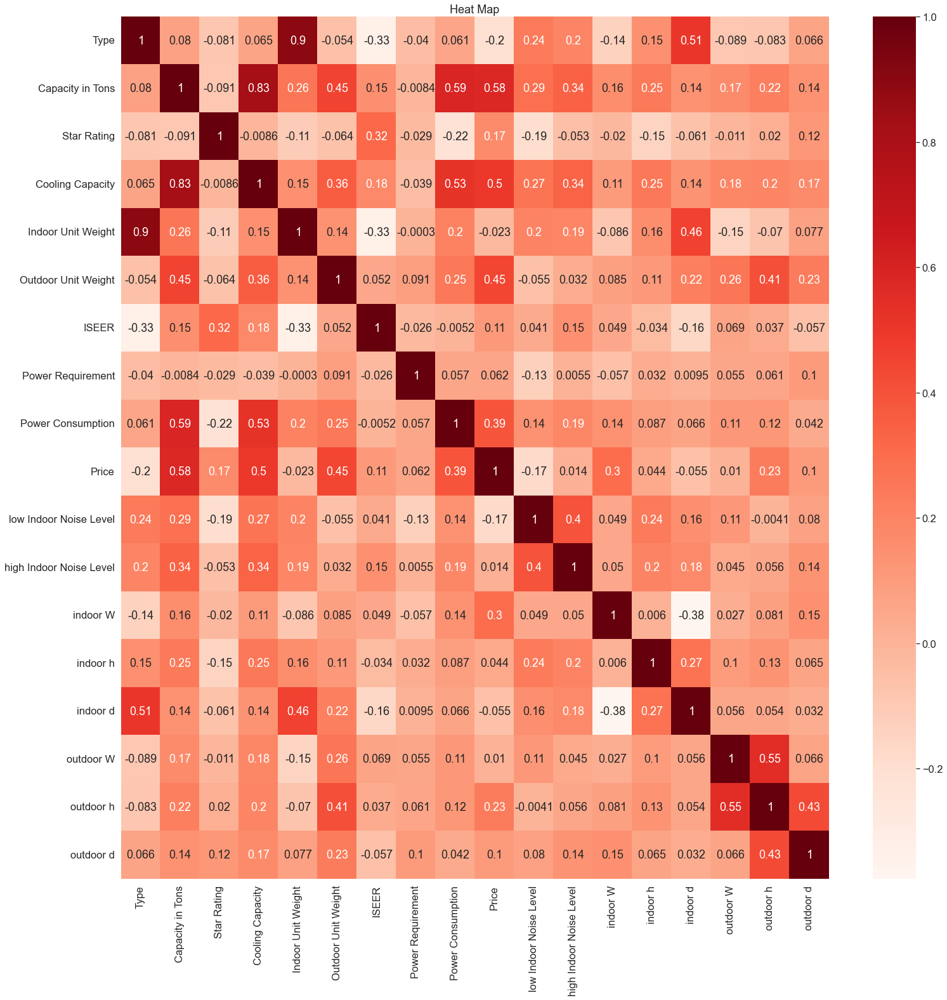

In [63]:
#setting style as dark
sns.set_style("dark")

#using .figure(figsize) for size
plt.figure(figsize=(25,25))

sns.heatmap(data.corr(),cmap=plt.cm.Reds,annot=True)

#.title() to give title to the graph
plt.title("Heat Map")

#to show graph
plt.show()

There is high multicolinearity between dimension columns, power consumption to Capacity and cooling capacity, indoor unit weight to type.